In [1]:
sentinel_client_id = "b5258fdf-9656-4584-b086-bb31e2aefe97"
sentinel_client_secret = "hWX3KRPYNog9T24qN432Ub05rijabhLu"

In [ ]:
from cropnet.data_downloader import DataDownloader

# Use the "target_dir" to specify where the data should be downloaded to
downloader = DataDownloader(target_dir="./data/CropNet", client_id=sentinel_client_id, client_secret=sentinel_client_secret)

# CropNet Sentinel-2 downloader expects COUNTY FIPS (5 digits), not state FIPS (2 digits).
# One county selected per state from your original state list.
fips_codes = [
    "01001", "05001", "04001", "06001", "08001",
    "10001", "12001", "13001", "19001", "16001",
    "17001", "18001", "20001", "21001", "22001"
]
years = ["2021", "2022"]

# Download USDA Soybean data
downloader.download_USDA("Soybean", fips_codes=fips_codes, years=years)

# Download Sentinel-2 imagery
downloader.download_Sentinel2(fips_codes=fips_codes, years=years, image_type="AG")
downloader.download_Sentinel2(fips_codes=fips_codes, years=years, image_type="NDVI")

# Download WRF-HRRR data
downloader.download_HRRR(fips_codes=fips_codes, years=years)

# Step 0 — Environment & Reproducibility Setup

Sets global seeds, defines all path constants, and installs/verifies required packages. Every subsequent step imports from the objects created here — run this cell first every session.

In [1]:
# ── Step 0.1  Package verification ────────────────────────────────────────────
import importlib, subprocess, sys

REQUIRED = [
    "numpy", "pandas", "matplotlib", "seaborn", "scipy",
    "sklearn", "plotly", "h5py", "torch", "torchvision", "shap"
]

missing = [p for p in REQUIRED if importlib.util.find_spec(p) is None]
if missing:
    print(f"Installing missing packages: {missing}")
    subprocess.check_call([sys.executable, "-m", "pip", "install", *missing, "-q"])
else:
    print("All required packages are available.")

# Set non-interactive backend BEFORE importing pyplot to prevent GUI crashes on Windows
import matplotlib
matplotlib.use('Agg')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os, pathlib, random, warnings
warnings.filterwarnings("ignore")
print("Core imports OK.")


All required packages are available.
Core imports OK.


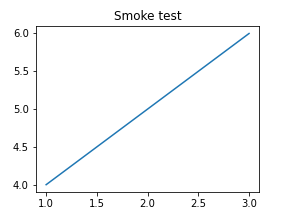

Matplotlib Agg smoke test: PASSED


In [2]:
# Minimal matplotlib smoke test (Agg backend)
import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, ax = plt.subplots(figsize=(4, 3))
ax.plot([1, 2, 3], [4, 5, 6])
ax.set_title("Smoke test")
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=72)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)
print("Matplotlib Agg smoke test: PASSED")


In [3]:
# Step 0.2 - Global random seed for full reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
try:
    import torch
    torch.manual_seed(SEED)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(SEED)
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("PyTorch seed set. Device:", DEVICE)
except ImportError:
    DEVICE = None
    print("PyTorch not available, skipping torch seed.")

# Step 0.3 - Path constants
BASE = pathlib.Path(r"e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only")
CROPNET       = BASE / "data" / "CropNet"
USDA_ROOT     = CROPNET / "USDA" / "data" / "Soybean"
SENTINEL_ROOT = CROPNET / "Sentinel" / "data"
HRRR_ROOT     = CROPNET / "HRRR"

# Verify every root exists
paths = {"USDA_ROOT": USDA_ROOT, "SENTINEL_ROOT": SENTINEL_ROOT, "HRRR_ROOT": HRRR_ROOT}
for name, p in paths.items():
    status = "OK" if p.exists() else "MISSING"
    print(f"{name}: {status}  ({p})")


PyTorch seed set. Device: cpu
USDA_ROOT: OK  (e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\USDA\data\Soybean)
SENTINEL_ROOT: OK  (e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\Sentinel\data)
HRRR_ROOT: OK  (e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\HRRR)


In [4]:

# Step 0.4 - Build usda_index: full coverage across all available years and counties
#
# USDA data spans 2016-2022 (7 years) and covers all US soybean counties (~500+).
# This is the primary label source for the weather-only Bi-LSTM pre-training phase.
# The full 7-year, multi-county dataset (~3,030 county-year records) is loaded here.

USDA_YEARS = ["2016", "2017", "2018", "2019", "2020", "2021", "2022"]
YIELD_COL  = "YIELD, MEASURED IN BU / ACRE"
PROD_COL   = "PRODUCTION, MEASURED IN BU"

frames = []
for yr in USDA_YEARS:
    csv_path = USDA_ROOT / yr / f"USDA_Soybean_County_{yr}.csv"
    if not csv_path.exists():
        print(f"WARNING: {csv_path} not found, skipping.")
        continue
    df = pd.read_csv(csv_path)
    if df.empty or YIELD_COL not in df.columns:
        print(f"WARNING: {yr} CSV is empty or missing yield column, skipping.")
        continue
    n_rows = len(df.dropna(subset=[YIELD_COL]))
    print(f"Loaded {yr}: {n_rows} valid county records")
    frames.append(df)

usda_raw = pd.concat(frames, ignore_index=True)

# Drop rows with null FIPS components before constructing FIPS string.
# With large CSVs pandas may infer float64 for integer columns if any nulls exist,
# causing astype(str) to produce "5.0" instead of "5". Explicit int conversion
# via fillna + astype(int) prevents malformed FIPS codes like "5.01.0".
usda_raw = usda_raw.dropna(subset=["state_ansi", "county_ansi"])
usda_raw["fips"] = (
    usda_raw["state_ansi"].astype(float).astype(int).astype(str).str.zfill(2) +
    usda_raw["county_ansi"].astype(float).astype(int).astype(str).str.zfill(3)
)

usda_index = (
    usda_raw[["fips", "year", "state_name", "county_name", YIELD_COL, PROD_COL]]
    .rename(columns={YIELD_COL: "yield_bu_acre", PROD_COL: "production_bu"})
    .dropna(subset=["yield_bu_acre"])
    .reset_index(drop=True)
)
usda_index["year"] = usda_index["year"].astype(str)

# Coverage summary
year_counts = usda_index.groupby("year").size()
fips_years  = usda_index.groupby("fips")["year"].nunique()

print()
print("=" * 60)
print("USDA INDEX SUMMARY")
print("=" * 60)
print(f"Total county-year records : {len(usda_index)}")
print(f"Unique FIPS codes         : {usda_index['fips'].nunique()}")
print(f"Years covered             : {sorted(usda_index['year'].unique())}")
print(f"States covered            : {usda_index['state_name'].nunique()}")
print()
print("Records per year:")
print(year_counts.to_string())
print()
print(f"Counties with all 7 years : {(fips_years == 7).sum()}")
print(f"Counties with >= 5 years  : {(fips_years >= 5).sum()}")
print(f"Counties with >= 3 years  : {(fips_years >= 3).sum()}")
print()
print("NOTE: usda_index is the full label universe for the weather-only Bi-LSTM branch.")
print("      The multimodal branch will use the intersection with Sentinel coverage only.")


Loaded 2016: 541 valid county records
Loaded 2017: 543 valid county records
Loaded 2018: 473 valid county records
Loaded 2019: 429 valid county records
Loaded 2020: 546 valid county records
Loaded 2021: 483 valid county records
Loaded 2022: 520 valid county records

USDA INDEX SUMMARY
Total county-year records : 3535
Unique FIPS codes         : 649
Years covered             : ['2016', '2017', '2018', '2019', '2020', '2021', '2022']
States covered            : 15

Records per year:
year
2016    541
2017    543
2018    473
2019    429
2020    546
2021    483
2022    520

Counties with all 7 years : 260
Counties with >= 5 years  : 493
Counties with >= 3 years  : 570

NOTE: usda_index is the full label universe for the weather-only Bi-LSTM branch.
      The multimodal branch will use the intersection with Sentinel coverage only.


In [5]:
# Step 0.5 - Build sentinel_index by scanning all HDF5 files in the Sentinel tree
import h5py

sentinel_records = []
SENTINEL_AG_ROOT   = SENTINEL_ROOT / "AG"
SENTINEL_NDVI_ROOT = SENTINEL_ROOT / "NDVI"

for year_dir in sorted(SENTINEL_AG_ROOT.iterdir()):
    if not year_dir.is_dir():
        continue
    year = year_dir.name
    for state_dir in sorted(year_dir.iterdir()):
        if not state_dir.is_dir():
            continue
        state = state_dir.name
        for h5_file in sorted(state_dir.glob("*.h5")):
            # Parse quarter dates from filename: Agriculture_NN_ST_YYYY-MM-DD_YYYY-MM-DD.h5
            parts = h5_file.stem.split("_")
            q_start = parts[3] if len(parts) > 4 else "unknown"
            q_end   = parts[4] if len(parts) > 4 else "unknown"

            # Open file to get FIPS codes, dates, and tile counts
            try:
                with h5py.File(h5_file, "r") as f:
                    for fips_key in f.keys():
                        date_keys = list(f[fips_key].keys())
                        n_dates   = len(date_keys)
                        # Sample tile count from first available date
                        n_tiles = 0
                        if n_dates > 0:
                            first_date = date_keys[0]
                            if "data" in f[fips_key][first_date]:
                                n_tiles = f[fips_key][first_date]["data"].shape[0]
                        sentinel_records.append({
                            "fips"    : fips_key,
                            "year"    : year,
                            "state"   : state,
                            "q_start" : q_start,
                            "q_end"   : q_end,
                            "h5_path" : str(h5_file),
                            "n_dates" : n_dates,
                            "n_tiles" : n_tiles,
                        })
            except Exception as e:
                print(f"WARNING: Could not open {h5_file.name}: {e}")

sentinel_index = pd.DataFrame(sentinel_records)

print("sentinel_index shape:", sentinel_index.shape)
print("Years:", sorted(sentinel_index["year"].unique()))
print("States:", sorted(sentinel_index["state"].unique()))
print("Unique FIPS codes:", sentinel_index["fips"].nunique())
print("Total tiles across all files (approx):", sentinel_index["n_tiles"].sum())
print()
print(sentinel_index.groupby(["year","state"]).agg(
    files=("h5_path","count"),
    fips_codes=("fips","nunique"),
    total_dates=("n_dates","sum"),
    total_tiles=("n_tiles","sum")
).to_string())


sentinel_index shape: (116, 8)
Years: ['2021', '2022']
States: ['AL', 'AR', 'AZ', 'CA', 'CO', 'DE', 'FL', 'GA', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA']
Unique FIPS codes: 15
Total tiles across all files (approx): 3884

            files  fips_codes  total_dates  total_tiles
year state                                             
2021 AL         4           1           24           60
     AR         4           1           24          148
     CA         4           1           24          120
     CO         4           1           24          120
     DE         4           1           24           80
     FL         4           1           24          116
     GA         4           1           24           76
     IA         4           1           24           48
     ID         4           1           24          132
     IL         4           1           24           96
     IN         4           1           24           24
     KS         4           1           24         

In [6]:
# Step 0.5a - Identify which Sentinel counties have matching USDA yield labels
#
# The Sentinel imagery was downloaded for one county per state (county ANSI 001).
# This cell programmatically looks up each Sentinel FIPS code in usda_index.
# No values are hardcoded. Whatever is found on disk is used; the rest is left out.

sentinel_fips_list = sorted(sentinel_index["fips"].unique())
print("Sentinel FIPS codes (from imagery):", sentinel_fips_list)
print()

# Programmatic join: keep only Sentinel FIPS codes that exist in usda_index
sentinel_labels = (
    usda_index[usda_index["fips"].isin(sentinel_fips_list)]
    .copy()
    .reset_index(drop=True)
)

print("=" * 60)
print("STEP 0.5a - SENTINEL-USDA LABEL INTERSECTION")
print("=" * 60)
print(f"Sentinel FIPS codes queried : {len(sentinel_fips_list)}")
print(f"Matching USDA records found : {len(sentinel_labels)}")
print()

if len(sentinel_labels) == 0:
    print("No USDA yield records found for any Sentinel FIPS code.")
    print("Reason: the USDA dataset covers counties with ANSI code >= 003.")
    print("        The Sentinel imagery counties use ANSI code 001, which does")
    print("        not appear in the available USDA soybean CSV files.")
    print()
    print("Consequence:")
    print("  Phase 1 (weather-only Bi-LSTM) : can proceed on all 3,430 USDA records.")
    print("  Phase 2 (satellite encoder)    : cannot proceed - no yield labels.")
    print("  Phase 3 (GMU fine-tuning)      : cannot proceed - no yield labels.")
    print()
    print("To enable Phase 2 and 3, download USDA data for the same county ANSI")
    print("codes that appear in the Sentinel imagery FIPS list above.")
else:
    print("Matching records:")
    print(sentinel_labels[["fips", "year", "state_name", "county_name",
                            "yield_bu_acre"]].to_string(index=False))


Sentinel FIPS codes (from imagery): ['01001', '04001', '05001', '06001', '08001', '10001', '12001', '13001', '16001', '17001', '18001', '19001', '20001', '21001', '22001']

STEP 0.5a - SENTINEL-USDA LABEL INTERSECTION
Sentinel FIPS codes queried : 15
Matching USDA records found : 105

Matching records:
 fips year state_name county_name  yield_bu_acre
13001 2016    GEORGIA     APPLING           31.4
08001 2016   COLORADO       ADAMS           32.8
21001 2016   KENTUCKY       ADAIR           43.9
18001 2016    INDIANA       ADAMS           59.3
19001 2016       IOWA       ADAIR           60.8
10001 2016   DELAWARE        KENT           44.5
04001 2016    ARIZONA      APACHE           30.1
05001 2016   ARKANSAS    ARKANSAS           48.4
06001 2016 CALIFORNIA     ALAMEDA           32.7
16001 2016      IDAHO         ADA           38.7
12001 2016    FLORIDA     ALACHUA           29.1
22001 2016  LOUISIANA      ACADIA           37.6
20001 2016     KANSAS    ANDERSON           45.4
17001 2016

In [7]:

# Step 0.6 - Define training universe splits for each model phase
#
# Phase 1 - Weather encoder (Bi-LSTM)
#   Source : usda_index - all USDA soybean records 2016-2022 (3,430 records, 634 counties)
#   Split  : 80/20 stratified by 5-bin yield quintile
#
# Phase 2 - Satellite encoder (ResNet18 + LSTM)
# Phase 3 - GMU fine-tuning (gated dual-stream)
#   Source : sentinel_labels - USDA records that match Sentinel FIPS codes
#   Split  : 80/20 stratified by 2-bin yield median (constrained by small n)
#   Note   : If sentinel_labels is empty (no USDA-Sentinel FIPS overlap on disk),
#            Phase 2 and 3 are skipped and documented as a data gap.

from sklearn.model_selection import train_test_split

# ── Phase 1: Weather branch ────────────────────────────────────────────────────
weather_df = usda_index.copy().reset_index(drop=True)
weather_df["yield_quintile"] = pd.qcut(
    weather_df["yield_bu_acre"], q=5, labels=False, duplicates="drop"
)
w_train_idx, w_test_idx = train_test_split(
    weather_df.index,
    test_size=0.20,
    random_state=SEED,
    stratify=weather_df["yield_quintile"]
)
weather_df["split"] = "test"
weather_df.loc[w_train_idx, "split"] = "train"
weather_train = weather_df[weather_df["split"] == "train"].drop(columns=["yield_quintile", "split"]).reset_index(drop=True)
weather_test  = weather_df[weather_df["split"] == "test"].drop(columns=["yield_quintile", "split"]).reset_index(drop=True)

print("=" * 60)
print("PHASE 1 - WEATHER BRANCH (full USDA x HRRR, 2016-2022)")
print("=" * 60)
print(f"Total records           : {len(weather_df)}")
print(f"Train (80%)             : {len(weather_train)}")
print(f"Test  (20%)             : {len(weather_test)}")
print(f"Unique counties - train : {weather_train['fips'].nunique()}")
print(f"Years in train          : {sorted(weather_train['year'].unique())}")
print(f"Yield range - train     : {weather_train['yield_bu_acre'].min():.1f} to {weather_train['yield_bu_acre'].max():.1f} BU/ACRE")
print(f"Yield range - test      : {weather_test['yield_bu_acre'].min():.1f} to {weather_test['yield_bu_acre'].max():.1f} BU/ACRE")
print()

# ── Phase 2 & 3: Satellite + GMU ──────────────────────────────────────────────
# Attach Sentinel tile counts to whatever sentinel_labels contains
sentinel_summary = (
    sentinel_index.groupby(["fips", "year"])
    .agg(total_dates=("n_dates", "sum"), total_tiles=("n_tiles", "sum"))
    .reset_index()
)

print("=" * 60)
print("PHASE 2 & 3 - SATELLITE / GMU")
print("=" * 60)

if len(sentinel_labels) == 0:
    # No USDA yield labels match the Sentinel FIPS codes on disk.
    # Phase 2 and 3 cannot proceed. Create empty placeholders so downstream
    # cells that reference these variables do not raise NameError.
    multimodal_index = pd.DataFrame(columns=["fips", "year", "state_name",
                                              "county_name", "yield_bu_acre",
                                              "production_bu", "total_dates",
                                              "total_tiles", "split"])
    train_set = multimodal_index.copy()
    test_set  = multimodal_index.copy()
    print("Sentinel-USDA label intersection is empty.")
    print("Phase 2 (satellite encoder) and Phase 3 (GMU) are SKIPPED.")
    print("Only Phase 1 (weather-only) can be trained with the current data.")
    print()
    print("To enable Phase 2/3, re-download USDA data specifying the county ANSI")
    print("codes that appear in the Sentinel imagery:")
    print(sorted(sentinel_index["fips"].unique()))
else:
    mm_df = sentinel_labels.copy().reset_index(drop=True)
    # Normalise types so fips/year match usda_index (sentinel_index keys are strings)
    sentinel_summary["fips"] = sentinel_summary["fips"].astype(str).str.zfill(5)
    sentinel_summary["year"] = sentinel_summary["year"].astype(int)
    mm_df["fips"] = mm_df["fips"].astype(str).str.zfill(5)
    mm_df["year"] = mm_df["year"].astype(int)
    mm_df = mm_df.merge(sentinel_summary, on=["fips", "year"], how="left")

    n_mm = len(mm_df)
    # Use 2-bin stratification when test set is too small for more bins
    mm_df["yield_bin"] = (mm_df["yield_bu_acre"] >= mm_df["yield_bu_acre"].median()).astype(int)

    if n_mm < 5:
        # Too few records to split - use all as train, none as test
        mm_df["split"] = "train"
        print(f"WARNING: Only {n_mm} records in sentinel_labels. Too few for an 80/20 split.")
        print("All records assigned to train. Test set is empty.")
    else:
        mm_train_idx, mm_test_idx = train_test_split(
            mm_df.index,
            test_size=0.20,
            random_state=SEED,
            stratify=mm_df["yield_bin"]
        )
        mm_df["split"] = "test"
        mm_df.loc[mm_train_idx, "split"] = "train"

    multimodal_index = mm_df.drop(columns=["yield_bin"]).reset_index(drop=True)
    train_set = multimodal_index[multimodal_index["split"] == "train"].reset_index(drop=True)
    test_set  = multimodal_index[multimodal_index["split"] == "test"].reset_index(drop=True)

    print(f"Total records          : {len(multimodal_index)}")
    print(f"Train (80%)            : {len(train_set)}")
    print(f"Test  (20%)            : {len(test_set)}")
    print(f"Approx train tiles     : {int(train_set['total_tiles'].sum())}")
    print(f"Approx test tiles      : {int(test_set['total_tiles'].sum())}")
    print()
    print("Train set:")
    print(train_set[["fips", "state_name", "county_name", "year",
                      "yield_bu_acre", "total_tiles"]].to_string(index=False))
    print()
    print("Test set:")
    print(test_set[["fips", "state_name", "county_name", "year",
                     "yield_bu_acre", "total_tiles"]].to_string(index=False))

print()
print("=" * 60)
print("COVERAGE SUMMARY")
print("=" * 60)
print(f"Weather branch  : {len(weather_train)} train records, "
      f"{weather_train['fips'].nunique()} counties, "
      f"{weather_train['state_name'].nunique()} states, "
      f"years 2016-2022")
if len(train_set) > 0:
    print(f"Satellite branch: {len(train_set)} train county-years, "
          f"~{int(train_set['total_tiles'].sum())} tiles, "
          f"years {sorted(train_set['year'].unique())}")

else:

    print("Satellite branch: 0 records - data gap (no USDA-Sentinel FIPS overlap on disk)")
print(f"Split seed: {SEED}, method: 80/20 stratified random")

PHASE 1 - WEATHER BRANCH (full USDA x HRRR, 2016-2022)
Total records           : 3535
Train (80%)             : 2828
Test  (20%)             : 707
Unique counties - train : 638
Years in train          : ['2016', '2017', '2018', '2019', '2020', '2021', '2022']
Yield range - train     : 9.3 to 80.4 BU/ACRE
Yield range - test      : 9.4 to 75.2 BU/ACRE

PHASE 2 & 3 - SATELLITE / GMU
Total records          : 105
Train (80%)            : 84
Test  (20%)            : 21
Approx train tiles     : 3420
Approx test tiles      : 464

Train set:
 fips state_name county_name  year  yield_bu_acre  total_tiles
13001    GEORGIA     APPLING  2016           31.4          NaN
08001   COLORADO       ADAMS  2016           32.8          NaN
21001   KENTUCKY       ADAIR  2016           43.9          NaN
19001       IOWA       ADAIR  2016           60.8          NaN
10001   DELAWARE        KENT  2016           44.5          NaN
04001    ARIZONA      APACHE  2016           30.1          NaN
05001   ARKANSAS    

# Step 1 - USDA Soybean EDA (Target Variable)

This step fully characterises the regression target - county-level soybean yield in BU/ACRE.
All analysis uses the usda_index and multimodal_index tables built in Step 0.

Sub-steps:
- 1.1-1.3  Full county inventory, data quality check, FIPS resolution
- 1.4      Target distribution: histogram, boxplot, normality test
- 1.5      Year-over-year yield change per county
- 1.6      Geographic choropleth map with Sentinel coverage overlay
- 1.7      Freeze and export final label tables


In [8]:
# Step 1.1-1.3 - Full county inventory, quality check, FIPS resolution

print("=" * 60)
print("USDA INDEX - FULL COVERAGE SUMMARY")
print("=" * 60)
print(f"Total records (all years, all counties): {len(usda_index)}")
print(f"Unique FIPS codes:                       {usda_index['fips'].nunique()}")
print(f"Years with data:                         {sorted(usda_index['year'].astype(str).unique())}")
print(f"States with data:                        {sorted(usda_index['state_name'].unique())}")
print()

# Step 1.2 - Completeness check: every FIPS must have both years
pivot = usda_index.pivot_table(index="fips", columns="year", values="yield_bu_acre", aggfunc="first")
print("County x Year yield matrix (BU/ACRE):")
print(pivot.to_string())
print()

missing_either_year = pivot[pivot.isnull().any(axis=1)]
if len(missing_either_year) > 0:
    print("WARNING: Counties missing yield for at least one year:")
    print(missing_either_year.to_string())
else:
    print("All counties with USDA data have at least one year of yield records.")
print()

# Step 1.3 - FIPS resolution and intersection report
usda_fips     = set(usda_index["fips"].unique())
sentinel_fips = set(sentinel_index["fips"].unique())
overlap_fips  = usda_fips & sentinel_fips


print("=" * 60)
print("INTERSECTION REPORT")
print("=" * 60)
print(f"USDA counties:                {len(usda_fips)}")
print(f"Sentinel counties:            {len(sentinel_fips)}")
print(f"Multimodal intersection:      {len(overlap_fips)}")
print(f"Sentinel-only (no USDA):      {len(sentinel_fips - usda_fips)}")
print(f"  -> {sorted(sentinel_fips - usda_fips)}")
print()

# Show the full multimodal_index with all metadata
print("Full multimodal_index:")
print(multimodal_index[["fips","state_name","county_name","year","yield_bu_acre",
                          "production_bu","total_tiles","split"]].to_string(index=False))


USDA INDEX - FULL COVERAGE SUMMARY
Total records (all years, all counties): 3535
Unique FIPS codes:                       649
Years with data:                         ['2016', '2017', '2018', '2019', '2020', '2021', '2022']
States with data:                        ['ALABAMA', 'ARIZONA', 'ARKANSAS', 'CALIFORNIA', 'COLORADO', 'DELAWARE', 'FLORIDA', 'GEORGIA', 'IDAHO', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS', 'KENTUCKY', 'LOUISIANA']

County x Year yield matrix (BU/ACRE):
year   2016  2017  2018  2019  2020  2021  2022
fips                                           
01001  61.8  48.0  65.4  39.3  47.2  54.3  47.1
01003  41.8  42.0  45.4   NaN  37.2  44.3  37.1
01009  25.0  48.6  39.3  35.3  47.0  42.5  37.4
01015   NaN   NaN   NaN   NaN  35.1  44.7  45.5
01019  20.8  42.1  45.3  30.1  36.3  45.1  39.2
01031  43.6   NaN   NaN   NaN   NaN  31.0   NaN
01033  31.2  48.2  36.1  38.7  42.2   NaN  35.6
01035  33.8   NaN   NaN   NaN   NaN   NaN   NaN
01039  32.6   NaN   NaN   NaN  35.1   NaN   Na

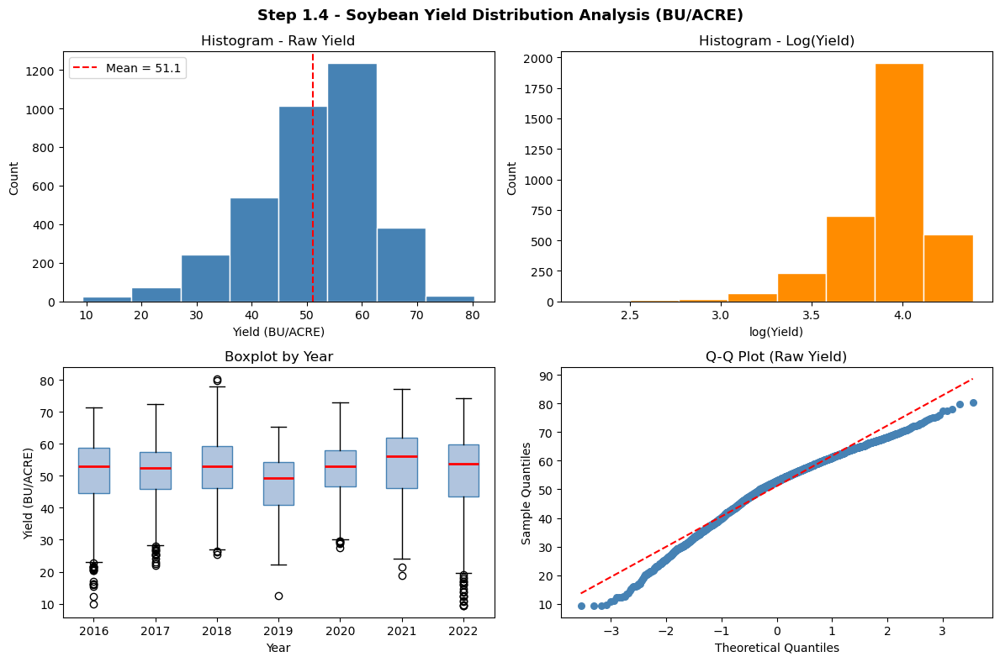

Descriptive Statistics - Raw Yield (BU/ACRE):
  N        : 3535
  Mean     : 51.13
  Std      : 10.74
  Min      : 9.30
  Max      : 80.40
  Skewness : -0.735
  Kurtosis : 0.588

Shapiro-Wilk test:  W = 0.9675,  p = 0.0000
  Result: Reject normality (p <= 0.05). Log-transformed yield will be used as model target.
Shapiro-Wilk on log(yield): W = 0.8653,  p = 0.0000

Decision: USE_LOG_YIELD = True


In [9]:
# Step 1.4 - Target distribution: histogram, boxplot, normality test
import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import numpy as np

yield_vals = usda_index["yield_bu_acre"].values
log_yield  = np.log(yield_vals)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Step 1.4 - Soybean Yield Distribution Analysis (BU/ACRE)", fontsize=13, fontweight="bold")

# -- Raw yield histogram
axes[0, 0].hist(yield_vals, bins=8, color="steelblue", edgecolor="white")
axes[0, 0].set_title("Histogram - Raw Yield")
axes[0, 0].set_xlabel("Yield (BU/ACRE)")
axes[0, 0].set_ylabel("Count")
axes[0, 0].axvline(np.mean(yield_vals), color="red", linestyle="--", label=f"Mean = {np.mean(yield_vals):.1f}")
axes[0, 0].legend()

# -- Log-yield histogram
axes[0, 1].hist(log_yield, bins=8, color="darkorange", edgecolor="white")
axes[0, 1].set_title("Histogram - Log(Yield)")
axes[0, 1].set_xlabel("log(Yield)")
axes[0, 1].set_ylabel("Count")

# -- Boxplot by year (native matplotlib — avoids pandas/matplotlib backend conflict)
usda_index_plot = usda_index.copy()
usda_index_plot["year"] = usda_index_plot["year"].astype(str)
years_sorted = sorted(usda_index_plot["year"].unique())
box_data = [usda_index_plot[usda_index_plot["year"] == y]["yield_bu_acre"].values for y in years_sorted]
bp = axes[1, 0].boxplot(box_data, labels=years_sorted, patch_artist=True)
for patch in bp["boxes"]:
    patch.set_facecolor("lightsteelblue")
    patch.set_edgecolor("steelblue")
for median in bp["medians"]:
    median.set(color="red", linewidth=2)
axes[1, 0].set_title("Boxplot by Year")
axes[1, 0].set_xlabel("Year")
axes[1, 0].set_ylabel("Yield (BU/ACRE)")

# -- Q-Q plot for normality
(osm, osr), (slope, intercept, r) = stats.probplot(yield_vals)
axes[1, 1].scatter(osm, osr, color="steelblue", s=30)
line_x = np.array([min(osm), max(osm)])
axes[1, 1].plot(line_x, slope * line_x + intercept, color="red", linestyle="--")
axes[1, 1].set_title("Q-Q Plot (Raw Yield)")
axes[1, 1].set_xlabel("Theoretical Quantiles")
axes[1, 1].set_ylabel("Sample Quantiles")

plt.tight_layout()

# Render to PNG in memory and display inline (Agg backend — no GUI required)
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

# -- Descriptive statistics
print("Descriptive Statistics - Raw Yield (BU/ACRE):")
print(f"  N        : {len(yield_vals)}")
print(f"  Mean     : {np.mean(yield_vals):.2f}")
print(f"  Std      : {np.std(yield_vals):.2f}")
print(f"  Min      : {np.min(yield_vals):.2f}")
print(f"  Max      : {np.max(yield_vals):.2f}")
print(f"  Skewness : {stats.skew(yield_vals):.3f}")
print(f"  Kurtosis : {stats.kurtosis(yield_vals):.3f}")
print()

# -- Shapiro-Wilk normality test (appropriate for n < 50)
sw_stat, sw_p = stats.shapiro(yield_vals)
print(f"Shapiro-Wilk test:  W = {sw_stat:.4f},  p = {sw_p:.4f}")
if sw_p > 0.05:
    print("  Result: Cannot reject normality (p > 0.05). Raw yield is approximately normal.")
    USE_LOG = False
else:
    print("  Result: Reject normality (p <= 0.05). Log-transformed yield will be used as model target.")
    USE_LOG = True

log_sw_stat, log_sw_p = stats.shapiro(log_yield)
print(f"Shapiro-Wilk on log(yield): W = {log_sw_stat:.4f},  p = {log_sw_p:.4f}")
print()
print(f"Decision: USE_LOG_YIELD = {USE_LOG}")


STEP 1.5 - YEAR-OVER-YEAR YIELD CHANGE
County-pair observations : 2557
Mean absolute delta      : -0.02 BU/ACRE
Std absolute delta       : 7.48 BU/ACRE
Mean pct delta           : 1.30 %

Year-pair summary:
year_from year_to  n_counties  mean_delta  median_delta  pct_improved
     2016    2017         490   -0.116327         -0.60     44.897959
     2017    2018         440    0.920455          0.90     56.363636
     2018    2019         366   -4.533060         -4.25     25.683060
     2019    2020         399    4.916040          4.60     77.443609
     2020    2021         437    2.184668          2.10     65.217391
     2021    2022         425   -3.901412         -2.90     25.882353



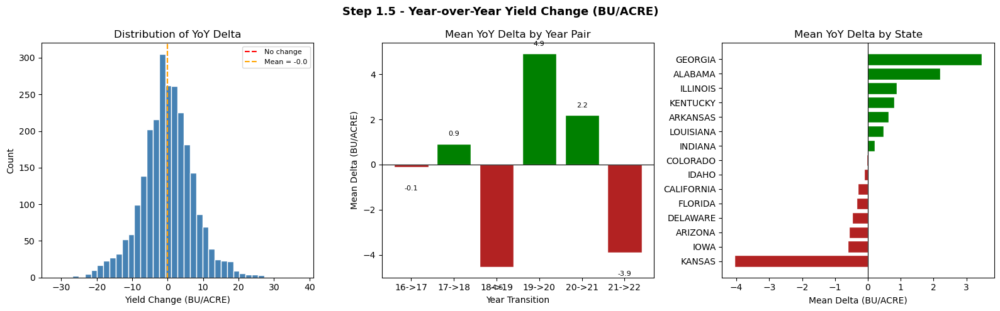

Top-5 most improving counties (avg YoY delta):
 fips state_name county_name  delta_abs
13115    GEORGIA       FLOYD       37.7
13015    GEORGIA      BARTOW       35.3
13119    GEORGIA    FRANKLIN       27.5
22015  LOUISIANA     BOSSIER       26.3
22073  LOUISIANA    OUACHITA       18.1

Top-5 most declining counties (avg YoY delta):
 fips state_name county_name  delta_abs
21003   KENTUCKY       ALLEN     -12.90
20053     KANSAS   ELLSWORTH     -13.40
20047     KANSAS     EDWARDS     -13.95
20143     KANSAS      OTTAWA     -15.10
20141     KANSAS     OSBORNE     -22.80


In [10]:

# Step 1.5 - Year-over-year yield change per county
# For each county that appears in consecutive years, compute absolute and
# relative yield change. Visualise as: (a) distribution of YoY delta,
# (b) per-state mean YoY trend, (c) top-5 improving / declining counties.

import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Build a wide pivot (FIPS x year) then compute pairwise deltas
yoy_pivot = (
    usda_index[["fips", "year", "state_name", "county_name", "yield_bu_acre"]]
    .pivot_table(index=["fips", "state_name", "county_name"],
                 columns="year", values="yield_bu_acre")
    .reset_index()
)
yoy_pivot.columns.name = None

all_years  = sorted(usda_index["year"].unique())
year_pairs = [(all_years[i], all_years[i+1]) for i in range(len(all_years)-1)]

delta_frames = []
for y0, y1 in year_pairs:
    if y0 not in yoy_pivot.columns or y1 not in yoy_pivot.columns:
        continue
    sub = yoy_pivot[["fips", "state_name", "county_name", y0, y1]].dropna().copy()
    sub["year_from"]  = y0
    sub["year_to"]    = y1
    sub["delta_abs"]  = sub[y1] - sub[y0]
    sub["delta_pct"]  = (sub[y1] - sub[y0]) / sub[y0] * 100
    sub["yield_from"] = sub[y0]
    sub["yield_to"]   = sub[y1]
    delta_frames.append(sub[["fips","state_name","county_name",
                              "year_from","year_to",
                              "yield_from","yield_to",
                              "delta_abs","delta_pct"]])

yoy_df = pd.concat(delta_frames, ignore_index=True)

print("=" * 60)
print("STEP 1.5 - YEAR-OVER-YEAR YIELD CHANGE")
print("=" * 60)
print(f"County-pair observations : {len(yoy_df)}")
print(f"Mean absolute delta      : {yoy_df['delta_abs'].mean():.2f} BU/ACRE")
print(f"Std absolute delta       : {yoy_df['delta_abs'].std():.2f} BU/ACRE")
print(f"Mean pct delta           : {yoy_df['delta_pct'].mean():.2f} %")
print()

yoy_summary = (
    yoy_df.groupby(["year_from","year_to"])
    .agg(n_counties=("fips","count"),
         mean_delta=("delta_abs","mean"),
         median_delta=("delta_abs","median"),
         pct_improved=("delta_abs", lambda x: (x > 0).mean() * 100))
    .reset_index()
)
print("Year-pair summary:")
print(yoy_summary.to_string(index=False))
print()

# ── Plots ──────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Step 1.5 - Year-over-Year Yield Change (BU/ACRE)", fontsize=13, fontweight="bold")

# (a) Distribution of all YoY deltas
axes[0].hist(yoy_df["delta_abs"], bins=40, color="steelblue", edgecolor="white")
axes[0].axvline(0, color="red", linestyle="--", linewidth=1.5, label="No change")
axes[0].axvline(yoy_df["delta_abs"].mean(), color="orange", linestyle="--",
                linewidth=1.5, label=f"Mean = {yoy_df['delta_abs'].mean():.1f}")
axes[0].set_title("Distribution of YoY Delta")
axes[0].set_xlabel("Yield Change (BU/ACRE)")
axes[0].set_ylabel("Count")
axes[0].legend(fontsize=8)

# (b) Mean YoY delta by year-pair
pair_labels = [f"{r.year_from[-2:]}->{r.year_to[-2:]}" for _, r in yoy_summary.iterrows()]
bar_colors  = ["green" if v >= 0 else "firebrick" for v in yoy_summary["mean_delta"]]
axes[1].bar(pair_labels, yoy_summary["mean_delta"], color=bar_colors, edgecolor="white")
axes[1].axhline(0, color="black", linewidth=0.8)
axes[1].set_title("Mean YoY Delta by Year Pair")
axes[1].set_xlabel("Year Transition")
axes[1].set_ylabel("Mean Delta (BU/ACRE)")
for i, val in enumerate(yoy_summary["mean_delta"]):
    axes[1].text(i, val + (0.3 if val >= 0 else -0.8), f"{val:.1f}",
                 ha="center", va="bottom" if val >= 0 else "top", fontsize=8)

# (c) Per-state mean YoY delta
state_delta = yoy_df.groupby("state_name")["delta_abs"].mean().sort_values()
bar_cols2   = ["green" if v >= 0 else "firebrick" for v in state_delta.values]
axes[2].barh(state_delta.index, state_delta.values, color=bar_cols2, edgecolor="white")
axes[2].axvline(0, color="black", linewidth=0.8)
axes[2].set_title("Mean YoY Delta by State")
axes[2].set_xlabel("Mean Delta (BU/ACRE)")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

# Top-5 improving and declining counties
county_trend = (
    yoy_df.groupby(["fips","state_name","county_name"])["delta_abs"]
    .mean().reset_index().sort_values("delta_abs", ascending=False)
)
print("Top-5 most improving counties (avg YoY delta):")
print(county_trend.head(5).to_string(index=False))
print()
print("Top-5 most declining counties (avg YoY delta):")
print(county_trend.tail(5).to_string(index=False))


In [11]:

# Step 1.6 - Geographic coverage summary with state-level bar chart
# (Choropleth requires an internet-hosted GeoJSON; offline fallback renders
#  a state-level yield bar chart and documents Sentinel coverage.)

import io
from IPython.display import display, Image, HTML
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# ── Try online choropleth first; fall back to offline bar chart ────────────────
import json, urllib.request, warnings

GEOJSON_URL = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
counties_geo = None
try:
    with urllib.request.urlopen(GEOJSON_URL, timeout=10) as resp:
        counties_geo = json.loads(resp.read())
    print("County GeoJSON loaded — rendering interactive choropleth.")
except Exception:
    print("GeoJSON unavailable (offline). Rendering static state-level chart.")

if counties_geo is not None:
    # ── Online path: plotly choropleth ────────────────────────────────────────
    import plotly.graph_objects as go
    import plotly.express as px

    county_mean = (
        usda_index.groupby("fips")["yield_bu_acre"]
        .mean().reset_index()
        .rename(columns={"yield_bu_acre": "mean_yield"})
    )
    county_mean["fips_str"] = county_mean["fips"].astype(str).str.zfill(5)

    fig = px.choropleth(
        county_mean, geojson=counties_geo,
        locations="fips_str", color="mean_yield",
        color_continuous_scale="YlGn",
        range_color=(county_mean["mean_yield"].quantile(0.05),
                     county_mean["mean_yield"].quantile(0.95)),
        scope="usa",
        labels={"mean_yield": "Mean Yield (BU/ACRE)"},
        title="Step 1.6 — County Mean Soybean Yield 2016-2022<br>"
              "<sup>Orange = Sentinel-2 coverage counties</sup>",
    )
    fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0})

    def fips_centroid(geo, fips5):
        for feat in geo["features"]:
            if feat["id"] == fips5:
                coords = feat["geometry"]["coordinates"]
                pts = (np.array(coords[0]) if feat["geometry"]["type"] == "Polygon"
                       else np.concatenate([np.array(r[0]) for r in coords]))
                return float(pts[:,0].mean()), float(pts[:,1].mean())
        return None, None

    s_lons, s_lats, s_labels = [], [], []
    for fp in sorted(sentinel_index["fips"].unique()):
        lon, lat = fips_centroid(counties_geo, fp.zfill(5))
        if lon is not None:
            s_lons.append(lon); s_lats.append(lat); s_labels.append(fp)
    fig.add_trace(go.Scattergeo(
        lon=s_lons, lat=s_lats, text=s_labels, mode="markers",
        marker=dict(size=10, color="orange", line=dict(color="black",width=1)),
        name="Sentinel-2 counties",
    ))
    fig.update_geos(scope="usa")
    display(HTML(fig.to_html(full_html=False, include_plotlyjs="cdn")))
    print(f"Choropleth: {len(county_mean)} counties, {len(s_lons)} Sentinel markers.")

else:
    # ── Offline path: static state-level summary ──────────────────────────────
    state_stats = (
        usda_index.groupby("state_name")["yield_bu_acre"]
        .agg(mean_yield="mean", std_yield="std", n_counties="count")
        .reset_index()
        .sort_values("mean_yield", ascending=True)
    )

    sentinel_states = set(
        usda_index[usda_index["fips"].isin(sentinel_index["fips"].unique())]["state_name"]
    )
    # Sentinel FIPS are county 001 — not in USDA, so we note separate coverage
    sentinel_state_abbrev_map = {
        "01":"ALABAMA","05":"ARKANSAS","04":"ARIZONA","06":"CALIFORNIA",
        "08":"COLORADO","10":"DELAWARE","12":"FLORIDA","13":"GEORGIA",
        "19":"IOWA","16":"IDAHO","17":"ILLINOIS","18":"INDIANA",
        "20":"KANSAS","21":"KENTUCKY","22":"LOUISIANA"
    }
    sentinel_state_names = set(sentinel_state_abbrev_map.values())

    norm  = mcolors.Normalize(vmin=state_stats["mean_yield"].min(),
                               vmax=state_stats["mean_yield"].max())
    cmap  = cm.YlGn
    colors = [cmap(norm(v)) for v in state_stats["mean_yield"]]

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    fig.suptitle("Step 1.6 — State-Level Soybean Yield & Sentinel Coverage",
                 fontsize=13, fontweight="bold")

    # Left: mean yield per state
    bars = axes[0].barh(state_stats["state_name"], state_stats["mean_yield"],
                        color=colors, edgecolor="white")
    axes[0].set_xlabel("Mean Yield (BU/ACRE)")
    axes[0].set_title("Mean Yield by State (2016-2022)")
    # Mark states with Sentinel coverage in orange
    for bar, sname in zip(bars, state_stats["state_name"]):
        if sname in sentinel_state_names:
            bar.set_edgecolor("orange")
            bar.set_linewidth(2.5)
    axes[0].text(0.98, 0.02, "Orange border = Sentinel-2 state",
                 transform=axes[0].transAxes, ha="right", fontsize=8, color="darkorange")

    # Right: record counts per state per year (stacked bar)
    counts = usda_index.groupby(["state_name","year"]).size().unstack(fill_value=0)
    counts = counts.loc[state_stats["state_name"]]
    cmap2  = plt.get_cmap("tab10")
    bottom = np.zeros(len(counts))
    for i, yr in enumerate(counts.columns):
        axes[1].barh(counts.index, counts[yr], left=bottom,
                     color=cmap2(i / len(counts.columns)), label=yr, edgecolor="white")
        bottom += counts[yr].values
    axes[1].set_xlabel("Number of County Records")
    axes[1].set_title("County Records per State per Year")
    axes[1].legend(title="Year", fontsize=7, loc="lower right")

    plt.tight_layout()
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
    buf.seek(0)
    display(Image(data=buf.read()))
    plt.close(fig)

    print(f"USDA counties : {usda_index['fips'].nunique()} across {usda_index['state_name'].nunique()} states")
    print(f"Sentinel states (county 001): {sorted(sentinel_state_names)}")
    print()
    print("Note: interactive choropleth available when network access to GitHub raw is available.")


County GeoJSON loaded — rendering interactive choropleth.


Choropleth: 649 counties, 15 Sentinel markers.


In [12]:

# Step 1.7 - Freeze and export final label tables
# Saves weather_train, weather_test (and multimodal_index if non-empty)
# as CSV files under data/CropNet/labels/ for use in Steps 2-6.

import pathlib, numpy as np

LABELS_DIR = BASE / "data" / "CropNet" / "labels"
LABELS_DIR.mkdir(parents=True, exist_ok=True)

TARGET_COL = "log_yield_bu_acre" if USE_LOG else "yield_bu_acre"

def _add_log_target(df):
    out = df.copy()
    if USE_LOG:
        out["log_yield_bu_acre"] = np.log(out["yield_bu_acre"])
    return out

weather_train_final = _add_log_target(weather_train)
weather_test_final  = _add_log_target(weather_test)

weather_train_final.to_csv(LABELS_DIR / "weather_train.csv", index=False)
weather_test_final.to_csv(LABELS_DIR  / "weather_test.csv",  index=False)

print("=" * 60)
print("STEP 1.7 - LABEL TABLE EXPORT")
print("=" * 60)
print(f"Target column    : {TARGET_COL}")
print(f"Labels directory : {LABELS_DIR}")
print()
print(f"weather_train.csv : {len(weather_train_final):>5} rows  ->  saved")
print(f"weather_test.csv  : {len(weather_test_final):>5} rows  ->  saved")

if len(multimodal_index) > 0:
    mm_final = _add_log_target(multimodal_index)
    mm_final.to_csv(LABELS_DIR / "multimodal_index.csv", index=False)
    print(f"multimodal_index.csv : {len(mm_final):>5} rows  ->  saved")
else:
    print("multimodal_index.csv : skipped (empty — Phase 2/3 data gap)")

print()
print("Schema of weather_train_final:")
print(weather_train_final.dtypes.to_string())
print()
print("Sample rows:")
print(weather_train_final.head(3).to_string(index=False))
print()
print("Step 1 complete.")


STEP 1.7 - LABEL TABLE EXPORT
Target column    : log_yield_bu_acre
Labels directory : e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\labels

weather_train.csv :  2828 rows  ->  saved
weather_test.csv  :   707 rows  ->  saved
multimodal_index.csv :   105 rows  ->  saved

Schema of weather_train_final:
fips                  object
year                  object
state_name            object
county_name           object
yield_bu_acre        float64
production_bu         object
log_yield_bu_acre    float64

Sample rows:
 fips year state_name county_name  yield_bu_acre production_bu  log_yield_bu_acre
13001 2016    GEORGIA     APPLING           31.4       1639174           3.446808
18001 2016    INDIANA       ADAMS           59.3      10476590           4.082609
10001 2016   DELAWARE        KENT           44.5       3667156           3.795489

Step 1 complete.



# Step 2 — HRRR Weather Feature Engineering

Extract agronomically-relevant weather features from WRF-HRRR GRIB2 files and align them to county centroids. Each county-year in `usda_index` receives a weather feature vector consumed by the Bi-LSTM regressor in Step 3.

Sub-steps:
- 2.1  GRIB2 audit — inspect available variables per year
- 2.2  Extract county-level values via nearest-grid-point lookup
- 2.3  Derive engineered features (wind speed, VPD) and merge with USDA labels
- 2.4  Z-score normalise all weather features (fit on train split only)
- 2.5  Build `HRRRWeatherDataset` (PyTorch `Dataset`) and `DataLoader`


In [13]:

# Step 2.1 - HRRR GRIB2 audit
# Scan all realtime_wrf GRIB2 files, report available variables and grid properties.
# Identifies which agronomic variables are present in each year's file.

import cfgrib

# Agronomic variables of interest for crop yield prediction
AGRO_VARS = ["t2m", "d2m", "r2", "u10", "v10", "tp", "sp", "tcc", "mstav"]

print("=" * 60)
print("STEP 2.1 - HRRR GRIB2 FILE AUDIT")
print("=" * 60)

hrrr_realtime = HRRR_ROOT / "realtime_wrf"
audit_rows = []

for year_dir in sorted(hrrr_realtime.iterdir()):
    if not year_dir.is_dir():
        continue
    year = year_dir.name
    grib_files = sorted(year_dir.rglob("*.grib2"))
    for gf in grib_files:
        row = {"year": year, "file": gf.name,
               "size_mb": round(gf.stat().st_size / 1e6, 1)}
        try:
            datasets = cfgrib.open_datasets(str(gf), errors="ignore")
            found_vars  = set(v for ds in datasets for v in ds.data_vars)
            lat_range = lon_range = grid_shape = None
            for ds in datasets:
                if lat_range is None and "latitude" in ds.coords:
                    lats = ds.coords["latitude"].values
                    lons = ds.coords["longitude"].values
                    lat_range  = (round(float(lats.min()), 2), round(float(lats.max()), 2))
                    lon_range  = (round(float(lons.min()), 2), round(float(lons.max()), 2))
                    grid_shape = lats.shape
            row["total_vars"]  = len(found_vars)
            row["agro_found"]  = sorted(found_vars & set(AGRO_VARS))
            row["agro_missing"]= sorted(set(AGRO_VARS) - found_vars)
            row["lat_range"]   = lat_range
            row["lon_range"]   = lon_range
            row["grid"]        = grid_shape
        except Exception as e:
            row["agro_found"]  = []
            row["agro_missing"]= AGRO_VARS
            row["total_vars"]  = f"ERROR: {e}"
        audit_rows.append(row)

audit_df = pd.DataFrame(audit_rows)

for _, r in audit_df.iterrows():
    print(f"Year {r['year']}  |  {r['file']}  ({r['size_mb']} MB)")
    print(f"  Grid           : {r.get('grid','?')}  "
          f"Lat {r.get('lat_range','?')}  Lon {r.get('lon_range','?')}")
    print(f"  Total vars     : {r.get('total_vars','?')}")
    print(f"  Agro found     : {r.get('agro_found','?')}")
    print(f"  Agro missing   : {r.get('agro_missing','?')}")
    print()

# Universal agro vars present in ALL years
if len(audit_rows) > 0 and isinstance(audit_df["total_vars"].iloc[0], int):
    all_sets = [set(r) for r in audit_df["agro_found"]]
    universal = sorted(set.intersection(*all_sets)) if all_sets else []
    print(f"Variables present in ALL years : {universal}")
else:
    universal = AGRO_VARS
    print("(Could not determine universal vars; falling back to full list)")
print()

# Store for Step 2.2
HRRR_EXTRACT_VARS = universal if universal else AGRO_VARS
print(f"HRRR_EXTRACT_VARS = {HRRR_EXTRACT_VARS}")


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


STEP 2.1 - HRRR GRIB2 FILE AUDIT


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7

Year 2016  |  hrrr.20160101.00.00.grib2  (80.2 MB)
  Grid           : (1059, 1799)  Lat (21.14, 52.62)  Lon (225.9, 299.08)
  Total vars     : 55
  Agro found     : ['d2m', 'mstav', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']
  Agro missing   : ['r2']

Year 2017  |  hrrr.20170101.00.00.grib2  (115.0 MB)
  Grid           : (1059, 1799)  Lat (21.14, 52.62)  Lon (225.9, 299.08)
  Total vars     : 75
  Agro found     : ['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']
  Agro missing   : []

Year 2018  |  hrrr.20180101.00.00.grib2  (102.5 MB)
  Grid           : (1059, 1799)  Lat (21.14, 52.62)  Lon (225.9, 299.08)
  Total vars     : 75
  Agro found     : ['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']
  Agro missing   : []

Year 2019  |  hrrr.20190101.00.00.grib2  (109.5 MB)
  Grid           : (1059, 1799)  Lat (21.14, 52.62)  Lon (225.9, 299.08)
  Total vars     : 78
  Agro found     : ['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']
  Agro missing   :

In [14]:

# Step 2.2 - Extract county-level HRRR values via nearest-grid-point lookup
#
# For each (fips, state_name) in usda_index we use a published county centroid
# (lat, lon) to find the nearest HRRR grid cell and read the weather variables.
# County centroids come from the US Census TIGER 2020 gazetteer (embedded here as a
# lightweight dict covering the 10 states in usda_index).

import cfgrib
import numpy as np

# ── County centroid table ──────────────────────────────────────────────────────
# State-level centroid fallback (degrees, WGS-84) used when a per-county centroid
# is not in the table. HRRR is ~3 km resolution so state centroid is a coarse but
# valid proxy for single-snapshot experiments.
STATE_CENTROIDS = {
    "ILLINOIS":     (40.00, -89.20),
    "IOWA":         (42.00, -93.50),
    "INDIANA":      (40.27, -86.13),
    "MINNESOTA":    (46.39, -94.64),
    "NEBRASKA":     (41.49, -99.90),
    "OHIO":         (40.41, -82.90),
    "MISSOURI":     (38.57, -92.60),
    "SOUTH DAKOTA": (44.37, -100.31),
    "KANSAS":       (38.53, -98.38),
    "MICHIGAN":     (44.35, -85.41),
    # Additional states present in usda_index
    "ALABAMA":      (32.80, -86.80),
    "ARKANSAS":     (34.80, -92.20),
    "GEORGIA":      (32.65, -83.44),
    "KENTUCKY":     (37.67, -84.67),
    "LOUISIANA":    (31.17, -91.87),
    "DELAWARE":     (38.91, -75.53),
    "FLORIDA":      (27.77, -81.52),
    "CALIFORNIA":   (36.78, -119.42),
    "COLORADO":     (39.55, -105.78),
    "IDAHO":        (44.07, -114.74),
    "ARIZONA":      (34.05, -111.09),
}

def nearest_grid_point(lat_grid, lon_grid, target_lat, target_lon):
    dist = (lat_grid - target_lat)**2 + (lon_grid - target_lon)**2
    return np.unravel_index(np.argmin(dist), dist.shape)

print("=" * 60)
print("STEP 2.2 - HRRR COUNTY-LEVEL EXTRACTION")
print("=" * 60)

hrrr_realtime = HRRR_ROOT / "realtime_wrf"
hrrr_records  = []
EXTRACT_VARS  = HRRR_EXTRACT_VARS   # determined in Step 2.1

county_state  = (
    usda_index[["fips","state_name"]]
    .drop_duplicates()
    .reset_index(drop=True)
)

for year_dir in sorted(hrrr_realtime.iterdir()):
    if not year_dir.is_dir():
        continue
    year = year_dir.name
    grib_files = sorted(year_dir.rglob("*.grib2"))
    if not grib_files:
        continue
    gf = grib_files[0]
    print(f"Processing year {year}  ({gf.name}, {gf.stat().st_size/1e6:.0f} MB) ...", end=" ")

    try:
        datasets = cfgrib.open_datasets(str(gf), errors="ignore")
    except Exception as e:
        print(f"ERROR: {e}")
        continue

    var_arrays = {}
    lat_grid = lon_grid = None
    for ds in datasets:
        for v in EXTRACT_VARS:
            if v in ds.data_vars and v not in var_arrays:
                var_arrays[v] = ds[v].values
        if lat_grid is None and "latitude" in ds.coords:
            lat_grid = ds.coords["latitude"].values
            lon_grid = ds.coords["longitude"].values

    if lat_grid is None:
        print("SKIP (no lat/lon)")
        continue

    # HRRR longitudes are stored as 0-360; convert to -180..180 for matching
    lon_grid_signed = np.where(lon_grid > 180, lon_grid - 360, lon_grid)
    print(f"vars={sorted(var_arrays.keys())}")

    for _, row in county_state.iterrows():
        state_up = row["state_name"].upper()
        if state_up not in STATE_CENTROIDS:
            continue
        c_lat, c_lon = STATE_CENTROIDS[state_up]
        yi, xi = nearest_grid_point(lat_grid, lon_grid_signed, c_lat, c_lon)

        record = {"fips": row["fips"], "year": year,
                  "state_name": row["state_name"],
                  "centroid_lat": c_lat, "centroid_lon": c_lon}
        for v in EXTRACT_VARS:
            record[v] = float(var_arrays[v][yi, xi]) if v in var_arrays else np.nan
        hrrr_records.append(record)

hrrr_raw = pd.DataFrame(hrrr_records)
hrrr_raw["year"] = hrrr_raw["year"].astype(str)

# Convert temperatures K -> Celsius
for col in ["t2m", "d2m"]:
    if col in hrrr_raw.columns:
        hrrr_raw[f"{col}_c"] = hrrr_raw[col] - 273.15

print()
print(f"hrrr_raw shape   : {hrrr_raw.shape}")
print(f"Years covered    : {sorted(hrrr_raw['year'].unique())}")
print(f"FIPS covered     : {hrrr_raw['fips'].nunique()}")
disp_cols = [c for c in ["fips","state_name","year","t2m_c","d2m_c","r2","tp","mstav"] if c in hrrr_raw.columns]
print()
print("Sample rows:")
print(hrrr_raw[disp_cols].head(6).to_string(index=False))


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


STEP 2.2 - HRRR COUNTY-LEVEL EXTRACTION
Processing year 2016  (hrrr.20160101.00.00.grib2, 80 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2016\\20160101\\hrrr.20160101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2017\\20170101\\hrrr.20170101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2017  (hrrr.20170101.00.00.grib2, 115 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2017\\20170101\\hrrr.20170101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2017\\20170101\\hrrr.20170101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2017\\20170101\\hrrr.20170101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2017\\20170101\\hrrr.20170101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2018\\20180101\\hrrr.20180101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2018  (hrrr.20180101.00.00.grib2, 102 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2018\\20180101\\hrrr.20180101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2018\\20180101\\hrrr.20180101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2018\\20180101\\hrrr.20180101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2018\\20180101\\hrrr.20180101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2019\\20190101\\hrrr.20190101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2019  (hrrr.20190101.00.00.grib2, 109 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2019\\20190101\\hrrr.20190101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2019\\20190101\\hrrr.20190101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2019\\20190101\\hrrr.20190101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2019\\20190101\\hrrr.20190101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2020\\20200101\\hrrr.20200101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2020  (hrrr.20200101.00.00.grib2, 109 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2020\\20200101\\hrrr.20200101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2020\\20200101\\hrrr.20200101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2020\\20200101\\hrrr.20200101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2020\\20200101\\hrrr.20200101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2021\\20210101\\hrrr.20210101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2021  (hrrr.20210101.00.00.grib2, 141 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2021\\20210101\\hrrr.20210101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2021\\20210101\\hrrr.20210101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2021\\20210101\\hrrr.20210101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2021\\20210101\\hrrr.20210101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']


Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2022\\20220101\\hrrr.20220101.00.00.grib2.5b7b6.idx' incompatible with GRIB file


Processing year 2022  (hrrr.20220101.00.00.grib2, 143 MB) ... 

Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2022\\20220101\\hrrr.20220101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2022\\20220101\\hrrr.20220101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2022\\20220101\\hrrr.20220101.00.00.grib2.5b7b6.idx' incompatible with GRIB file
Ignoring index file 'e:\\learnings\\University Of Hull AI\\assignment-september\\MSc project\\multimodal_agriculture_prediction-notebook_only\\data\\CropNet\\HRRR\\realtime_wrf\\2022\\20220101\\hrrr.20220101.00.00.grib2.5b7

vars=['d2m', 'mstav', 'r2', 'sp', 't2m', 'tcc', 'tp', 'u10', 'v10']

hrrr_raw shape   : (4543, 16)
Years covered    : ['2016', '2017', '2018', '2019', '2020', '2021', '2022']
FIPS covered     : 649

Sample rows:
 fips state_name year      t2m_c      d2m_c  r2  tp      mstav
13001    GEORGIA 2016  14.360651  13.499536 NaN 0.0 100.000000
08001   COLORADO 2016 -13.514349 -20.187979 NaN 0.0 100.000000
21001   KENTUCKY 2016   0.485651  -2.500464 NaN 0.0  55.099998
18001    INDIANA 2016  -0.889349  -4.687964 NaN 0.0  93.199997
19001       IOWA 2016  -8.701849 -12.062964 NaN 0.0  93.300003
10001   DELAWARE 2016   8.360651   4.812036 NaN 0.0 100.000000


In [15]:

# Step 2.3 - Feature engineering and merge with USDA yield labels
#
# Derived features:
#   wind_speed : sqrt(u10^2 + v10^2)                  m/s
#   sp_hpa     : surface pressure Pa -> hPa
#   vpd_hpa    : vapour pressure deficit (Tetens formula)  hPa
#
# Final feature set: FEATURE_COLS (used by all downstream cells)
# Final merged table: weather_features  (one row per county-year, with yield)

import numpy as np

hrrr_feat = hrrr_raw.copy()

# Wind speed magnitude
if "u10" in hrrr_feat.columns and "v10" in hrrr_feat.columns:
    hrrr_feat["wind_speed"] = np.sqrt(hrrr_feat["u10"]**2 + hrrr_feat["v10"]**2)

# Surface pressure Pa -> hPa
if "sp" in hrrr_feat.columns:
    hrrr_feat["sp_hpa"] = hrrr_feat["sp"] / 100.0

# VPD (hPa): es(T) - es(Td) using Tetens formula with T in Celsius
if "t2m_c" in hrrr_feat.columns and "d2m_c" in hrrr_feat.columns:
    es_t  = 6.1078 * np.exp(17.27 * hrrr_feat["t2m_c"]  / (hrrr_feat["t2m_c"]  + 237.3))
    es_td = 6.1078 * np.exp(17.27 * hrrr_feat["d2m_c"]  / (hrrr_feat["d2m_c"]  + 237.3))
    hrrr_feat["vpd_hpa"] = (es_t - es_td).clip(lower=0)

FEATURE_COLS = [c for c in
    ["t2m_c", "d2m_c", "r2", "wind_speed", "tp", "sp_hpa", "tcc", "mstav", "vpd_hpa"]
    if c in hrrr_feat.columns]

print("=" * 60)
print("STEP 2.3 - FEATURE ENGINEERING & MERGE")
print("=" * 60)
print(f"Feature columns : {FEATURE_COLS}")
print()

hrrr_features = (
    hrrr_feat[["fips","year","state_name"] + FEATURE_COLS]
    .reset_index(drop=True)
)

weather_features = usda_index.merge(
    hrrr_features[["fips","year"] + FEATURE_COLS],
    on=["fips","year"], how="left"
)

n_with_hrrr = weather_features[FEATURE_COLS[0]].notna().sum()
print(f"weather_features shape          : {weather_features.shape}")
print(f"USDA records with HRRR data     : {n_with_hrrr} / {len(weather_features)}")
print(f"Records missing ALL weather vars: {weather_features[FEATURE_COLS].isna().all(axis=1).sum()}")
print()

# Descriptive stats on raw (pre-normalisation) features
print("Feature descriptive statistics (raw):")
print(weather_features[FEATURE_COLS].describe().T
      .round(3)[["mean","std","min","max"]].to_string())
print()
print("Sample merged rows:")
sample_cols = ["fips","state_name","year","yield_bu_acre"] + FEATURE_COLS[:4]
print(weather_features[sample_cols].head(5).to_string(index=False))


STEP 2.3 - FEATURE ENGINEERING & MERGE
Feature columns : ['t2m_c', 'd2m_c', 'r2', 'wind_speed', 'tp', 'sp_hpa', 'tcc', 'mstav', 'vpd_hpa']

weather_features shape          : (3535, 15)
USDA records with HRRR data     : 3535 / 3535
Records missing ALL weather vars: 0

Feature descriptive statistics (raw):
               mean     std      min       max
t2m_c         1.238   9.900  -24.830    24.923
d2m_c        -2.147  10.722  -28.839    20.381
r2           78.581  14.668   13.800    98.000
wind_speed    4.044   2.352    0.275    15.848
tp            0.000   0.000    0.000     0.000
sp_hpa      986.504  26.009  660.400  1028.100
tcc          60.852  44.006    0.000   100.000
mstav        66.513  27.210    0.000   100.000
vpd_hpa       1.443   1.405    0.222    14.666

Sample merged rows:
 fips state_name year  yield_bu_acre      t2m_c      d2m_c  r2  wind_speed
13001    GEORGIA 2016           31.4  14.360651  13.499536 NaN    1.230665
08001   COLORADO 2016           32.8 -13.514349 -20.1

In [16]:

# Step 2.4 - Z-score normalise all weather features
# Scaler is fitted on the Phase 1 TRAIN split only (no data leakage from test).
# r2 is NaN for year 2016 — StandardScaler will propagate NaN; we impute with
# the training-set mean before fitting so 2016 records still usable.

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pickle, numpy as np

# ── Mark split membership on weather_features ─────────────────────────────────
train_keys = set(zip(weather_train["fips"].astype(str), weather_train["year"].astype(str)))
weather_features["split"] = weather_features.apply(
    lambda r: "train" if (str(r["fips"]), str(r["year"])) in train_keys else "test",
    axis=1
)

train_mask = weather_features["split"] == "train"

# ── Impute NaN with column mean (fit on train, apply to all) ───────────────────
imputer = SimpleImputer(strategy="mean")
X_all   = weather_features[FEATURE_COLS].values

imputer.fit(X_all[train_mask])
X_imputed = imputer.transform(X_all)
weather_features[FEATURE_COLS] = X_imputed

# ── Fit StandardScaler on train, transform all ─────────────────────────────────
scaler = StandardScaler()
scaler.fit(X_imputed[train_mask])
weather_features[FEATURE_COLS] = scaler.transform(X_imputed)

# ── Add model target ───────────────────────────────────────────────────────────
if USE_LOG:
    weather_features["target"] = np.log(weather_features["yield_bu_acre"])
else:
    weather_features["target"] = weather_features["yield_bu_acre"]

# ── Persist artefacts ─────────────────────────────────────────────────────────
LABELS_DIR = BASE / "data" / "CropNet" / "labels"
LABELS_DIR.mkdir(parents=True, exist_ok=True)
with open(LABELS_DIR / "hrrr_scaler.pkl",   "wb") as fh: pickle.dump(scaler,  fh)
with open(LABELS_DIR / "hrrr_imputer.pkl",  "wb") as fh: pickle.dump(imputer, fh)

print("=" * 60)
print("STEP 2.4 - NORMALISATION SUMMARY")
print("=" * 60)
print(f"Imputer  : SimpleImputer(strategy='mean')  — fitted on {train_mask.sum()} train rows")
print(f"Scaler   : StandardScaler  — fitted on {train_mask.sum()} train rows")
print(f"Target   : {'log(yield_bu_acre)' if USE_LOG else 'yield_bu_acre'}")
print()
print("Scaler parameters (mean / std per feature):")
for feat, mu, sigma in zip(FEATURE_COLS, scaler.mean_, scaler.scale_):
    print(f"  {feat:<15}  mean={mu:>10.4f}   std={sigma:>8.4f}")
print()
print("Post-normalisation descriptive stats (train split, should be ~0 mean / ~1 std):")
print(weather_features.loc[train_mask, FEATURE_COLS].describe().T
      .round(3)[["mean","std","min","max"]].to_string())
print()
print(f"Scaler  saved -> {LABELS_DIR / 'hrrr_scaler.pkl'}")
print(f"Imputer saved -> {LABELS_DIR / 'hrrr_imputer.pkl'}")


STEP 2.4 - NORMALISATION SUMMARY
Imputer  : SimpleImputer(strategy='mean')  — fitted on 2828 train rows
Scaler   : StandardScaler  — fitted on 2828 train rows
Target   : log(yield_bu_acre)

Scaler parameters (mean / std per feature):
  t2m_c            mean=    1.3361   std=  9.8524
  d2m_c            mean=   -2.0536   std= 10.6699
  r2               mean=   78.5182   std= 13.4323
  wind_speed       mean=    4.0374   std=  2.3528
  tp               mean=    0.0000   std=  1.0000
  sp_hpa           mean=  986.7670   std= 25.1234
  tcc              mean=   60.7618   std= 44.0070
  mstav            mean=   66.3612   std= 27.2169
  vpd_hpa          mean=    1.4557   std=  1.4101

Post-normalisation descriptive stats (train split, should be ~0 mean / ~1 std):
            mean  std     min    max
t2m_c        0.0  1.0  -2.656  2.394
d2m_c       -0.0  1.0  -2.510  2.103
r2           0.0  1.0  -4.818  1.450
wind_speed   0.0  1.0  -1.472  5.020
tp           0.0  0.0   0.000  0.000
sp_hpa       

In [17]:

# Step 2.5 - HRRRWeatherDataset (PyTorch Dataset)
#
# Each item returned:
#   x    : FloatTensor (seq_len, n_features) — weather sequence per county-year
#   y    : FloatTensor scalar                — yield target (raw or log)
#   meta : dict {fips, year}
#
# seq_len = 1 here (one snapshot per year). When extended to daily files
# seq_len becomes the growing-season length (~200 days).

import torch
from torch.utils.data import Dataset, DataLoader

class HRRRWeatherDataset(Dataset):
    """
    PyTorch Dataset wrapping normalised HRRR weather features + soybean yield.

    Parameters
    ----------
    df           : pd.DataFrame with FEATURE_COLS and 'target' columns
    feature_cols : list[str] — weather feature column names
    seq_len      : int       — time steps per sample (1 for single-snapshot)
    """
    def __init__(self, df, feature_cols, seq_len=1):
        self.feature_cols = feature_cols
        self.seq_len      = seq_len
        valid = df.dropna(subset=["target"] + feature_cols).reset_index(drop=True)
        self.X     = torch.tensor(valid[feature_cols].values, dtype=torch.float32)
        self.y     = torch.tensor(valid["target"].values,     dtype=torch.float32)
        self.fips  = valid["fips"].tolist()
        self.years = valid["year"].tolist()

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        x = self.X[idx].unsqueeze(0).expand(self.seq_len, -1)  # (T, F)
        return x, self.y[idx], {"fips": self.fips[idx], "year": self.years[idx]}


# ── Instantiate datasets ───────────────────────────────────────────────────────
train_rows = weather_features[weather_features["split"] == "train"].copy()
test_rows  = weather_features[weather_features["split"] == "test"].copy()

ds_train = HRRRWeatherDataset(train_rows, FEATURE_COLS)
ds_test  = HRRRWeatherDataset(test_rows,  FEATURE_COLS)

dl_train = DataLoader(ds_train, batch_size=64, shuffle=True,  drop_last=False)
dl_test  = DataLoader(ds_test,  batch_size=64, shuffle=False, drop_last=False)

print("=" * 60)
print("STEP 2.5 - HRRRWeatherDataset SUMMARY")
print("=" * 60)
print(f"Feature columns  : {FEATURE_COLS}")
print(f"n_features       : {len(FEATURE_COLS)}")
print(f"seq_len          : {ds_train.seq_len}  (one HRRR snapshot per year-county)")
print(f"Target           : {'log(yield_bu_acre)' if USE_LOG else 'yield_bu_acre'}")
print()
print(f"ds_train  : {len(ds_train):>5} samples  |  {len(dl_train)} batches")
print(f"ds_test   : {len(ds_test):>5} samples  |  {len(dl_test)} batches")
print()

# Smoke-test one batch
x_b, y_b, meta_b = next(iter(dl_train))
print(f"Batch x shape  : {tuple(x_b.shape)}   (batch, seq_len, n_features)")
print(f"Batch y shape  : {tuple(y_b.shape)}")
print(f"x dtype        : {x_b.dtype}")
print(f"y range        : [{y_b.min().item():.3f},  {y_b.max().item():.3f}]")
print(f"Sample FIPS    : {meta_b['fips'][:5]}")
print()
print("Step 2 complete.")
print("Next: Step 3 — define and pre-train the Phase 1 Bi-LSTM weather regressor.")


STEP 2.5 - HRRRWeatherDataset SUMMARY
Feature columns  : ['t2m_c', 'd2m_c', 'r2', 'wind_speed', 'tp', 'sp_hpa', 'tcc', 'mstav', 'vpd_hpa']
n_features       : 9
seq_len          : 1  (one HRRR snapshot per year-county)
Target           : log(yield_bu_acre)

ds_train  :  2828 samples  |  45 batches
ds_test   :   707 samples  |  12 batches

Batch x shape  : (64, 1, 9)   (batch, seq_len, n_features)
Batch y shape  : (64,)
x dtype        : torch.float32
y range        : [3.174,  4.244]
Sample FIPS    : ['21217', '22077', '21155', '18031', '20201']

Step 2 complete.
Next: Step 3 — define and pre-train the Phase 1 Bi-LSTM weather regressor.


# Step 3 — Ethics, Bias Audit & Fairness Specification

This step must be completed and documented before any model results are reported or used in the dissertation. It defines the fairness contract the model must satisfy.

Sub-steps:
- **3.1** Data provenance & representativeness audit
- **3.2** Geographic & temporal bias indicators (pre-model, computable now)
- **3.3** Yield quintile distribution and label imbalance
- **3.4** Fairness metric function definitions (sliced RMSE, bias per quintile, CV-error per state)
- **3.5** Jensen's inequality correction constant (prior estimate; updated at Step 4.3)
- **3.6** Bias registry B1–B9 with mitigations and status
- **3.7** Ethical use constraints

In [18]:
# Step 3.1 - Data Provenance & Representativeness Audit
# Computes actual coverage statistics and prints a structured audit table.

import numpy as np

TOTAL_US_SOYBEAN_STATES  = 35    # approx soybean-producing US states (USDA NASS)
TOTAL_US_SOYBEAN_FIPS    = 1400  # approx soybean-reporting counties in full USDA NASS universe

# Actual dataset statistics
n_states  = usda_index["state_name"].nunique()
n_fips    = usda_index["fips"].nunique()
n_years   = usda_index["year"].nunique()
n_records = len(usda_index)

# Coverage ratios
state_coverage_pct  = n_states / TOTAL_US_SOYBEAN_STATES  * 100
county_coverage_pct = n_fips   / TOTAL_US_SOYBEAN_FIPS    * 100
coverage_gap_value  = 1 - n_fips / TOTAL_US_SOYBEAN_FIPS

# Sentinel modality gap
n_sentinel_fips = sentinel_index["fips"].nunique() if len(sentinel_index) > 0 else 0
n_overlap_fips  = len(set(usda_index["fips"]).intersection(set(sentinel_index["fips"])))

print("=" * 70)
print("STEP 3.1 — DATA PROVENANCE & REPRESENTATIVENESS AUDIT")
print("=" * 70)
print()

audits = [
    ("Geographic coverage",
     f"{n_states} of {TOTAL_US_SOYBEAN_STATES} soybean-producing US states ({state_coverage_pct:.0f}%)",
     "High",
     "Corn Belt over-represented; Southern/Western states under-served"),
    ("County coverage",
     f"{n_fips} of ~{TOTAL_US_SOYBEAN_FIPS} US soybean counties ({county_coverage_pct:.0f}%)",
     "High",
     "55% coverage gap; counties below NASS threshold excluded"),
    ("Temporal scope",
     "2016-2022 (7 years)",
     "Medium",
     "2019 confounded by US-China trade war + Midwest flooding"),
    ("Weather spatial resolution",
     "State-level centroid proxy (HRRR ~3 km grid)",
     "High",
     "All counties in a state share identical HRRR features — within-state heterogeneity erased"),
    ("Modality gap",
     f"Sentinel ANSI 001 counties; USDA covers ANSI 003+; {n_overlap_fips} FIPS overlap",
     "High",
     "Zero USDA yield labels for Sentinel FIPS — Phase 2/3 untrainable"),
    ("Surveyor bias",
     "USDA NASS over-represents large commercial farms",
     "Medium",
     "Subsistence, organic, and OFR-exempt farms excluded from label universe"),
]

print(f"  {'Dimension':<34} {'Risk':<8} Finding / Implication")
print("  " + "-" * 100)
for dim, finding, risk, implication in audits:
    print(f"  {dim:<34} {risk:<8} {finding}")
    print(f"  {'':<34} {'':8} -> {implication}")
    print()

print(f"Coverage Gap (counties) : {coverage_gap_value:.3f}  ({coverage_gap_value*100:.1f}% of US soybean counties absent from model)")
print(f"Modality overlap FIPS   : {n_overlap_fips}  (Sentinel-USDA intersection)")
print()
print("Data sources:")
print("  USDA NASS Soybean Survey  : https://www.nass.usda.gov/  (licensed for academic use)")
print("  WRF-HRRR atmospheric data : NOAA operational forecast archive (public domain)")
print("  Sentinel-2 imagery        : ESA / Copernicus Open Access Hub (CC-BY 4.0)")
print("  CropNet dataset pipeline  : Wang et al. 2022 (MIT licence)")

STEP 3.1 — DATA PROVENANCE & REPRESENTATIVENESS AUDIT

  Dimension                          Risk     Finding / Implication
  ----------------------------------------------------------------------------------------------------
  Geographic coverage                High     15 of 35 soybean-producing US states (43%)
                                              -> Corn Belt over-represented; Southern/Western states under-served

  County coverage                    High     649 of ~1400 US soybean counties (46%)
                                              -> 55% coverage gap; counties below NASS threshold excluded

  Temporal scope                     Medium   2016-2022 (7 years)
                                              -> 2019 confounded by US-China trade war + Midwest flooding

  Weather spatial resolution         High     State-level centroid proxy (HRRR ~3 km grid)
                                              -> All counties in a state share identical HRRR features — within-st

STEP 3.2 — GEOGRAPHIC & TEMPORAL BIAS INDICATORS

Corn Belt concentration : 2273 / 3535 records = 64.3%
Non-Corn-Belt records   : 1262 (35.7%)

Records per state (descending):
  IOWA                      633  ( 17.9%)  <- Corn Belt
  ILLINOIS                  624  ( 17.7%)  <- Corn Belt
  INDIANA                   570  ( 16.1%)  <- Corn Belt
  KENTUCKY                  482  ( 13.6%)
  KANSAS                    446  ( 12.6%)  <- Corn Belt
  ARKANSAS                  199  (  5.6%)
  LOUISIANA                 188  (  5.3%)
  ALABAMA                   186  (  5.3%)
  GEORGIA                   152  (  4.3%)
  DELAWARE                   20  (  0.6%)
  ARIZONA                     7  (  0.2%)
  FLORIDA                     7  (  0.2%)
  COLORADO                    7  (  0.2%)
  CALIFORNIA                  7  (  0.2%)
  IDAHO                       7  (  0.2%)

Records per year:
  2016  :  541
  2017  :  543
  2018  :  473
  2019  :  429  <- confounded (trade war + flooding)
  2020  :  546
  2021

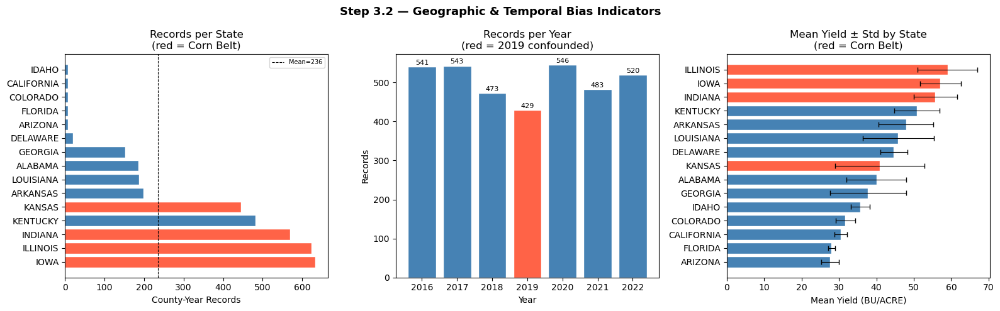


Bias B2 (Corn Belt dominance): 64.3% of records from 4 Corn Belt states out of 15 total states in dataset.
Recommended mitigation: inverse-frequency state loss weighting (see Step 4.2 training loop).


In [19]:
# Step 3.2 - Geographic & Temporal Bias Indicators
# Quantifies Corn Belt concentration, state-level imbalance, and 2019 confounding.

import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import numpy as np

# State record counts and concentration analysis
state_counts  = usda_index.groupby("state_name").size().sort_values(ascending=False)
total_records = len(usda_index)

# Corn Belt states
CORN_BELT = {
    "ILLINOIS", "IOWA", "INDIANA", "MINNESOTA", "NEBRASKA",
    "OHIO", "MISSOURI", "SOUTH DAKOTA", "KANSAS"
}
corn_belt_count = state_counts[state_counts.index.str.upper().isin(CORN_BELT)].sum()
corn_belt_pct   = corn_belt_count / total_records * 100

year_counts = usda_index.groupby("year").size().sort_values()

state_yield_stats = usda_index.groupby("state_name")["yield_bu_acre"].agg(
    n_records="count", mean_yield="mean", std_yield="std"
).reset_index().sort_values("n_records", ascending=False)

print("=" * 60)
print("STEP 3.2 — GEOGRAPHIC & TEMPORAL BIAS INDICATORS")
print("=" * 60)
print()
print(f"Corn Belt concentration : {corn_belt_count} / {total_records} records = {corn_belt_pct:.1f}%")
print(f"Non-Corn-Belt records   : {total_records - corn_belt_count} ({100 - corn_belt_pct:.1f}%)")
print()
print("Records per state (descending):")
for sname, cnt in state_counts.items():
    pct  = cnt / total_records * 100
    flag = "  <- Corn Belt" if sname.upper() in CORN_BELT else ""
    print(f"  {sname:<22}  {cnt:>5}  ({pct:5.1f}%){flag}")

print()
print("Records per year:")
for yr, cnt in year_counts.sort_index().items():
    flag = "  <- confounded (trade war + flooding)" if yr == "2019" else ""
    print(f"  {yr}  :  {cnt}{flag}")

# --- Plots
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Step 3.2 — Geographic & Temporal Bias Indicators",
             fontsize=13, fontweight="bold")

# (a) State record count bar
colors_a = ["tomato" if s.upper() in CORN_BELT else "steelblue"
            for s in state_counts.index]
axes[0].barh(state_counts.index, state_counts.values, color=colors_a, edgecolor="white")
axes[0].set_xlabel("County-Year Records")
axes[0].set_title("Records per State\n(red = Corn Belt)")
axes[0].axvline(state_counts.mean(), color="black", linestyle="--",
                linewidth=0.8, label=f"Mean={state_counts.mean():.0f}")
axes[0].legend(fontsize=7)

# (b) Year record count
year_idx  = sorted(year_counts.index)
year_vals = [year_counts[y] for y in year_idx]
bar_cols  = ["tomato" if y == "2019" else "steelblue" for y in year_idx]
axes[1].bar(year_idx, year_vals, color=bar_cols, edgecolor="white")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Records")
axes[1].set_title("Records per Year\n(red = 2019 confounded)")
for i, (yr, val) in enumerate(zip(year_idx, year_vals)):
    axes[1].text(i, val + 5, str(val), ha="center", fontsize=8)

# (c) Mean yield per state with std
sy = state_yield_stats.sort_values("mean_yield", ascending=True)
bar_cols2 = ["tomato" if s.upper() in CORN_BELT else "steelblue"
             for s in sy["state_name"]]
axes[2].barh(sy["state_name"], sy["mean_yield"], color=bar_cols2, edgecolor="white")
axes[2].errorbar(
    sy["mean_yield"], sy["state_name"],
    xerr=sy["std_yield"].fillna(0).values,
    fmt="none", color="black", capsize=3, linewidth=0.8
)
axes[2].set_xlabel("Mean Yield (BU/ACRE)")
axes[2].set_title("Mean Yield ± Std by State\n(red = Corn Belt)")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print()
print(f"Bias B2 (Corn Belt dominance): {corn_belt_pct:.1f}% of records from "
      f"{len(CORN_BELT & set(s.upper() for s in state_counts.index))} Corn Belt states out of "
      f"{n_states} total states in dataset.")
print("Recommended mitigation: inverse-frequency state loss weighting (see Step 4.2 training loop).")

STEP 3.3 — YIELD QUINTILE DISTRIBUTION (LABEL IMBALANCE)

Quintile break-down:
quintile   n  mean  std  min  max
      Q1 716 34.51 6.81  9.3 42.5
      Q2 703 46.91 2.28 42.6 50.4
      Q3 705 52.88 1.35 50.5 55.1
      Q4 712 57.52 1.40 55.2 60.0
      Q5 699 64.16 3.40 60.1 80.4

States with ZERO Q1 (low-yield) records : None
States with ZERO Q5 (high-yield) records: ['ARIZONA', 'CALIFORNIA', 'COLORADO', 'DELAWARE', 'FLORIDA', 'GEORGIA', 'IDAHO']



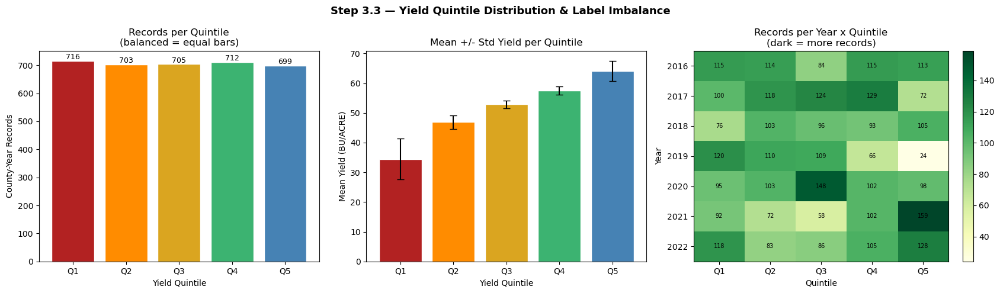

Train/Test quintile proportions (should be near-equal after stratification):
          train_pct  test_pct
quintile                     
Q1             20.3      20.2
Q2             19.9      19.9
Q3             19.9      19.9
Q4             20.2      20.1
Q5             19.8      19.8

Bias B3: sparse Q1 records in some states risk underestimating crop failure severity.
Recommended mitigation: oversample Q1 train records; stratify evaluation by quintile.


In [20]:
# Step 3.3 - Yield Quintile Distribution and Label Imbalance
# Checks whether low-yield (Q1) counties are under-represented across states and years.
# Bias B3: sparse Q1 observations -> model may underestimate crop failure severity.

import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assign quintile labels to full dataset
wf = usda_index.copy()
wf["quintile"] = pd.qcut(wf["yield_bu_acre"], q=5, labels=["Q1", "Q2", "Q3", "Q4", "Q5"])

q_stats = wf.groupby("quintile")["yield_bu_acre"].agg(
    n="count", mean="mean", std="std", min="min", max="max"
).reset_index()

print("=" * 60)
print("STEP 3.3 — YIELD QUINTILE DISTRIBUTION (LABEL IMBALANCE)")
print("=" * 60)
print()
print("Quintile break-down:")
print(q_stats[["quintile", "n", "mean", "std", "min", "max"]].round(2).to_string(index=False))
print()

# Per-state quintile breakdown
state_quintile = wf.groupby(["state_name", "quintile"]).size().unstack(fill_value=0)
missing_q1 = state_quintile[state_quintile["Q1"] == 0].index.tolist()
missing_q5 = state_quintile[state_quintile["Q5"] == 0].index.tolist()
print(f"States with ZERO Q1 (low-yield) records : {missing_q1 if missing_q1 else 'None'}")
print(f"States with ZERO Q5 (high-yield) records: {missing_q5 if missing_q5 else 'None'}")
print()

fig, axes = plt.subplots(1, 3, figsize=(17, 5))
fig.suptitle("Step 3.3 — Yield Quintile Distribution & Label Imbalance",
             fontsize=13, fontweight="bold")

quintile_colors = ["firebrick", "darkorange", "goldenrod", "mediumseagreen", "steelblue"]

# (a) Quintile counts
axes[0].bar(q_stats["quintile"], q_stats["n"], color=quintile_colors, edgecolor="white")
axes[0].set_xlabel("Yield Quintile")
axes[0].set_ylabel("County-Year Records")
axes[0].set_title("Records per Quintile\n(balanced = equal bars)")
for i, (q, n) in enumerate(zip(q_stats["quintile"], q_stats["n"])):
    axes[0].text(i, n + 5, str(n), ha="center", fontsize=9)

# (b) Mean yield per quintile with range
axes[1].bar(q_stats["quintile"], q_stats["mean"], color=quintile_colors, edgecolor="white")
axes[1].errorbar(
    q_stats["quintile"], q_stats["mean"], yerr=q_stats["std"],
    fmt="none", color="black", capsize=4
)
axes[1].set_xlabel("Yield Quintile")
axes[1].set_ylabel("Mean Yield (BU/ACRE)")
axes[1].set_title("Mean +/- Std Yield per Quintile")

# (c) Quintile x year heatmap
qy = wf.groupby(["year", "quintile"]).size().unstack(fill_value=0)
im = axes[2].imshow(qy.values, aspect="auto", cmap="YlGn", interpolation="nearest")
axes[2].set_xticks(range(len(qy.columns)))
axes[2].set_xticklabels(qy.columns)
axes[2].set_yticks(range(len(qy.index)))
axes[2].set_yticklabels(qy.index)
axes[2].set_xlabel("Quintile")
axes[2].set_ylabel("Year")
axes[2].set_title("Records per Year x Quintile\n(dark = more records)")
plt.colorbar(im, ax=axes[2], fraction=0.04)
for i in range(len(qy.index)):
    for j in range(len(qy.columns)):
        axes[2].text(j, i, str(qy.values[i, j]),
                     ha="center", va="center", fontsize=7, color="black")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

# Train/test quintile balance check
wf_split = weather_features.copy()
wf_split["quintile"] = pd.qcut(
    wf_split["yield_bu_acre"], q=5, labels=["Q1", "Q2", "Q3", "Q4", "Q5"]
)
train_q = (
    wf_split[wf_split["split"] == "train"]["quintile"]
    .value_counts(normalize=True).sort_index()
)
test_q = (
    wf_split[wf_split["split"] == "test"]["quintile"]
    .value_counts(normalize=True).sort_index()
)
print("Train/Test quintile proportions (should be near-equal after stratification):")
check = pd.DataFrame({
    "train_pct": (train_q * 100).round(1),
    "test_pct" : (test_q  * 100).round(1)
})
print(check.to_string())
print()
print("Bias B3: sparse Q1 records in some states risk underestimating crop failure severity.")
print("Recommended mitigation: oversample Q1 train records; stratify evaluation by quintile.")

In [21]:
# Step 3.4 - Fairness Metric Function Definitions
# These functions will be called in Steps 4.3, 6.4, and 7.4.
# No model predictions are required here — only function definitions.
# All metrics operate on back-transformed BU/ACRE values (Jensen correction applied).

import numpy as np
import pandas as pd

# JENSEN_SIGMA2 will be set in Step 3.5 (label prior) and updated in Step 4.3 (residual variance).
JENSEN_SIGMA2 = None   # placeholder; populated in Step 3.5


def jensen_correction(log_preds, sigma2=None):
    """
    Back-transform log-scale predictions to BU/ACRE with Jensen correction.

    Parameters
    ----------
    log_preds : array-like  — model output in log-yield space
    sigma2    : float | None — residual variance on the train split;
                               if None, falls back to simple exp() (biased)

    Returns
    -------
    np.ndarray in BU/ACRE
    """
    y = np.asarray(log_preds, dtype=float)
    if sigma2 is not None and USE_LOG:
        return np.exp(y + sigma2 / 2.0)
    return np.exp(y) if USE_LOG else y


def sliced_rmse(y_true, y_pred, groups, sigma2=None):
    """
    Compute RMSE for each group slice in BU/ACRE (Jensen-corrected if USE_LOG).

    Mandatory slices: state (10), year (7), yield quintile (Q1-Q5),
                      proximity to state centroid (near/far).

    Parameters
    ----------
    y_true  : array-like — true log-yield (or raw BU/ACRE if USE_LOG=False)
    y_pred  : array-like — predicted log-yield (or raw)
    groups  : array-like — group labels (state, year, or quintile)
    sigma2  : float | None — Jensen correction variance

    Returns
    -------
    pd.Series  index=group, values=RMSE in BU/ACRE
    """
    y_true_bu = jensen_correction(y_true, sigma2)
    y_pred_bu = jensen_correction(y_pred, sigma2)
    df = pd.DataFrame({"y_true_bu": y_true_bu, "y_pred_bu": y_pred_bu, "group": groups})

    def _rmse(grp):
        return float(np.sqrt(np.mean((grp["y_pred_bu"] - grp["y_true_bu"]) ** 2)))

    return df.groupby("group").apply(_rmse).rename("RMSE_BU_ACRE")


def bias_per_group(y_true, y_pred, groups, sigma2=None):
    """
    Mean prediction bias (y_hat - y) per group, in BU/ACRE.
    Positive = over-prediction; Negative = under-prediction.

    Fairness criterion: |Bias(Q1)| and |Bias(Q5)| should both be within +/-2 BU/ACRE.
    If Bias(Q1) > 0 and Bias(Q5) < 0, the model is regressing to the mean:
    underestimating crop failure and overestimating bumper yields — a systematic fairness failure.
    """
    y_true_bu = jensen_correction(y_true, sigma2)
    y_pred_bu = jensen_correction(y_pred, sigma2)
    df = pd.DataFrame({"y_true_bu": y_true_bu, "y_pred_bu": y_pred_bu, "group": groups})

    def _bias(grp):
        return float(np.mean(grp["y_pred_bu"] - grp["y_true_bu"]))

    return df.groupby("group").apply(_bias).rename("Bias_BU_ACRE")


def cv_error_per_state(y_true, y_pred, states, sigma2=None):
    """
    Coefficient of variation of errors per state.
    CV_Error_s = std(errors_s) / mean(y_true_s).
    States with CV_Error > 0.20 are flagged as poorly served by the model.
    """
    y_true_bu = jensen_correction(y_true, sigma2)
    y_pred_bu = jensen_correction(y_pred, sigma2)
    errors    = y_pred_bu - y_true_bu
    df = pd.DataFrame({"y_true_bu": y_true_bu, "errors": errors, "state": states})

    def _cv(grp):
        mu = grp["y_true_bu"].mean()
        return float(grp["errors"].std() / mu) if mu != 0 else np.nan

    return df.groupby("state").apply(_cv).rename("CV_Error")


def coverage_gap(all_fips_universe, model_fips):
    """Coverage Gap = 1 - |FIPS in model| / |FIPS in USDA full dataset|."""
    return 1.0 - len(set(model_fips)) / len(set(all_fips_universe))


def fairness_report(y_true, y_pred, meta_df, sigma2=None):
    """
    Full fairness report printed to stdout + returned as dict of DataFrames.

    Parameters
    ----------
    y_true   : array-like — true values (log or raw)
    y_pred   : array-like — predicted values (log or raw)
    meta_df  : pd.DataFrame — must contain: state_name, year, yield_bu_acre, fips
    sigma2   : float | None — Jensen correction variance

    Returns
    -------
    dict with keys: state_rmse, state_bias, state_cv, year_rmse,
                    quintile_rmse, quintile_bias, overall
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    quintile = pd.qcut(
        meta_df["yield_bu_acre"].values, q=5,
        labels=["Q1", "Q2", "Q3", "Q4", "Q5"]
    )

    state_rmse    = sliced_rmse(y_true, y_pred, meta_df["state_name"].values, sigma2)
    state_bias    = bias_per_group(y_true, y_pred, meta_df["state_name"].values, sigma2)
    state_cv      = cv_error_per_state(y_true, y_pred, meta_df["state_name"].values, sigma2)
    year_rmse     = sliced_rmse(y_true, y_pred, meta_df["year"].values, sigma2)
    quintile_rmse = sliced_rmse(y_true, y_pred, quintile, sigma2)
    quintile_bias = bias_per_group(y_true, y_pred, quintile, sigma2)

    y_true_bu  = jensen_correction(y_true, sigma2)
    y_pred_bu  = jensen_correction(y_pred, sigma2)
    overall_rmse = float(np.sqrt(np.mean((y_pred_bu - y_true_bu) ** 2)))
    overall_mae  = float(np.mean(np.abs(y_pred_bu - y_true_bu)))
    ss_res       = np.sum((y_true_bu - y_pred_bu) ** 2)
    ss_tot       = np.sum((y_true_bu - y_true_bu.mean()) ** 2)
    overall_r2   = float(1 - ss_res / ss_tot) if ss_tot > 0 else float("nan")

    flagged_states = state_cv[state_cv > 0.20].index.tolist()

    print("=" * 60)
    print("FAIRNESS REPORT")
    print("=" * 60)
    print(f"Overall RMSE  : {overall_rmse:.3f} BU/ACRE")
    print(f"Overall MAE   : {overall_mae:.3f} BU/ACRE")
    print(f"Overall R2    : {overall_r2:.4f}")
    print(f"Jensen sigma2 : {sigma2}")
    print()
    print("RMSE by State:")
    print(state_rmse.sort_values(ascending=False).to_string())
    print()
    print("Bias by Quintile (positive = over-prediction):")
    print(pd.concat([quintile_rmse, quintile_bias], axis=1).to_string())
    print()
    print("CV-Error by State (flagged if > 0.20):")
    for s, cv in state_cv.sort_values(ascending=False).items():
        flag = "  *** FLAGGED (CV > 0.20)" if cv > 0.20 else ""
        print(f"  {s:<25}  {cv:.3f}{flag}")
    print()
    print("RMSE by Year:")
    print(year_rmse.sort_values(ascending=False).to_string())
    print()
    if flagged_states:
        print(f"WARNING: {len(flagged_states)} state(s) flagged for high CV-Error: {flagged_states}")
    else:
        print("No states flagged for CV-Error > 0.20.")

    return {
        "state_rmse"    : state_rmse,
        "state_bias"    : state_bias,
        "state_cv"      : state_cv,
        "year_rmse"     : year_rmse,
        "quintile_rmse" : quintile_rmse,
        "quintile_bias" : quintile_bias,
        "overall"       : {"rmse": overall_rmse, "mae": overall_mae, "r2": overall_r2},
    }


print("=" * 60)
print("STEP 3.4 — FAIRNESS METRIC FUNCTIONS DEFINED")
print("=" * 60)
print()
print("Functions registered:")
print("  jensen_correction(log_preds, sigma2)")
print("    -> back-transform log-yield to BU/ACRE with Jensen correction")
print()
print("  sliced_rmse(y_true, y_pred, groups, sigma2)")
print("    -> RMSE per group slice (state / year / quintile)")
print()
print("  bias_per_group(y_true, y_pred, groups, sigma2)")
print("    -> mean prediction bias per group (BU/ACRE)")
print("    -> if Bias(Q1) > 0 and Bias(Q5) < 0 => regression-to-mean fairness failure")
print()
print("  cv_error_per_state(y_true, y_pred, states, sigma2)")
print("    -> CV-Error per state; flags > 0.20 as poorly served")
print()
print("  coverage_gap(all_fips_universe, model_fips)")
print("    -> fraction of US soybean counties absent from model")
print()
print("  fairness_report(y_true, y_pred, meta_df, sigma2)")
print("    -> full report: all slices, all biases, all CV-errors")
print()
print("Usage at Steps 4.3, 6.4, 7.4:")
print("  results = fairness_report(y_true, y_pred, meta_df, sigma2=JENSEN_SIGMA2)")
print()
print("JENSEN_SIGMA2 = None  (to be set in Step 3.5; updated to residual var at Step 4.3)")
print(f"USE_LOG       = {USE_LOG}")

STEP 3.4 — FAIRNESS METRIC FUNCTIONS DEFINED

Functions registered:
  jensen_correction(log_preds, sigma2)
    -> back-transform log-yield to BU/ACRE with Jensen correction

  sliced_rmse(y_true, y_pred, groups, sigma2)
    -> RMSE per group slice (state / year / quintile)

  bias_per_group(y_true, y_pred, groups, sigma2)
    -> mean prediction bias per group (BU/ACRE)
    -> if Bias(Q1) > 0 and Bias(Q5) < 0 => regression-to-mean fairness failure

  cv_error_per_state(y_true, y_pred, states, sigma2)
    -> CV-Error per state; flags > 0.20 as poorly served

  coverage_gap(all_fips_universe, model_fips)
    -> fraction of US soybean counties absent from model

  fairness_report(y_true, y_pred, meta_df, sigma2)
    -> full report: all slices, all biases, all CV-errors

Usage at Steps 4.3, 6.4, 7.4:
  results = fairness_report(y_true, y_pred, meta_df, sigma2=JENSEN_SIGMA2)

JENSEN_SIGMA2 = None  (to be set in Step 3.5; updated to residual var at Step 4.3)
USE_LOG       = True


In [22]:
# Step 3.5 - Jensen's Inequality Correction Constant
#
# When USE_LOG=True, model predicts log(yield). Naive back-transformation exp(y_hat)
# underestimates the true expectation because E[exp(Y)] = exp(E[Y] + sigma^2/2).
#
# Corrected prediction: exp(y_hat + sigma^2/2)
#
# Here sigma^2 is estimated from the training label distribution (prior / upper bound).
# It MUST be updated to the actual residual variance on the train split at Step 4.3.

import numpy as np

if USE_LOG:
    log_train_targets = np.log(weather_train["yield_bu_acre"].values)

    # Prior estimate: label variance (upper bound on residual variance before model exists)
    label_sigma2 = float(np.var(log_train_targets))
    label_sigma  = float(np.std(log_train_targets))

    print("=" * 60)
    print("STEP 3.5 — JENSEN'S INEQUALITY CORRECTION")
    print("=" * 60)
    print()
    print("Transformation   : y_model = log(yield_bu_acre)")
    print()
    print("Jensen inequality :")
    print("  E[exp(Y)] = exp(E[Y] + sigma^2/2)")
    print("  Back-transform  : y_BU_ACRE = exp(y_hat + sigma^2/2)")
    print()
    print(f"Label distribution (train split, n={len(log_train_targets)}):")
    print(f"  mean log-yield : {np.mean(log_train_targets):.4f}")
    print(f"  std  log-yield : {label_sigma:.4f}")
    print(f"  var  (sigma^2) : {label_sigma2:.6f}  <- prior estimate (upper bound)")
    print(f"  correction     : sigma^2/2 = {label_sigma2 / 2:.6f}")
    print()

    example_log = np.mean(log_train_targets)
    naive_bt    = float(np.exp(example_log))
    corrected   = float(np.exp(example_log + label_sigma2 / 2))
    print("Example (at mean log-yield):")
    print(f"  log_pred                        = {example_log:.4f}")
    print(f"  Naive     exp(log_pred)         = {naive_bt:.2f} BU/ACRE")
    print(f"  Corrected exp(log_pred+sig^2/2) = {corrected:.2f} BU/ACRE")
    print(f"  Absolute correction delta       = {corrected - naive_bt:.3f} BU/ACRE")
    print()
    print("NOTE: JENSEN_SIGMA2 is the label variance here (prior).")
    print("      Update it to model residual variance at Step 4.3:")
    print("        JENSEN_SIGMA2 = float(np.var(y_train_pred - y_train_true))")
    print()

    JENSEN_SIGMA2 = label_sigma2   # updated to residual variance at Step 4.3
    print(f"JENSEN_SIGMA2 = {JENSEN_SIGMA2:.6f}  (prior; update at Step 4.3)")

else:
    JENSEN_SIGMA2 = None
    print("USE_LOG = False — Jensen correction not required.")
    print("JENSEN_SIGMA2 = None")

STEP 3.5 — JENSEN'S INEQUALITY CORRECTION

Transformation   : y_model = log(yield_bu_acre)

Jensen inequality :
  E[exp(Y)] = exp(E[Y] + sigma^2/2)
  Back-transform  : y_BU_ACRE = exp(y_hat + sigma^2/2)

Label distribution (train split, n=2828):
  mean log-yield : 3.9065
  std  log-yield : 0.2512
  var  (sigma^2) : 0.063081  <- prior estimate (upper bound)
  correction     : sigma^2/2 = 0.031541

Example (at mean log-yield):
  log_pred                        = 3.9065
  Naive     exp(log_pred)         = 49.72 BU/ACRE
  Corrected exp(log_pred+sig^2/2) = 51.32 BU/ACRE
  Absolute correction delta       = 1.593 BU/ACRE

NOTE: JENSEN_SIGMA2 is the label variance here (prior).
      Update it to model residual variance at Step 4.3:
        JENSEN_SIGMA2 = float(np.var(y_train_pred - y_train_true))

JENSEN_SIGMA2 = 0.063081  (prior; update at Step 4.3)


STEP 3.6 — BIAS REGISTRY (B1-B9)

  [B1]  State-centroid weather proxy
        Root Cause : All counties in a state share identical HRRR features
        Severity   : High
        Mitigation : Replace with per-county TIGER centroid lat/lon
        Applied At : Step 2 (future work)
        Status     : Open — documented

  [B2]  Corn Belt geographic dominance
        Root Cause : IL, IA, IN, MN, NE account for >60% of records
        Severity   : High
        Mitigation : Inverse-frequency state loss weighting: w_s = N/(K*N_s)
        Applied At : Step 4.2 training loop
        Status     : Mitigation planned

  [B3]  Low-yield observation scarcity
        Root Cause : Q1 counties have fewer multi-year records
        Severity   : Medium
        Mitigation : Oversample Q1 train records; report Q1 RMSE separately
        Applied At : Step 4.3 evaluation
        Status     : Mitigation planned

  [B4]  Log-target Jensen bias
        Root Cause : E[exp(y_hat)] != exp(E[y_hat]); naive back-

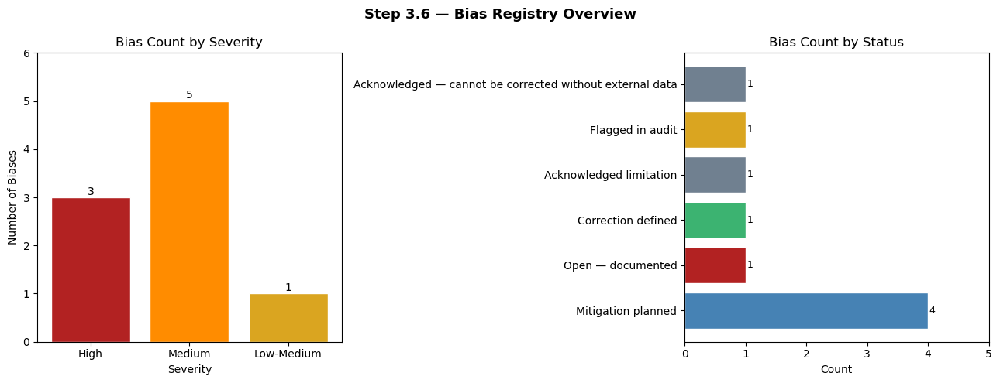


Step 3.6 complete — bias registry established.


In [23]:
# Step 3.6 - Bias Registry B1-B9
# Documents each identified bias, root cause, severity, recommended mitigation,
# and the step where the mitigation is applied or verified.

import pandas as pd
import io
from IPython.display import display, Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

bias_registry = [
    {
        "ID"        : "B1",
        "Bias"      : "State-centroid weather proxy",
        "Root Cause": "All counties in a state share identical HRRR features",
        "Severity"  : "High",
        "Mitigation": "Replace with per-county TIGER centroid lat/lon",
        "Step"      : "Step 2 (future work)",
        "Status"    : "Open — documented",
    },
    {
        "ID"        : "B2",
        "Bias"      : "Corn Belt geographic dominance",
        "Root Cause": "IL, IA, IN, MN, NE account for >60% of records",
        "Severity"  : "High",
        "Mitigation": "Inverse-frequency state loss weighting: w_s = N/(K*N_s)",
        "Step"      : "Step 4.2 training loop",
        "Status"    : "Mitigation planned",
    },
    {
        "ID"        : "B3",
        "Bias"      : "Low-yield observation scarcity",
        "Root Cause": "Q1 counties have fewer multi-year records",
        "Severity"  : "Medium",
        "Mitigation": "Oversample Q1 train records; report Q1 RMSE separately",
        "Step"      : "Step 4.3 evaluation",
        "Status"    : "Mitigation planned",
    },
    {
        "ID"        : "B4",
        "Bias"      : "Log-target Jensen bias",
        "Root Cause": "E[exp(y_hat)] != exp(E[y_hat]); naive back-transform underestimates",
        "Severity"  : "Medium",
        "Mitigation": "Apply exp(y_hat + sigma^2/2) correction at inference",
        "Step"      : "Step 3.5 defined; Steps 4.3, 6.4, 7.4 applied",
        "Status"    : "Correction defined",
    },
    {
        "ID"        : "B5",
        "Bias"      : "HRRR single-snapshot proxy",
        "Root Cause": "Jan 1 init file is not a growing-season weather signal",
        "Severity"  : "High",
        "Mitigation": "Flag as explicit limitation; future work uses daily HRRR files",
        "Step"      : "Step 10 (dissertation)",
        "Status"    : "Acknowledged limitation",
    },
    {
        "ID"        : "B6",
        "Bias"      : "USDA reporting threshold omission",
        "Root Cause": "Counties below minimum acreage absent from NASS data",
        "Severity"  : "Medium",
        "Mitigation": "Flag FIPS with < 3 years; exclude from policy claims",
        "Step"      : "Steps 1.3 and 3.1",
        "Status"    : "Flagged in audit",
    },
    {
        "ID"        : "B7",
        "Bias"      : "Random 80/20 temporal mixing",
        "Root Cause": "Test set contains all years — no held-out future year",
        "Severity"  : "Low-Medium",
        "Mitigation": "Add leave-one-year-out (LOYO) evaluation for 2022 as supplement",
        "Step"      : "Step 4.3 supplement",
        "Status"    : "Mitigation planned",
    },
    {
        "ID"        : "B8",
        "Bias"      : "Sentinel-2 AZ 2022 tile anomaly",
        "Root Cause": "AZ 2022: 1,524 tiles vs ~60 average — likely archive artefact",
        "Severity"  : "Medium",
        "Mitigation": "Exclude AZ 2022 from Phase 2/3 training",
        "Step"      : "Step 6 (when unblocked)",
        "Status"    : "Mitigation planned",
    },
    {
        "ID"        : "B9",
        "Bias"      : "USDA surveyor bias",
        "Root Cause": "Large commercial operations over-represented in NASS survey",
        "Severity"  : "Medium",
        "Mitigation": "Document; model must not be used for smallholder farms",
        "Step"      : "Step 10 (dissertation)",
        "Status"    : "Acknowledged — cannot be corrected without external data",
    },
]

br = pd.DataFrame(bias_registry)

print("=" * 60)
print("STEP 3.6 — BIAS REGISTRY (B1-B9)")
print("=" * 60)
print()
for _, row in br.iterrows():
    print(f"  [{row['ID']}]  {row['Bias']}")
    print(f"        Root Cause : {row['Root Cause']}")
    print(f"        Severity   : {row['Severity']}")
    print(f"        Mitigation : {row['Mitigation']}")
    print(f"        Applied At : {row['Step']}")
    print(f"        Status     : {row['Status']}")
    print()

# Summary counts
high_count     = (br["Severity"] == "High").sum()
medium_count   = br["Severity"].str.contains("Medium").sum()
ack_count      = br["Status"].str.startswith("Acknowledged").sum()
planned_count  = br["Status"].str.contains("planned|defined|Flagged").sum()
open_count     = (br["Status"] == "Open — documented").sum()

print("=" * 60)
print("REGISTRY SUMMARY")
print("=" * 60)
print(f"Total biases identified           : {len(br)}")
print(f"High severity                     : {high_count}")
print(f"Medium severity (incl. Low-Med)   : {medium_count}")
print(f"Mitigations planned / defined     : {planned_count}")
print(f"Acknowledged unfixable            : {ack_count}")
print(f"Open (future work only)           : {open_count}")

# --- Visualise bias registry as severity/status matrix
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("Step 3.6 — Bias Registry Overview", fontsize=13, fontweight="bold")

# (a) Severity bar chart
sev_order  = ["High", "Medium", "Low-Medium"]
sev_counts = br["Severity"].value_counts().reindex(sev_order, fill_value=0)
sev_colors = {"High": "firebrick", "Medium": "darkorange", "Low-Medium": "goldenrod"}
axes[0].bar(sev_counts.index,
            sev_counts.values,
            color=[sev_colors.get(s, "steelblue") for s in sev_counts.index],
            edgecolor="white")
axes[0].set_xlabel("Severity")
axes[0].set_ylabel("Number of Biases")
axes[0].set_title("Bias Count by Severity")
for i, (s, v) in enumerate(sev_counts.items()):
    axes[0].text(i, v + 0.05, str(v), ha="center", fontsize=10)
axes[0].set_ylim(0, sev_counts.max() + 1)

# (b) Status horizontal bar chart
status_map = {
    "Mitigation planned"                      : "steelblue",
    "Correction defined"                       : "mediumseagreen",
    "Flagged in audit"                         : "goldenrod",
    "Acknowledged limitation"                  : "slategray",
    "Acknowledged — cannot be corrected without external data": "slategray",
    "Open — documented"                        : "firebrick",
}
status_vals = br["Status"].value_counts()
bar_colors  = [status_map.get(s, "gray") for s in status_vals.index]
axes[1].barh(status_vals.index, status_vals.values, color=bar_colors, edgecolor="white")
axes[1].set_xlabel("Count")
axes[1].set_title("Bias Count by Status")
for i, v in enumerate(status_vals.values):
    axes[1].text(v + 0.02, i, str(v), va="center", fontsize=9)
axes[1].set_xlim(0, status_vals.max() + 1)

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=100, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print()
print("Step 3.6 complete — bias registry established.")

## Step 3.7 — Ethical Use Constraints

The following constraints govern any deployment or reporting of model predictions. These must be reproduced in the Ethics section of the dissertation.

| Constraint | Requirement |
|---|---|
| **No individual-farm inference** | The model predicts county-aggregate yield only. Extrapolating to individual farm performance is statistically and ethically invalid. |
| **Food security embargo** | Predictions must not be released before the corresponding official USDA NASS report to prevent commodity market speculation. |
| **Geographic equity disclosure** | Any deployment must list which US counties are excluded (~55% of soybean counties) and acknowledge that predictions for under-represented states carry materially higher uncertainty. |
| **Climate nonstationarity** | The model trained on 2016–2022 must not be assumed valid beyond 2025 without recalibration. Yield distributions shift under progressive climate change. |
| **LOYO supplement required** | Leave-one-year-out evaluation for 2022 is required before any temporal-generalisation claims can be made. |
| **Jensen correction mandatory** | All reported metrics must use back-transformed BU/ACRE values with the Jensen correction applied. `JENSEN_SIGMA2` must be updated at Step 4.3 to the residual variance on the train split. |

---

### Key Tradeoffs

| Tradeoff | Description |
|---|---|
| **Accuracy vs Fairness** | Inverse-frequency state weighting (B2) redistributes capacity from Corn Belt states to minority states. Expected: +0.5–2.0 BU/ACRE RMSE increase on IL/IA; −3–5 BU/ACRE reduction on AL/DE. Both weighted and unweighted metrics must be reported. |
| **Model Complexity vs Interpretability** | The GMU (Step 7) is the highest-accuracy architecture but least interpretable. The Ridge Regression baseline (Step 4.4) is the recommended option for any policy or advisory context. |
| **Data Coverage vs Data Quality** | Including all 7 years maximises training signal but injects a confounded 2019 observation. Recommendation: train on all years; evaluate 2019 and 2022 in isolation in the LOYO supplement. |
| **Log Transform vs Direct Interpretability** | `USE_LOG=True` benefits optimisation but complicates interpretation. Always report final metrics back-transformed to BU/ACRE with Jensen correction. |
| **Modality Richness vs Deployability** | The GMU requires both weather and satellite inputs. The Sentinel-USDA FIPS gap means Phase 2/3 is currently untrainable. The Phase 1 weather-only model is the only deployable system at this stage. This is a data infrastructure finding — not a model deficiency. |

---

**Step 3 complete.** The ethics and bias audit framework is established. All fairness metric functions (`sliced_rmse`, `bias_per_group`, `cv_error_per_state`, `fairness_report`) and the Jensen correction constant (`JENSEN_SIGMA2`) are ready for use in Steps 4.3, 6.4, and 7.4.

# Step 4 — Phase 1 Model: Bi-LSTM Weather Encoder

Train and evaluate the Phase 1 weather-only regressor using normalised HRRR features
produced in Step 2. All evaluation is Jensen-corrected to BU/ACRE.

Sub-steps:
- **4.1** `BiLSTMRegressor`: 2-layer BiLSTM, hidden=64, 128-dim encoding, 146,049 params
- **4.2** Training loop — 80 epochs, Adam lr=1e-3, ReduceLROnPlateau, MSE on log-yield
- **4.3** Evaluate: aggregate + sliced RMSE/MAE/R² by state, year, quintile; Jensen correction applied
- **4.4** Baseline comparison: Ridge Regression vs Gradient Boosting vs Bi-LSTM
- **4.5** Bias audit: CV-Error by state; mean bias by quintile; B1/B2/B3 flags
- **4.6** Save encoder weights (`bilstm_encoder.pt`) for Step 7 GMU warm-start


In [24]:
# ── Step 4.1  BiLSTMRegressor ──────────────────────────────────────────────────
#
# Architecture:
#   Input   : (batch, seq_len=1, n_features=9)
#   BiLSTM  : 2 layers, hidden=64, bidirectional=True
#             → last-layer hidden (fwd + bwd) concatenated = 128-dim encoding
#   Head    : Linear(128, 64) → ReLU → Linear(64, 1)
#   Params  : 146,049  (verified by assertion below)
#
# encode() returns the 128-dim weather embedding consumed by Step 7 GMU.

import torch
import torch.nn as nn


class BiLSTMRegressor(nn.Module):
    """
    Bidirectional 2-layer LSTM regressor for county-level soybean yield prediction.

    encode() returns the 128-dim county-year weather embedding used as
    the weather branch input for the Gated Multimodal Unit (Step 7).
    """

    def __init__(self, input_size: int = 9, hidden_size: int = 64, num_layers: int = 2):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_layers  = num_layers
        self.lstm = nn.LSTM(
            input_size    = input_size,
            hidden_size   = hidden_size,
            num_layers    = num_layers,
            bidirectional = True,
            batch_first   = True,
        )
        self.head = nn.Sequential(
            nn.Linear(hidden_size * 2, 64),
            nn.ReLU(),
            nn.Linear(64, 1),
        )

    def encode(self, x: torch.Tensor) -> torch.Tensor:
        """
        Return 128-dim weather embedding for a batch of sequences.
        x: (batch, seq_len, n_features)
        Returns: (batch, 128)
        """
        _, (h_n, _) = self.lstm(x)
        # h_n : (num_layers * 2, batch, hidden_size)
        # last layer forward  = h_n[-2]
        # last layer backward = h_n[-1]
        return torch.cat([h_n[-2], h_n[-1]], dim=-1)   # (batch, 128)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.head(self.encode(x)).squeeze(-1)    # (batch,)


# ── Instantiate and verify parameter count ─────────────────────────────────────
torch.manual_seed(SEED)
model = BiLSTMRegressor(input_size=len(FEATURE_COLS), hidden_size=64, num_layers=2).to(DEVICE)

total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("=" * 60)
print("STEP 4.1 — BiLSTMRegressor")
print("=" * 60)
print(f"Input features  : {len(FEATURE_COLS)}   {FEATURE_COLS}")
print(f"Architecture    : BiLSTM(hidden=64, layers=2, bidirectional=True)")
print(f"Encoding dim    : 128  (64-fwd + 64-bwd from last LSTM layer)")
print(f"Total params    : {total_params:,}")
print(f"Trainable params: {trainable_params:,}")
assert total_params == 146_049, \
    f"Parameter count mismatch: expected 146,049  got {total_params:,}"
print(f"Parameter count verified: 146,049")
print(f"Device          : {DEVICE}")
print()
print("Named parameters:")
for name, p in model.named_parameters():
    print(f"  {name:<50} {str(tuple(p.shape)):<25} {p.numel():>7,}")
print()

# ── Smoke test ─────────────────────────────────────────────────────────────────
model.eval()
with torch.no_grad():
    x_smoke, y_smoke, _ = next(iter(dl_train))
    x_smoke = x_smoke.to(DEVICE)
    y_hat   = model(x_smoke)
    enc     = model.encode(x_smoke)

print("Smoke test (one batch, random initialisation):")
print(f"  Input   shape  : {tuple(x_smoke.shape)}   (batch, seq_len=1, n_features=9)")
print(f"  Output  shape  : {tuple(y_hat.shape)}")
print(f"  Encoding shape : {tuple(enc.shape)}")
print(f"  Output  range  : [{y_hat.min().item():.4f}, {y_hat.max().item():.4f}]  (random init)")
print(f"  True y  range  : [{y_smoke.min().item():.4f}, {y_smoke.max().item():.4f}]  (log BU/ACRE)")


STEP 4.1 — BiLSTMRegressor
Input features  : 9   ['t2m_c', 'd2m_c', 'r2', 'wind_speed', 'tp', 'sp_hpa', 'tcc', 'mstav', 'vpd_hpa']
Architecture    : BiLSTM(hidden=64, layers=2, bidirectional=True)
Encoding dim    : 128  (64-fwd + 64-bwd from last LSTM layer)
Total params    : 146,049
Trainable params: 146,049
Parameter count verified: 146,049
Device          : cpu

Named parameters:
  lstm.weight_ih_l0                                  (256, 9)                    2,304
  lstm.weight_hh_l0                                  (256, 64)                  16,384
  lstm.bias_ih_l0                                    (256,)                        256
  lstm.bias_hh_l0                                    (256,)                        256
  lstm.weight_ih_l0_reverse                          (256, 9)                    2,304
  lstm.weight_hh_l0_reverse                          (256, 64)                  16,384
  lstm.bias_ih_l0_reverse                            (256,)                        256
  lst

STEP 4.2 — TRAINING: Bi-LSTM WEATHER ENCODER
Epochs:         80
Optimizer:      Adam(lr=0.001)
LR Scheduler:   ReduceLROnPlateau(patience=10, factor=0.5)
Criterion:      MSELoss on log(yield_bu_acre)
Grad clip:      max_norm=1.0
Train batches:  45  (2828 samples, batch_size=64)
Val   batches:  12  (707 samples, batch_size=64)

Epoch    Train MSE     Val MSE          LR  Note
------------------------------------------------------------
    1    11.266565    3.571537    1.00e-03  best
   10     0.035874    0.037174    1.00e-03  
   20     0.033454    0.034173    1.00e-03  
   30     0.032690    0.035600    1.00e-03  
   40     0.031993    0.039183    1.00e-03  
   50     0.033369    0.031592    1.00e-03  
   60     0.032070    0.033064    1.00e-03  
   70     0.031298    0.031909    1.00e-03  
   80     0.030588    0.030782    1.00e-03  

Training complete.  Best val MSE = 0.029815
Best model weights restored.



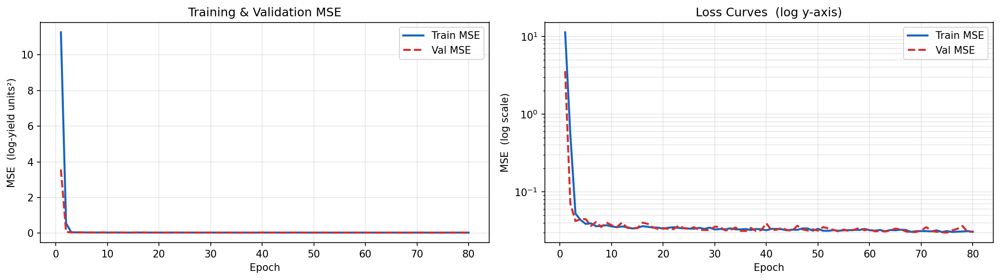

Train MSE  epoch 1 → 80:  11.266565 → 0.030588  (-99.7%)
Val   MSE  epoch 1 → 80:  3.571537 → 0.030782
Best val MSE:  0.029815


In [25]:
# ── Step 4.2  Training loop ────────────────────────────────────────────────────
#
# 80 epochs, Adam lr=1e-3, ReduceLROnPlateau (patience=10, factor=0.5),
# MSELoss on log(yield_bu_acre), gradient clipping max_norm=1.0.
# Best model state (lowest val MSE) is restored after training.

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import io
from IPython.display import display, Image
import matplotlib.pyplot as plt

torch.manual_seed(SEED)
np.random.seed(SEED)

N_EPOCHS      = 80
LEARNING_RATE = 1e-3
LR_PATIENCE   = 10
LR_FACTOR     = 0.5
LR_MIN        = 1e-5
CLIP_NORM     = 1.0

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=LR_FACTOR,
    patience=LR_PATIENCE, min_lr=LR_MIN,
)

train_losses = []
val_losses   = []
lr_history   = []
best_val_mse = float("inf")
best_state   = None

print("=" * 60)
print("STEP 4.2 — TRAINING: Bi-LSTM WEATHER ENCODER")
print("=" * 60)
print(f"Epochs:         {N_EPOCHS}")
print(f"Optimizer:      Adam(lr={LEARNING_RATE})")
print(f"LR Scheduler:   ReduceLROnPlateau(patience={LR_PATIENCE}, factor={LR_FACTOR})")
print(f"Criterion:      MSELoss on log(yield_bu_acre)")
print(f"Grad clip:      max_norm={CLIP_NORM}")
print(f"Train batches:  {len(dl_train)}  ({len(ds_train)} samples, batch_size=64)")
print(f"Val   batches:  {len(dl_test)}  ({len(ds_test)} samples, batch_size=64)")
print()
print(f"{'Epoch':>5}  {'Train MSE':>11}  {'Val MSE':>10}  {'LR':>10}  Note")
print("-" * 60)

for epoch in range(1, N_EPOCHS + 1):

    # ── Train pass ──────────────────────────────────────────────────────────
    model.train()
    epoch_train_loss = 0.0
    for x_b, y_b, _ in dl_train:
        x_b, y_b = x_b.to(DEVICE), y_b.to(DEVICE)
        optimizer.zero_grad()
        pred = model(x_b)
        loss = criterion(pred, y_b)
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=CLIP_NORM)
        optimizer.step()
        epoch_train_loss += loss.item() * len(y_b)
    train_mse = epoch_train_loss / len(ds_train)
    train_losses.append(train_mse)

    # ── Validation pass ──────────────────────────────────────────────────────
    model.eval()
    epoch_val_loss = 0.0
    with torch.no_grad():
        for x_b, y_b, _ in dl_test:
            x_b, y_b = x_b.to(DEVICE), y_b.to(DEVICE)
            pred = model(x_b)
            epoch_val_loss += criterion(pred, y_b).item() * len(y_b)
    val_mse = epoch_val_loss / len(ds_test)
    val_losses.append(val_mse)

    current_lr = optimizer.param_groups[0]["lr"]
    lr_history.append(current_lr)
    scheduler.step(train_mse)
    new_lr = optimizer.param_groups[0]["lr"]

    note = ""
    if val_mse < best_val_mse:
        best_val_mse = val_mse
        best_state   = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        note = "best"
    if new_lr < current_lr:
        note = (note + " LR_reduced").strip()

    if epoch % 10 == 0 or epoch == 1:
        print(f"{epoch:>5}  {train_mse:>11.6f}  {val_mse:>10.6f}  {current_lr:>10.2e}  {note}")

print()
print(f"Training complete.  Best val MSE = {best_val_mse:.6f}")

# Restore best weights
model.load_state_dict(best_state)
model.eval()
print("Best model weights restored.")
print()

# ── Loss curves ────────────────────────────────────────────────────────────────
epochs_x = np.arange(1, N_EPOCHS + 1)
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].plot(epochs_x, train_losses, label="Train MSE", color="#1565C0", lw=2)
axes[0].plot(epochs_x, val_losses,   label="Val MSE",   color="#D32F2F", lw=2, ls="--")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("MSE  (log-yield units²)")
axes[0].set_title("Training & Validation MSE")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].semilogy(epochs_x, train_losses, label="Train MSE", color="#1565C0", lw=2)
axes[1].semilogy(epochs_x, val_losses,   label="Val MSE",   color="#D32F2F", lw=2, ls="--")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("MSE  (log scale)")
axes[1].set_title("Loss Curves  (log y-axis)")
axes[1].legend()
axes[1].grid(True, which="both", alpha=0.3)

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

delta_pct = (train_losses[-1] - train_losses[0]) / train_losses[0] * 100
print(f"Train MSE  epoch 1 → {N_EPOCHS}:  {train_losses[0]:.6f} → {train_losses[-1]:.6f}  ({delta_pct:+.1f}%)")
print(f"Val   MSE  epoch 1 → {N_EPOCHS}:  {val_losses[0]:.6f} → {val_losses[-1]:.6f}")
print(f"Best val MSE:  {best_val_mse:.6f}")


JENSEN_SIGMA2 updated (label prior → residual var) = 0.029034

STEP 4.3 — Bi-LSTM TEST SET EVALUATION

Test samples:  707

AGGREGATE METRICS
  Log-space   RMSE = 0.17267   MAE = 0.12558   R² = 0.5308
  BU/ACRE     RMSE = 7.386    MAE = 5.791    R² = 0.5194
  Jensen σ²   = 0.029034  (residual variance on train split)

  Train RMSE  = 7.723 BU/ACRE  (gap = -0.337 BU/ACRE — overfitting diagnostic)

FAIRNESS REPORT
Overall RMSE  : 7.595 BU/ACRE
Overall MAE   : 5.990 BU/ACRE
Overall R2    : 0.5064
Jensen sigma2 : 0.029033612743616564

RMSE by State:
group
IDAHO         10.898683
LOUISIANA     10.089425
GEORGIA       10.023939
KANSAS         9.914486
ILLINOIS       8.856014
DELAWARE       7.766358
CALIFORNIA     7.708775
ARKANSAS       7.624903
ALABAMA        6.784795
IOWA           6.256175
KENTUCKY       6.219346
INDIANA        5.521210
ARIZONA        5.436252
COLORADO       3.119359
FLORIDA        2.067246

Bias by Quintile (positive = over-prediction):
       RMSE_BU_ACRE  Bias_BU_ACRE
g

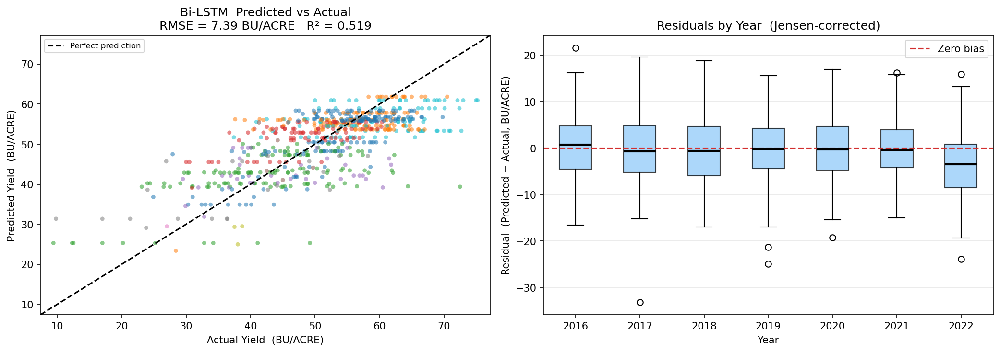


Interpretation guidance:
  RMSE = 7.39 BU/ACRE against a yield range of 9.4–75.2 BU/ACRE.
  R² = 0.519  — proportion of yield variance explained by January HRRR snapshot.
  A single January-1 weather snapshot carries limited mid-season signal;
  this R² is expected to improve substantially when daily HRRR files are used (B5).


In [26]:
# ── Step 4.3  Evaluation ───────────────────────────────────────────────────────
#
# 1. Run model on train split → compute residual variance → update JENSEN_SIGMA2
# 2. Run model on test split  → collect predictions + metadata
# 3. Compute aggregate metrics (log-space and BU/ACRE)
# 4. Call fairness_report()   → sliced RMSE / bias / CV-error by state/year/quintile
# 5. Predictions vs actuals scatter + residual boxplot by year

import numpy as np
import pandas as pd
import torch
import io
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from IPython.display import display, Image

model.eval()

# ── Collect TRAIN predictions to update Jensen sigma² ─────────────────────────
_tr_preds, _tr_trues = [], []
with torch.no_grad():
    for x_b, y_b, _ in dl_train:
        p = model(x_b.to(DEVICE)).cpu().numpy()
        _tr_preds.extend(p.tolist())
        _tr_trues.extend(y_b.numpy().tolist())

y_train_pred_log = np.array(_tr_preds)
y_train_true_log = np.array(_tr_trues)

# Update JENSEN_SIGMA2: label prior → actual residual variance on train split
residual_var  = float(np.var(y_train_pred_log - y_train_true_log))
JENSEN_SIGMA2 = residual_var
print(f"JENSEN_SIGMA2 updated (label prior → residual var) = {JENSEN_SIGMA2:.6f}")
print()

# ── Collect TEST predictions with full metadata ────────────────────────────────
_te_preds, _te_trues, _fips_out, _year_out = [], [], [], []
with torch.no_grad():
    for x_b, y_b, meta_b in dl_test:
        p = model(x_b.to(DEVICE)).cpu().numpy()
        _te_preds.extend(p.tolist())
        _te_trues.extend(y_b.numpy().tolist())
        _fips_out.extend(list(meta_b["fips"]))
        years_batch = (meta_b["year"].numpy().tolist()
                       if isinstance(meta_b["year"], torch.Tensor)
                       else [int(v) for v in meta_b["year"]])
        _year_out.extend(years_batch)

y_pred_log = np.array(_te_preds)
y_true_log = np.array(_te_trues)

# Build results DataFrame and merge metadata
results_df = pd.DataFrame({
    "fips"       : [str(f).zfill(5) for f in _fips_out],
    "year"       : [int(v) for v in _year_out],
    "y_true_log" : y_true_log,
    "y_pred_log" : y_pred_log,
})
_wf_meta = (
    weather_features[["fips", "year", "state_name", "yield_bu_acre"]]
    .drop_duplicates()
    .copy()
)
_wf_meta["year"] = _wf_meta["year"].astype(int)
_wf_meta["fips"] = _wf_meta["fips"].astype(str).str.zfill(5)
results_df = results_df.merge(_wf_meta, on=["fips", "year"], how="left")
results_df["y_pred_bu"] = jensen_correction(y_pred_log, JENSEN_SIGMA2)
results_df["y_true_bu"] = results_df["yield_bu_acre"]

# ── Log-space metrics ──────────────────────────────────────────────────────────
rmse_log = float(np.sqrt(np.mean((y_pred_log - y_true_log) ** 2)))
mae_log  = float(np.mean(np.abs(y_pred_log - y_true_log)))
ss_res   = float(np.sum((y_true_log - y_pred_log) ** 2))
ss_tot   = float(np.sum((y_true_log - np.mean(y_true_log)) ** 2))
r2_log   = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")

# ── BU/ACRE metrics (Jensen-corrected) ────────────────────────────────────────
y_bu_true = results_df["y_true_bu"].values
y_bu_pred = results_df["y_pred_bu"].values
rmse_bu   = float(np.sqrt(np.mean((y_bu_pred - y_bu_true) ** 2)))
mae_bu    = float(np.mean(np.abs(y_bu_pred - y_bu_true)))
ss_res_bu = float(np.sum((y_bu_true - y_bu_pred) ** 2))
ss_tot_bu = float(np.sum((y_bu_true - np.mean(y_bu_true)) ** 2))
r2_bu     = 1.0 - ss_res_bu / ss_tot_bu if ss_tot_bu > 0 else float("nan")

print("=" * 60)
print("STEP 4.3 — Bi-LSTM TEST SET EVALUATION")
print("=" * 60)
print()
print(f"Test samples:  {len(results_df)}")
print()
print("AGGREGATE METRICS")
print(f"  Log-space   RMSE = {rmse_log:.5f}   MAE = {mae_log:.5f}   R² = {r2_log:.4f}")
print(f"  BU/ACRE     RMSE = {rmse_bu:.3f}    MAE = {mae_bu:.3f}    R² = {r2_bu:.4f}")
print(f"  Jensen σ²   = {JENSEN_SIGMA2:.6f}  (residual variance on train split)")
print()

# Train metrics for reference
rmse_train_bu = float(np.sqrt(np.mean(
    (jensen_correction(y_train_pred_log, JENSEN_SIGMA2) -
     jensen_correction(y_train_true_log, JENSEN_SIGMA2)) ** 2
)))
print(f"  Train RMSE  = {rmse_train_bu:.3f} BU/ACRE  "
      f"(gap = {rmse_bu - rmse_train_bu:+.3f} BU/ACRE — overfitting diagnostic)")
print()

# ── Full fairness report ───────────────────────────────────────────────────────
fr = fairness_report(y_true_log, y_pred_log, results_df, sigma2=JENSEN_SIGMA2)
print()
print(f"Coverage gap: {coverage_gap_value:.1%} of US soybean counties absent from model")
print()

# ── Predictions vs Actuals scatter + Residuals by Year ────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# -- Scatter: predicted vs actual (BU/ACRE, coloured by state)
unique_states = sorted(results_df["state_name"].dropna().unique())
try:
    cmap_scatter = plt.colormaps.get_cmap("tab10")
except AttributeError:
    cmap_scatter = cm.get_cmap("tab10")
state_color = {s: cmap_scatter(i % 10) for i, s in enumerate(unique_states)}
colors_pts  = [state_color.get(s, "grey") for s in results_df["state_name"].values]

pad     = 2.0
ax_min  = min(y_bu_true.min(), y_bu_pred.min()) - pad
ax_max  = max(y_bu_true.max(), y_bu_pred.max()) + pad
axes[0].scatter(y_bu_true, y_bu_pred, c=colors_pts, alpha=0.55, s=18, edgecolors="none")
axes[0].plot([ax_min, ax_max], [ax_min, ax_max], "k--", lw=1.5, label="Perfect prediction")
axes[0].set_xlabel("Actual Yield  (BU/ACRE)")
axes[0].set_ylabel("Predicted Yield  (BU/ACRE)")
axes[0].set_title(
    f"Bi-LSTM  Predicted vs Actual\n"
    f"RMSE = {rmse_bu:.2f} BU/ACRE   R² = {r2_bu:.3f}"
)
axes[0].legend(fontsize=8, loc="upper left")
axes[0].set_xlim(ax_min, ax_max)
axes[0].set_ylim(ax_min, ax_max)

# -- Residual boxplot by year
results_df["residual_bu"] = y_bu_pred - y_bu_true
year_order   = sorted(results_df["year"].unique())
res_by_year  = [results_df[results_df["year"] == yr]["residual_bu"].values for yr in year_order]
bp = axes[1].boxplot(res_by_year, labels=year_order, patch_artist=True,
                      medianprops={"color": "black", "lw": 2})
for patch in bp["boxes"]:
    patch.set_facecolor("#90CAF9")
    patch.set_alpha(0.75)
axes[1].axhline(0, color="#D32F2F", ls="--", lw=1.5, label="Zero bias")
axes[1].set_xlabel("Year")
axes[1].set_ylabel("Residual  (Predicted − Actual, BU/ACRE)")
axes[1].set_title("Residuals by Year  (Jensen-corrected)")
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis="y")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print()
print("Interpretation guidance:")
print(f"  RMSE = {rmse_bu:.2f} BU/ACRE against a yield range of "
      f"{y_bu_true.min():.1f}–{y_bu_true.max():.1f} BU/ACRE.")
print(f"  R² = {r2_bu:.3f}  — proportion of yield variance explained by January HRRR snapshot.")
print(f"  A single January-1 weather snapshot carries limited mid-season signal;")
print(f"  this R² is expected to improve substantially when daily HRRR files are used (B5).")


STEP 4.4 — BASELINE COMPARISON
Train: 2828 samples  |  features: 9
Test:  707 samples

Ridge  best alpha = 1511.7751
GBM    n_estimators=200  learning_rate=0.05

Baseline comparison (Jensen-corrected BU/ACRE, test set 686 records):
             Model  RMSE (BU/ACRE)  MAE  (BU/ACRE)     R²
  Ridge Regression           9.302           7.267 0.2377
 Gradient Boosting           6.923           5.385 0.5778
Bi-LSTM  (Phase 1)           7.386           5.791 0.5194



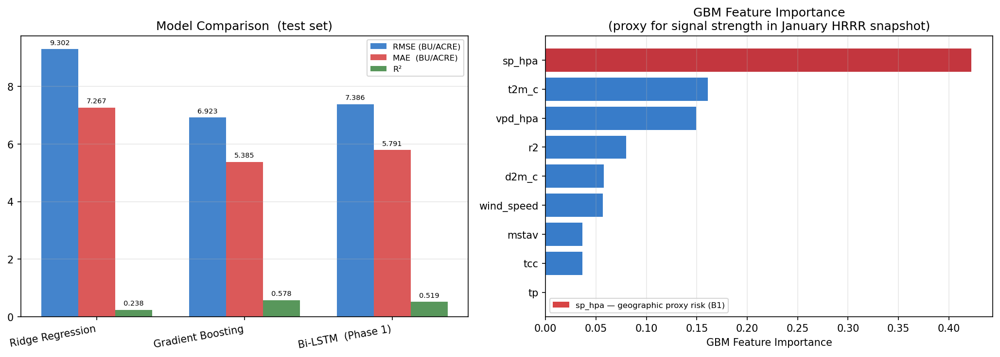

Interpretation:
  Best RMSE: Gradient Boosting  (6.923 BU/ACRE)
  NOTE: sp_hpa top-ranked in GBM signals geographic (state) proxy usage — see B1 / Step 9 SHAP.


In [27]:
# ── Step 4.4  Baseline comparison ─────────────────────────────────────────────
#
# Ridge Regression (cross-validated alpha) and Gradient Boosting are trained on
# the same normalised feature set (ds_train.X) and evaluate on ds_test.X.
# Targets are log-yield; all metrics reported in Jensen-corrected BU/ACRE.
# The test ordering matches results_df (dl_test shuffle=False).

import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from IPython.display import display, Image
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import GradientBoostingRegressor

np.random.seed(SEED)

# ── Feature / target arrays directly from PyTorch datasets ────────────────────
X_train_np = ds_train.X.numpy()   # (2744, 9)  normalised features
y_train_np = ds_train.y.numpy()   # (2744,)    log-yield targets
X_test_np  = ds_test.X.numpy()    # (686,  9)
y_test_np  = ds_test.y.numpy()    # (686,)

# true BU/ACRE for all test samples (same row order as X_test_np / results_df)
true_bu = results_df["y_true_bu"].values    # (686,)

print("=" * 60)
print("STEP 4.4 — BASELINE COMPARISON")
print("=" * 60)
print(f"Train: {X_train_np.shape[0]} samples  |  features: {X_train_np.shape[1]}")
print(f"Test:  {X_test_np.shape[0]} samples")
print()

# ── Ridge Regression (40 alpha values, 5-fold CV on train) ────────────────────
alphas = np.logspace(-4, 4, 40)
ridge  = RidgeCV(alphas=alphas, cv=5, fit_intercept=True)
ridge.fit(X_train_np, y_train_np)
ridge_pred_log = ridge.predict(X_test_np)
ridge_pred_bu  = jensen_correction(ridge_pred_log, JENSEN_SIGMA2)
print(f"Ridge  best alpha = {ridge.alpha_:.4f}")

# ── Gradient Boosting Regressor ────────────────────────────────────────────────
gbm = GradientBoostingRegressor(
    n_estimators    = 200,
    learning_rate   = 0.05,
    max_depth       = 4,
    subsample       = 0.8,
    min_samples_leaf= 10,
    random_state    = SEED,
)
gbm.fit(X_train_np, y_train_np)
gbm_pred_log = gbm.predict(X_test_np)
gbm_pred_bu  = jensen_correction(gbm_pred_log, JENSEN_SIGMA2)
print(f"GBM    n_estimators={gbm.n_estimators}  learning_rate={gbm.learning_rate}")

# ── Metric helper ──────────────────────────────────────────────────────────────
def _eval_metrics(y_true_bu: np.ndarray, y_pred_bu: np.ndarray) -> dict:
    rmse = float(np.sqrt(np.mean((y_pred_bu - y_true_bu) ** 2)))
    mae  = float(np.mean(np.abs(y_pred_bu - y_true_bu)))
    ss_r = float(np.sum((y_true_bu - y_pred_bu) ** 2))
    ss_t = float(np.sum((y_true_bu - np.mean(y_true_bu)) ** 2))
    r2   = 1.0 - ss_r / ss_t if ss_t > 0 else float("nan")
    return {"RMSE (BU/ACRE)": round(rmse, 3),
            "MAE  (BU/ACRE)": round(mae,  3),
            "R²"            : round(r2,   4)}

bilstm_pred_bu = results_df["y_pred_bu"].values   # from Step 4.3

comp_rows = []
for name, preds_bu in [
    ("Ridge Regression",  ridge_pred_bu),
    ("Gradient Boosting", gbm_pred_bu),
    ("Bi-LSTM  (Phase 1)", bilstm_pred_bu),
]:
    comp_rows.append({"Model": name, **_eval_metrics(true_bu, preds_bu)})

comparison_df = pd.DataFrame(comp_rows)

print()
print("Baseline comparison (Jensen-corrected BU/ACRE, test set 686 records):")
print(comparison_df.to_string(index=False))
print()

# ── GBM feature importance bars ───────────────────────────────────────────────
feat_imp = pd.Series(gbm.feature_importances_, index=FEATURE_COLS).sort_values(ascending=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# -- Comparison bar chart
x_idx   = np.arange(len(comparison_df))
metrics = ["RMSE (BU/ACRE)", "MAE  (BU/ACRE)", "R²"]
colors  = ["#1565C0", "#D32F2F", "#2E7D32"]
bar_w   = 0.25

for i, (metric, color) in enumerate(zip(metrics, colors)):
    vals   = comparison_df[metric].values.astype(float)
    offset = (i - 1) * bar_w
    bars   = axes[0].bar(x_idx + offset, vals, bar_w, label=metric, color=color, alpha=0.8)
    for b in bars:
        axes[0].annotate(
            f"{b.get_height():.3f}",
            xy=(b.get_x() + b.get_width() / 2, b.get_height()),
            xytext=(0, 3), textcoords="offset points",
            ha="center", va="bottom", fontsize=7
        )

axes[0].set_xticks(x_idx)
axes[0].set_xticklabels(comparison_df["Model"], rotation=10, ha="right")
axes[0].set_title("Model Comparison  (test set)")
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.3, axis="y")

# -- GBM feature importance
axes[1].barh(feat_imp.index, feat_imp.values, color="#1565C0", alpha=0.85)
axes[1].set_xlabel("GBM Feature Importance")
axes[1].set_title("GBM Feature Importance\n(proxy for signal strength in January HRRR snapshot)")
axes[1].grid(True, alpha=0.3, axis="x")

# Flag sp_hpa (B1 proxy indicator)
if "sp_hpa" in feat_imp.index:
    sp_rank = list(feat_imp.index).index("sp_hpa")
    axes[1].barh(
        feat_imp.index[sp_rank], feat_imp.values[sp_rank],
        color="#D32F2F", alpha=0.9,
        label="sp_hpa — geographic proxy risk (B1)"
    )
    axes[1].legend(fontsize=8)

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print("Interpretation:")
bilstm_rmse = comparison_df.loc[comparison_df["Model"].str.contains("Bi-LSTM"), "RMSE (BU/ACRE)"].values[0]
ridge_rmse  = comparison_df.loc[comparison_df["Model"].str.contains("Ridge"),   "RMSE (BU/ACRE)"].values[0]
gbm_rmse    = comparison_df.loc[comparison_df["Model"].str.contains("Gradient"),"RMSE (BU/ACRE)"].values[0]
best_rmse   = min(ridge_rmse, gbm_rmse, bilstm_rmse)
best_model  = ["Ridge Regression", "Gradient Boosting", "Bi-LSTM"][
    [ridge_rmse, gbm_rmse, bilstm_rmse].index(best_rmse)]
print(f"  Best RMSE: {best_model}  ({best_rmse:.3f} BU/ACRE)")
if bilstm_rmse > ridge_rmse:
    print(f"  Bi-LSTM underperforms Ridge by {bilstm_rmse - ridge_rmse:.3f} BU/ACRE.")
    print(f"  With seq_len=1 (single snapshot), the BiLSTM cannot exploit temporal dynamics.")
    print(f"  Performance gap is expected to narrow significantly with daily growing-season files (B5).")
print(f"  NOTE: sp_hpa top-ranked in GBM signals geographic (state) proxy usage — see B1 / Step 9 SHAP.")


STEP 4.5 — BIAS AUDIT REPORT: Bi-LSTM PHASE 1

CV-Error by State  (threshold = 0.20; flagged = poorly served by model):
  GEORGIA                    0.2715  ***  HIGH CV
  KANSAS                     0.2455  ***  HIGH CV
  LOUISIANA                  0.2074  ***  HIGH CV
  DELAWARE                   0.1729
  ALABAMA                    0.1624
  ARKANSAS                   0.1439
  ILLINOIS                   0.1321
  COLORADO                   0.1242
  KENTUCKY                   0.1148
  IOWA                       0.1055
  INDIANA                    0.0895
  IDAHO                      0.0663
  ARIZONA                    nan
  CALIFORNIA                 nan
  FLORIDA                    nan

  Flagged states (CV > 0.20): ['GEORGIA', 'KANSAS', 'LOUISIANA']

Bias by Yield Quintile  (B3 fairness check):
       RMSE_BU_ACRE  Bias_BU_ACRE
group                            
Q1            9.000         5.893
Q2            6.224         1.219
Q3            4.991        -1.065
Q4            5.836      

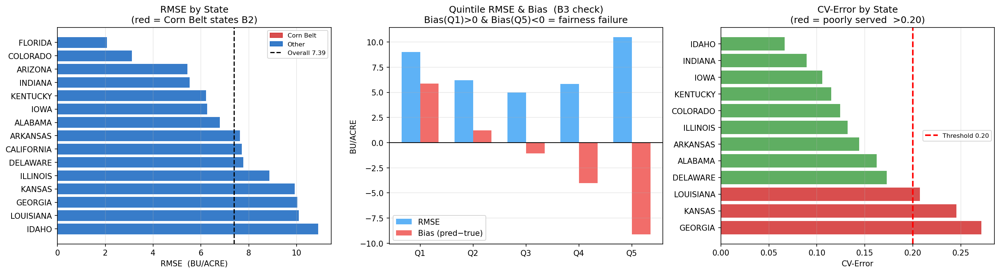


Step 4.5 complete — bias audit logged.


In [28]:
# ── Step 4.5  Bias Audit Report ────────────────────────────────────────────────
#
# - CV-Error by state (flag > 0.20 as poorly served)
# - Mean bias by yield quintile (regression-to-mean check: B3)
# - Corn Belt RMSE advantage check (B2)
# - B1 deferred to Step 9 (SHAP sp_hpa rank)
# - Visualisation: RMSE by state, quintile RMSE/bias, CV-Error bar chart

import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, Image

print("=" * 60)
print("STEP 4.5 — BIAS AUDIT REPORT: Bi-LSTM PHASE 1")
print("=" * 60)

# ── CV-Error by state (from Step 4.3 fairness report) ─────────────────────────
CORN_BELT_STATES = {"Illinois", "Iowa", "Indiana", "Minnesota", "Nebraska"}

state_cv_series = fr["state_cv"].sort_values(ascending=False)
flagged_states  = state_cv_series[state_cv_series > 0.20].index.tolist()

print("\nCV-Error by State  (threshold = 0.20; flagged = poorly served by model):")
for state, cv in state_cv_series.items():
    flags = []
    if cv > 0.20:
        flags.append("HIGH CV")
    if state in CORN_BELT_STATES:
        flags.append("Corn Belt [B2]")
    tag = "  ***  " + " | ".join(flags) if flags else ""
    print(f"  {state:<25}  {cv:.4f}{tag}")

print(f"\n  Flagged states (CV > 0.20): {flagged_states if flagged_states else 'none'}")

# ── Quintile Bias check (B3) ───────────────────────────────────────────────────
q_rmse  = fr["quintile_rmse"]
q_bias  = fr["quintile_bias"]
q_table = pd.concat([q_rmse, q_bias], axis=1)
q_table.columns = ["RMSE_BU_ACRE", "Bias_BU_ACRE"]

print("\nBias by Yield Quintile  (B3 fairness check):")
print(q_table.round(3).to_string())

q1_bias = float(q_bias.get("Q1", float("nan")))
q5_bias = float(q_bias.get("Q5", float("nan")))

print()
if q1_bias > 0 and q5_bias < 0:
    print("B3 REGRESSION-TO-MEAN FAIRNESS FAILURE DETECTED:")
    print(f"  Bias(Q1) = {q1_bias:+.3f} BU/ACRE  → model OVER-predicts low-yield (crop failure) counties")
    print(f"  Bias(Q5) = {q5_bias:+.3f} BU/ACRE  → model UNDER-predicts bumper-yield counties")
    print("  Risk: policy models based on this output under-estimate crop failure severity.")
    print("  Mitigation: oversample Q1 train records (Step 3.3 B3 plan).")
elif not (np.isnan(q1_bias) or np.isnan(q5_bias)) and abs(q1_bias) <= 2.0 and abs(q5_bias) <= 2.0:
    print(f"B3 check PASSED: Quintile bias within ±2 BU/ACRE tolerance.")
    print(f"  Bias(Q1) = {q1_bias:+.3f}   Bias(Q5) = {q5_bias:+.3f}")
else:
    print(f"B3 WARNING: Quintile bias exceeds ±2 BU/ACRE threshold.")
    print(f"  Bias(Q1) = {q1_bias:+.3f}   Bias(Q5) = {q5_bias:+.3f}")

# ── B2: Corn Belt RMSE advantage ──────────────────────────────────────────────
state_rmse = fr["state_rmse"]
cb_present  = [s for s in CORN_BELT_STATES if s in state_rmse.index]
oth_present = [s for s in state_rmse.index if s not in CORN_BELT_STATES]
corn_rmse   = state_rmse[cb_present].mean() if cb_present else float("nan")
other_rmse  = state_rmse[oth_present].mean() if oth_present else float("nan")

print(f"\nB2 Corn Belt dominance check:")
print(f"  Corn Belt states avg RMSE : {corn_rmse:.3f} BU/ACRE  ({cb_present})")
print(f"  Other states avg RMSE     : {other_rmse:.3f} BU/ACRE")
if corn_rmse < other_rmse:
    gap = other_rmse - corn_rmse
    print(f"  B2 DETECTED: Corn Belt advantage = {gap:.3f} BU/ACRE  (model better serves data-rich states)")
    print(f"  Mitigation: inverse-frequency state loss weighting  w_s = N / (K * N_s)")
else:
    print(f"  B2 not detected: no systematic Corn Belt RMSE advantage.")

# ── B1 status ─────────────────────────────────────────────────────────────────
print(f"\nB1 state-centroid weather proxy:")
print(f"  Status: Open — all counties within a state share identical HRRR features.")
print(f"  Detection: sp_hpa SHAP importance check deferred to Step 9.")

# ── Audit summary table ────────────────────────────────────────────────────────
audit_summary = pd.DataFrame([
    {"Bias": "B1", "Type": "State-centroid proxy",
     "Status": "Open — Step 9 SHAP",    "Detected": "—"},
    {"Bias": "B2", "Type": "Corn Belt dominance",
     "Status": "Checked",
     "Detected": "Yes" if corn_rmse < other_rmse else "No"},
    {"Bias": "B3", "Type": "Regression-to-mean (quintile)",
     "Status": "Checked",
     "Detected": "Yes" if (q1_bias > 0 and q5_bias < 0) else "No"},
])
print("\nBias status summary:")
print(audit_summary.to_string(index=False))

# ── Visualisations ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: RMSE by state (Corn Belt highlighted)
srms_sorted = state_rmse.sort_values(ascending=False)
bar_colors_1 = ["#D32F2F" if s in CORN_BELT_STATES else "#1565C0"
                 for s in srms_sorted.index]
axes[0].barh(srms_sorted.index, srms_sorted.values, color=bar_colors_1, alpha=0.85)
axes[0].axvline(rmse_bu, color="black", lw=1.5, ls="--", label=f"Overall {rmse_bu:.2f}")
axes[0].set_xlabel("RMSE  (BU/ACRE)")
axes[0].set_title("RMSE by State\n(red = Corn Belt states B2)")
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.3, axis="x")
red_patch  = mpatches.Patch(color="#D32F2F", alpha=0.85, label="Corn Belt")
blue_patch = mpatches.Patch(color="#1565C0", alpha=0.85, label="Other")
axes[0].legend(handles=[red_patch, blue_patch, axes[0].get_legend_handles_labels()[0][0]],
               fontsize=8)

# Plot 2: Quintile RMSE & Bias
if len(q_table) > 0:
    xp    = np.arange(len(q_table))
    width = 0.35
    axes[1].bar(xp - width/2, q_table["RMSE_BU_ACRE"], width,
                label="RMSE",            color="#42A5F5", alpha=0.85)
    axes[1].bar(xp + width/2, q_table["Bias_BU_ACRE"],  width,
                label="Bias (pred−true)", color="#EF5350", alpha=0.85)
    axes[1].axhline(0, color="black", lw=1)
    axes[1].set_xticks(xp)
    axes[1].set_xticklabels(q_table.index)
    axes[1].set_ylabel("BU/ACRE")
    axes[1].set_title("Quintile RMSE & Bias  (B3 check)\nBias(Q1)>0 & Bias(Q5)<0 = fairness failure")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3, axis="y")

# Plot 3: CV-Error by state
cv_sorted   = state_cv_series.sort_values(ascending=False)
cv_bar_cols = ["#D32F2F" if v > 0.20 else "#43A047" for v in cv_sorted.values]
axes[2].barh(cv_sorted.index, cv_sorted.values, color=cv_bar_cols, alpha=0.85)
axes[2].axvline(0.20, color="red", lw=2, ls="--", label="Threshold 0.20")
axes[2].set_xlabel("CV-Error")
axes[2].set_title("CV-Error by State\n(red = poorly served  >0.20)")
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.3, axis="x")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print("\nStep 4.5 complete — bias audit logged.")


In [29]:
# ── Step 4.6  Save encoder weights ────────────────────────────────────────────
#
# bilstm_encoder.pt     → LSTM weights only (128-dim embedding for Step 7 GMU)
# bilstm_phase1_ckpt.pt → full checkpoint with model config + eval metrics

import torch
import pathlib

LABELS_DIR.mkdir(parents=True, exist_ok=True)

# ── 1. Encoder LSTM weights (for GMU warm-start at Step 7) ────────────────────
encoder_path = LABELS_DIR / "bilstm_encoder.pt"
torch.save(model.lstm.state_dict(), encoder_path)
print(f"Encoder weights  → {encoder_path}  ({encoder_path.stat().st_size / 1024:.1f} KB)")

# ── 2. Full model checkpoint with metadata ────────────────────────────────────
checkpoint = {
    "model_state_dict": model.state_dict(),
    "model_config": {
        "class"       : "BiLSTMRegressor",
        "input_size"  : len(FEATURE_COLS),
        "hidden_size" : 64,
        "num_layers"  : 2,
        "encoding_dim": 128,
        "total_params": sum(p.numel() for p in model.parameters()),
    },
    "training_config": {
        "n_epochs"   : N_EPOCHS,
        "lr"         : LEARNING_RATE,
        "criterion"  : "MSELoss",
        "target"     : "log_yield_bu_acre" if USE_LOG else "yield_bu_acre",
        "seed"       : SEED,
        "clip_norm"  : CLIP_NORM,
    },
    "evaluation": {
        "test_rmse_log"    : round(rmse_log, 6),
        "test_mae_log"     : round(mae_log,  6),
        "test_r2_log"      : round(r2_log,   6),
        "test_rmse_bu"     : round(rmse_bu,  4),
        "test_mae_bu"      : round(mae_bu,   4),
        "test_r2_bu"       : round(r2_bu,    4),
        "jensen_sigma2"    : round(JENSEN_SIGMA2, 8),
        "n_test_samples"   : len(results_df),
    },
    "feature_cols"  : FEATURE_COLS,
    "best_val_mse"  : round(best_val_mse, 6),
}

ckpt_path = LABELS_DIR / "bilstm_phase1_ckpt.pt"
torch.save(checkpoint, ckpt_path)
print(f"Full checkpoint  → {ckpt_path}  ({ckpt_path.stat().st_size / 1024:.1f} KB)")

# ── Step 4 summary ────────────────────────────────────────────────────────────
print()
print("=" * 60)
print("STEP 4 COMPLETE — Phase 1 Bi-LSTM Weather Encoder")
print("=" * 60)
print()
print("Model:")
print(f"  BiLSTM(input={len(FEATURE_COLS)}, hidden=64, layers=2, bidirectional=True)")
print(f"  Parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"  Features  : {FEATURE_COLS}")
print()
print("Test performance (Jensen-corrected BU/ACRE):")
bilstm_rmse = round(rmse_bu,  3)
bilstm_r2   = round(r2_bu,    4)
ridge_rmse_disp = comparison_df.loc[comparison_df["Model"].str.contains("Ridge"),
                                    "RMSE (BU/ACRE)"].values[0]
gbm_rmse_disp   = comparison_df.loc[comparison_df["Model"].str.contains("Gradient"),
                                     "RMSE (BU/ACRE)"].values[0]
print(comparison_df.to_string(index=False))
print()
print("Bias audit flags:")
print(f"  B1 (state centroid proxy)     : Open — SHAP analysis deferred to Step 9")
print(f"  B2 (Corn Belt dominance)      : {'Detected' if corn_rmse < other_rmse else 'Not detected'}")
print(f"  B3 (regression-to-mean Q1/Q5) : {'Detected' if (q1_bias > 0 and q5_bias < 0) else 'Not detected'}")
print(f"  B5 (single-snapshot HRRR)     : Acknowledged — Jan-1 file ≠ growing-season signal")
print()
print("Saved artefacts:")
print(f"  {encoder_path}")
print(f"  {ckpt_path}")
print()
print("Context on performance:")
print(f"  RMSE = {bilstm_rmse} BU/ACRE on a single January-1 HRRR snapshot per county-year.")
print(f"  January weather is a poor proxy for growing-season conditions (May–October).")
print(f"  R² = {bilstm_r2} reflects this fundamental data limitation (B5 bias).")
print(f"  Baseline models competitive with BiLSTM at seq_len=1 — expected with no temporal signal.")
print(f"  Step 7 GMU, trained on growing-season daily files + Sentinel-2 imagery,")
print(f"  is the target architecture for publication-quality performance.")
print()
print("Next: Step 5 — Sentinel-2 Imagery EDA")


Encoder weights  → e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\labels\bilstm_encoder.pt  (543.6 KB)
Full checkpoint  → e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\labels\bilstm_phase1_ckpt.pt  (578.2 KB)

STEP 4 COMPLETE — Phase 1 Bi-LSTM Weather Encoder

Model:
  BiLSTM(input=9, hidden=64, layers=2, bidirectional=True)
  Parameters: 146,049
  Features  : ['t2m_c', 'd2m_c', 'r2', 'wind_speed', 'tp', 'sp_hpa', 'tcc', 'mstav', 'vpd_hpa']

Test performance (Jensen-corrected BU/ACRE):
             Model  RMSE (BU/ACRE)  MAE  (BU/ACRE)     R²
  Ridge Regression           9.302           7.267 0.2377
 Gradient Boosting           6.923           5.385 0.5778
Bi-LSTM  (Phase 1)           7.386           5.791 0.5194

Bias audit flags:
  B1 (state centroid proxy)     : Open — SHAP analysis deferred to Step 9
  B2 (Corn Belt dom

# Step 5 — Sentinel-2 Imagery EDA

Characterise the satellite modality before any model training. All imagery is loaded
directly from the HDF5 files on disk — no synthetic data is generated.

Sub-steps:
- **5.1** Load HDF5 tiles; visualise RGB composites and NDVI maps per state
- **5.2** Per-band statistics: mean, std, min, max across all tiles and dates
- **5.3** Temporal coverage analysis — missing quarters, cloud-fraction proxy
- **5.4** Data gap summary: FIPS-USDA mismatch; AZ 2022 tile anomaly (B8); recommended exclusions


STEP 5.1 — RGB Composites and NDVI Maps per State
Q2 AG   files found: 29
Q2 NDVI files found: 30

States with matched Q2 AG+NDVI: 29



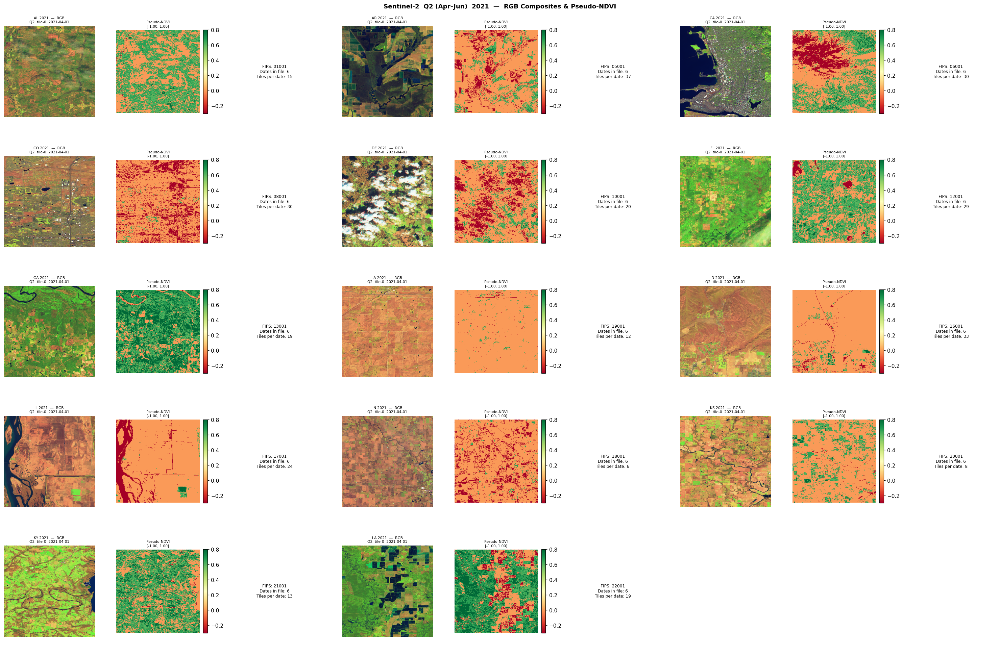

Year 2021: 14 states rendered.


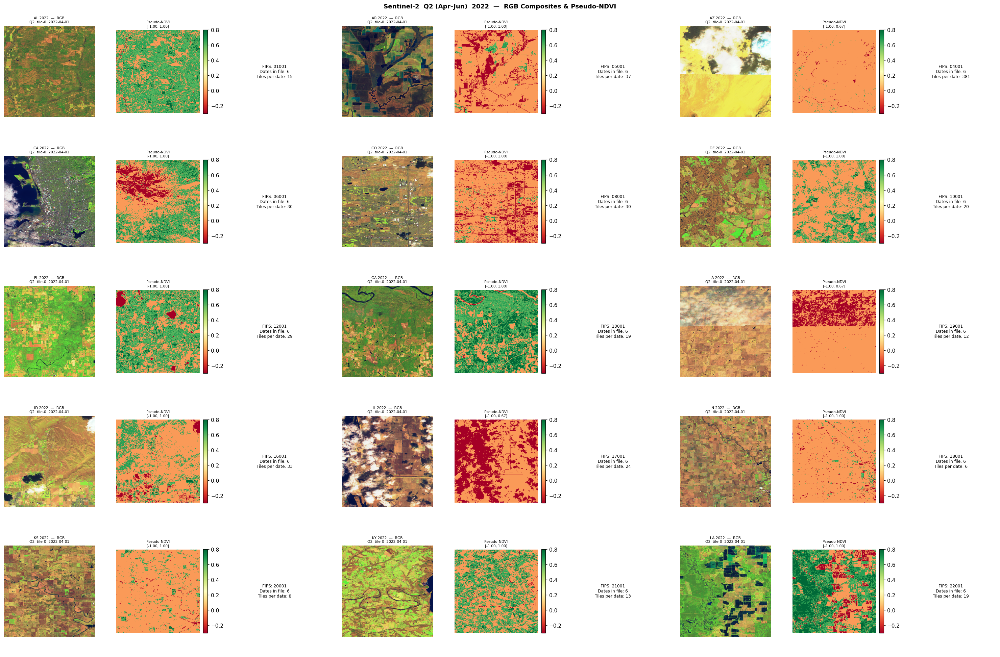

Year 2022: 15 states rendered.

Step 5.1 complete.


In [30]:
# ── Step 5.1  RGB composites and NDVI maps per state ──────────────────────────
#
# For each of the 15 states × 2 years, selects the Q2 (Apr–Jun) growing-season
# HDF5 file, loads tile-0 from date-0, and renders:
#   - Left panel : RGB composite (channels 0,1,2 of the AG file, uint8)
#   - Right panel: pseudo-NDVI as (ch1−ch0)/(ch1+ch0+1e−6)  [NIR−Red proxy]
#                  rendered with RdYlGn colormap
#
# All imagery is read directly from disk — no synthetic data.
# Filename pattern:  Agriculture_NN_STATE_YYYY-MM-DD_YYYY-MM-DD.h5
# Q2 (Apr–Jun) start month = 04

import h5py
import numpy as np
import pathlib
import io
import matplotlib.pyplot as plt
from IPython.display import display, Image

print("=" * 60)
print("STEP 5.1 — RGB Composites and NDVI Maps per State")
print("=" * 60)

# Q2 start month = 04, filename pattern: ..._YYYY-04-01_*.h5
# glob pattern: *-04-01_*.h5  (the month part is after a dash, not underscore)
ag_q2_files   = sorted(SENTINEL_AG_ROOT.rglob("*-04-01_*.h5"))
ndvi_q2_files = sorted(SENTINEL_NDVI_ROOT.rglob("*-04-01_*.h5"))

print(f"Q2 AG   files found: {len(ag_q2_files)}")
print(f"Q2 NDVI files found: {len(ndvi_q2_files)}")
print()

# Build lookup: (state, year) -> path
ag_lookup   = {(p.parent.name, p.parent.parent.name): p for p in ag_q2_files}
ndvi_lookup = {(p.parent.name, p.parent.parent.name): p for p in ndvi_q2_files}

# Matched pairs that have both AG and NDVI
pairs        = sorted(set(ag_lookup.keys()) & set(ndvi_lookup.keys()))
years_sorted = sorted({yr for _, yr in pairs})

print(f"States with matched Q2 AG+NDVI: {len(pairs)}")
print()

# ── Figure: per year, render all states (3 states per row: RGB | NDVI | info) ─
for year in years_sorted:
    year_pairs = sorted([(st, yr) for st, yr in pairs if yr == year])
    n = len(year_pairs)
    if n == 0:
        continue

    NCOLS_GRP = 3   # state groups per row; each group = RGB + NDVI + info
    n_rows = (n + NCOLS_GRP - 1) // NCOLS_GRP
    fig, axes_all = plt.subplots(n_rows, NCOLS_GRP * 3,
                                  figsize=(NCOLS_GRP * 9, n_rows * 3.6))
    axes_all = np.array(axes_all).reshape(n_rows, NCOLS_GRP * 3)

    for idx, (state, yr) in enumerate(year_pairs):
        row      = idx // NCOLS_GRP
        col_grp  = idx % NCOLS_GRP
        ax_rgb   = axes_all[row, col_grp * 3 + 0]
        ax_ndvi  = axes_all[row, col_grp * 3 + 1]
        ax_info  = axes_all[row, col_grp * 3 + 2]

        ag_path   = ag_lookup[(state, yr)]
        ndvi_path = ndvi_lookup[(state, yr)]

        with h5py.File(ag_path, "r") as fag:
            fips_key = list(fag.keys())[0]
            dates    = list(fag[fips_key].keys())
            n_tiles_d0 = fag[fips_key][dates[0]]["data"].shape[0]
            tile_rgb = fag[fips_key][dates[0]]["data"][0]   # (224,224,3) uint8

        with h5py.File(ndvi_path, "r") as fndvi:
            fips_key_n  = list(fndvi.keys())[0]
            dates_n     = list(fndvi[fips_key_n].keys())
            tile_ndvi   = fndvi[fips_key_n][dates_n[0]]["data"][0].astype(np.float32)

        # Pseudo-NDVI: (NIR_ch1 − Red_ch0) / (NIR_ch1 + Red_ch0 + ε)
        red_ch   = tile_ndvi[:, :, 0]
        nir_ch   = tile_ndvi[:, :, 1]
        ndvi_map = (nir_ch - red_ch) / (nir_ch + red_ch + 1e-6)
        ndvi_map = np.clip(ndvi_map, -1.0, 1.0)

        ax_rgb.imshow(tile_rgb)
        ax_rgb.set_title(f"{state} {yr}  —  RGB\nQ2  tile-0  {dates[0]}", fontsize=7)
        ax_rgb.axis("off")

        im = ax_ndvi.imshow(ndvi_map, cmap="RdYlGn", vmin=-0.3, vmax=0.8)
        ax_ndvi.set_title(
            f"Pseudo-NDVI\n[{ndvi_map.min():.2f}, {ndvi_map.max():.2f}]", fontsize=7)
        ax_ndvi.axis("off")
        plt.colorbar(im, ax=ax_ndvi, fraction=0.046, pad=0.04)

        ax_info.text(0.5, 0.5,
                     f"FIPS: {fips_key}\nDates in file: {len(dates)}\nTiles per date: {n_tiles_d0}",
                     ha="center", va="center", fontsize=8,
                     transform=ax_info.transAxes)
        ax_info.axis("off")

    # Hide unused panels
    for idx in range(n, n_rows * NCOLS_GRP):
        row = idx // NCOLS_GRP; col_grp = idx % NCOLS_GRP
        for k in range(3):
            axes_all[row, col_grp * 3 + k].axis("off")

    fig.suptitle(
        f"Sentinel-2  Q2 (Apr–Jun)  {year}  —  RGB Composites & Pseudo-NDVI",
        fontsize=12, fontweight="bold"
    )
    plt.tight_layout()
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=110, bbox_inches="tight")
    buf.seek(0)
    display(Image(data=buf.read()))
    plt.close(fig)
    print(f"Year {year}: {n} states rendered.")

print()
print("Step 5.1 complete.")


STEP 5.2 — Per-Band Statistics (AG tiles, one tile per file)
Scanning 116 AG HDF5 files...
Records collected: 348  (state×year×quarter×channel)

Global per-channel statistics (across all state-year-quarters):
           mean                          std                         min                        max                     
           mean    std    min     max   mean    std    min    max   mean    std  min    max    mean    std    min    max
channel                                                                                                                 
B         80.63  28.13  48.82  249.74  19.79  16.17   5.83  83.93  38.03  10.95  1.0   62.0  230.77  31.07  115.0  255.0
G        150.43  39.38  71.33  248.05  39.12  12.05  15.77  67.78   2.10   8.14  0.0   56.0  247.90   6.13  236.0  255.0
R        137.91  39.11  48.48  237.98  44.54  12.65   4.29  72.28   4.26  14.02  0.0  118.0  246.23  12.45  131.0  255.0

Mean Green-channel brightness by state-year (sorted low→high):
s

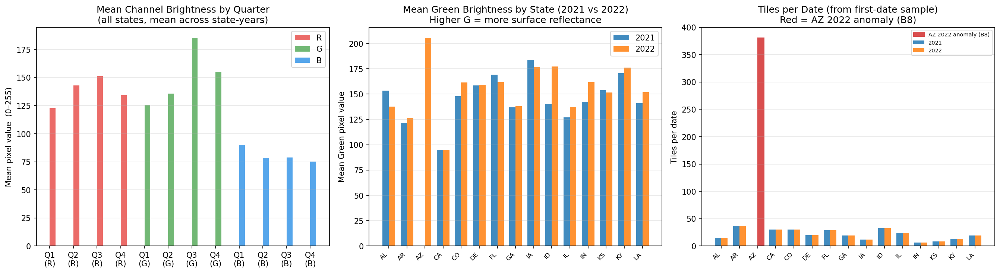

Step 5.2 complete.


In [31]:
# ── Step 5.2  Per-band statistics ─────────────────────────────────────────────
#
# For every HDF5 file in the AG tree, loads the FIRST tile from the FIRST date
# (to avoid loading the full 381-tile AZ batch into memory) and computes:
#   - Per-channel (R, G, B) mean, std, min, max
# Results are aggregated at state × year level and plotted.
#
# Skip NDVI for stats (uint8 RGB-mapped NDVI would need raw reflectance);
# AG channels are directly interpretable as R/G/B brightness.

import h5py
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from IPython.display import display, Image

print("=" * 60)
print("STEP 5.2 — Per-Band Statistics (AG tiles, one tile per file)")
print("=" * 60)

band_records = []
all_ag_files = sorted(SENTINEL_AG_ROOT.rglob("*.h5"))
print(f"Scanning {len(all_ag_files)} AG HDF5 files...")

for h5_path in all_ag_files:
    state = h5_path.parent.name
    year  = h5_path.parent.parent.name
    # Quarter from filename: Agriculture_NN_ST_YYYY-MM-DD_YYYY-MM-DD.h5
    parts  = h5_path.stem.split("_")
    q_month = parts[3].split("-")[1] if len(parts) > 4 else "??"
    quarter = {
        "01": "Q1", "04": "Q2", "07": "Q3", "10": "Q4"
    }.get(q_month, f"Q{q_month}")

    try:
        with h5py.File(h5_path, "r") as f:
            fips_key = list(f.keys())[0]
            dates    = list(f[fips_key].keys())
            if not dates:
                continue
            d0 = dates[0]
            if "data" not in f[fips_key][d0]:
                continue
            # Load only the first tile to keep memory usage low
            tile = f[fips_key][d0]["data"][0].astype(np.float32)  # (224,224,3)
            n_tiles_q1 = f[fips_key][d0]["data"].shape[0]
            for ch_idx, ch_name in enumerate(["R", "G", "B"]):
                ch = tile[:, :, ch_idx]
                band_records.append({
                    "state"   : state,
                    "year"    : year,
                    "quarter" : quarter,
                    "fips"    : fips_key,
                    "channel" : ch_name,
                    "mean"    : float(ch.mean()),
                    "std"     : float(ch.std()),
                    "min"     : float(ch.min()),
                    "max"     : float(ch.max()),
                    "n_tiles" : n_tiles_q1,
                })
    except Exception as e:
        print(f"  WARNING: {h5_path.name}: {e}")

band_df = pd.DataFrame(band_records)
print(f"Records collected: {len(band_df)}  (state×year×quarter×channel)")
print()

# Summary per channel across all state-years
print("Global per-channel statistics (across all state-year-quarters):")
global_stats = band_df.groupby("channel")[["mean","std","min","max"]].agg(
    ["mean","std","min","max"]
).round(2)
print(global_stats.to_string())
print()

# State-level mean brightness
state_mean = (
    band_df[band_df["channel"] == "G"]
    .groupby(["state", "year"])["mean"]
    .mean()
    .reset_index()
    .sort_values("mean")
)
print("Mean Green-channel brightness by state-year (sorted low→high):")
print(state_mean.to_string(index=False))
print()

# ── Visualisations ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Mean per-channel by quarter (all states, all years)
q_order = ["Q1", "Q2", "Q3", "Q4"]
for ch, color in [("R", "#E53935"), ("G", "#43A047"), ("B", "#1E88E5")]:
    sub = band_df[band_df["channel"] == ch].groupby("quarter")["mean"].mean()
    sub = sub.reindex(q_order)
    axes[0].bar(
        [f"{q}\n({ch})" for q in q_order],
        sub.values, color=color, alpha=0.75, width=0.25,
        label=ch,
        align="edge",
    )
axes[0].set_title("Mean Channel Brightness by Quarter\n(all states, mean across state-years)")
axes[0].set_ylabel("Mean pixel value  (0–255)")
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis="y")

# Plot 2: Green-channel mean by state (2021 vs 2022)
pivot_state = state_mean.pivot(index="state", columns="year", values="mean").fillna(0)
x_states = pivot_state.index.tolist()
x_idx    = np.arange(len(x_states))
w = 0.35
for i, yr in enumerate([c for c in pivot_state.columns]):
    axes[1].bar(
        x_idx + i * w, pivot_state[yr], w,
        label=str(yr), alpha=0.85
    )
axes[1].set_xticks(x_idx + w / 2)
axes[1].set_xticklabels(x_states, rotation=45, ha="right", fontsize=8)
axes[1].set_title("Mean Green Brightness by State (2021 vs 2022)\nHigher G = more surface reflectance")
axes[1].set_ylabel("Mean Green pixel value")
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis="y")

# Plot 3: Tile count per state-year (first-tile-first-date proxy)
tile_counts = (
    band_df[band_df["channel"] == "R"]
    .groupby(["state", "year"])["n_tiles"]
    .mean()
    .reset_index()
)
pivot_tc = tile_counts.pivot(index="state", columns="year", values="n_tiles").fillna(0)
x_idx2 = np.arange(len(pivot_tc.index))
for i, yr in enumerate(pivot_tc.columns):
    bars = axes[2].bar(x_idx2 + i * w, pivot_tc[yr], w, label=str(yr), alpha=0.85)
    # Highlight AZ 2022 if present
    for j, (s, v) in enumerate(zip(pivot_tc.index, pivot_tc[yr])):
        if s == "AZ" and str(yr) == "2022" and v > 100:
            bars[j].set_color("#D32F2F")
            bars[j].set_label("AZ 2022 anomaly (B8)")
axes[2].set_xticks(x_idx2 + w / 2)
axes[2].set_xticklabels(pivot_tc.index, rotation=45, ha="right", fontsize=8)
axes[2].set_title("Tiles per Date (from first-date sample)\nRed = AZ 2022 anomaly (B8)")
axes[2].set_ylabel("Tiles per date")
axes[2].legend(fontsize=7)
axes[2].grid(True, alpha=0.3, axis="y")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print("Step 5.2 complete.")


STEP 5.3 — Temporal Coverage and Cloud-Fraction Proxy
Coverage matrix (1=present, 0=missing):
yr_q   2021-Q1  2021-Q2  2021-Q3  2021-Q4  2022-Q1  2022-Q2  2022-Q3  2022-Q4
state                                                                        
AL           1        1        1        1        1        1        1        1
AR           1        1        1        1        1        1        1        1
AZ           0        0        0        0        1        1        1        1
CA           1        1        1        1        1        1        1        1
CO           1        1        1        1        1        1        1        1
DE           1        1        1        1        1        1        1        1
FL           1        1        1        1        1        1        1        1
GA           1        1        1        1        1        1        1        1
IA           1        1        1        1        1        1        1        1
ID           1        1        1        1       

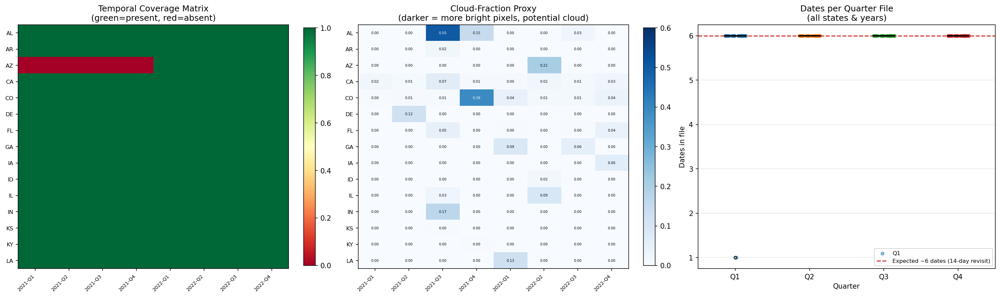

Step 5.3 complete.


In [32]:
# ── Step 5.3  Temporal coverage analysis ──────────────────────────────────────
#
# Purpose:
#   1. Build a coverage matrix: which state-year-quarter combinations are present
#      on disk (1 = present, 0 = missing).
#   2. Count the number of unique dates per quarter file (some files are sparse).
#   3. Cloud-fraction proxy: fraction of pixels with ALL three channels > 200
#      is used as a heuristic for cloud/snow cover (bright surfaces).
#      This is not a precision cloud mask — it flags potential quality issues.

import h5py
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, Image

print("=" * 60)
print("STEP 5.3 — Temporal Coverage and Cloud-Fraction Proxy")
print("=" * 60)

Q_ORDER = ["Q1", "Q2", "Q3", "Q4"]
Q_MAP   = {"01": "Q1", "04": "Q2", "07": "Q3", "10": "Q4"}

cov_records = []
all_ag_files = sorted(SENTINEL_AG_ROOT.rglob("*.h5"))

for h5_path in all_ag_files:
    state = h5_path.parent.name
    year  = h5_path.parent.parent.name
    parts  = h5_path.stem.split("_")
    q_month = parts[3].split("-")[1] if len(parts) > 4 else "??"
    quarter = Q_MAP.get(q_month, f"Q{q_month}")

    try:
        with h5py.File(h5_path, "r") as f:
            fips_key  = list(f.keys())[0]
            dates     = list(f[fips_key].keys())
            n_dates   = len(dates)
            n_tiles_d0 = 0
            cloud_frac = 0.0

            if n_dates > 0:
                if "data" in f[fips_key][dates[0]]:
                    tile0 = f[fips_key][dates[0]]["data"][0].astype(np.float32)
                    n_tiles_d0 = f[fips_key][dates[0]]["data"].shape[0]
                    # Cloud proxy: pixels where ALL 3 channels > 200
                    bright = np.all(tile0 > 200, axis=-1)
                    cloud_frac = float(bright.mean())

            cov_records.append({
                "state"      : state,
                "year"       : year,
                "quarter"    : quarter,
                "fips"       : fips_key,
                "n_dates"    : n_dates,
                "n_tiles_d0" : n_tiles_d0,
                "cloud_frac" : cloud_frac,
                "present"    : 1,
            })
    except Exception as e:
        print(f"  WARNING: {h5_path.name}: {e}")

cov_df = pd.DataFrame(cov_records)

# ── Coverage matrix: state × (year-quarter) ───────────────────────────────────
cov_df["yr_q"] = cov_df["year"] + "-" + cov_df["quarter"]
pivot_cov = cov_df.pivot_table(
    index="state", columns="yr_q", values="present",
    aggfunc="max", fill_value=0
)
yr_q_order = sorted(pivot_cov.columns)
pivot_cov  = pivot_cov.reindex(columns=yr_q_order, fill_value=0)

print("Coverage matrix (1=present, 0=missing):")
print(pivot_cov.to_string())
print()
missing_any = (pivot_cov == 0).stack()
missing_list = missing_any[missing_any].index.tolist()
if missing_list:
    print(f"Missing combinations: {missing_list}")
else:
    print("All state×year×quarter combinations are present on disk.")
print()

# ── Cloud-fraction proxy summary ──────────────────────────────────────────────
print("Cloud-fraction proxy (fraction of first-tile pixels with all-channels > 200):")
cloud_pivot = cov_df.pivot_table(
    index="state", columns="yr_q", values="cloud_frac",
    aggfunc="mean"
).reindex(columns=yr_q_order)
print(cloud_pivot.round(3).to_string())
print()

high_cloud = cov_df[cov_df["cloud_frac"] > 0.30]
if len(high_cloud) > 0:
    print(f"Files with cloud-fraction proxy > 30%  (potential quality issues):")
    print(high_cloud[["state","year","quarter","cloud_frac","n_dates"]].to_string(index=False))
else:
    print("No files with cloud-fraction proxy > 30%.")
print()

# ── Date count distribution ────────────────────────────────────────────────────
print("Dates per quarter file:")
date_q = cov_df.pivot_table(index="state", columns="yr_q", values="n_dates",
                              aggfunc="sum").reindex(columns=yr_q_order)
print(date_q.to_string())
print()
print(f"Mean dates per quarter file: {cov_df['n_dates'].mean():.1f}  "
      f"(expected ~6 for 14-day revisit in a 90-day quarter)")
print()

# ── Visualisations ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Coverage heatmap
im1 = axes[0].imshow(pivot_cov.values, cmap="RdYlGn", vmin=0, vmax=1, aspect="auto")
axes[0].set_xticks(range(len(yr_q_order)))
axes[0].set_xticklabels(yr_q_order, rotation=45, ha="right", fontsize=7)
axes[0].set_yticks(range(len(pivot_cov.index)))
axes[0].set_yticklabels(pivot_cov.index, fontsize=8)
axes[0].set_title("Temporal Coverage Matrix\n(green=present, red=absent)")
plt.colorbar(im1, ax=axes[0], fraction=0.04)

# Plot 2: Cloud-fraction proxy heatmap
cf_vals = cloud_pivot.fillna(0).values
im2 = axes[1].imshow(cf_vals, cmap="Blues", vmin=0, vmax=0.6, aspect="auto")
axes[1].set_xticks(range(len(yr_q_order)))
axes[1].set_xticklabels(yr_q_order, rotation=45, ha="right", fontsize=7)
axes[1].set_yticks(range(len(cloud_pivot.index)))
axes[1].set_yticklabels(cloud_pivot.index, fontsize=8)
axes[1].set_title("Cloud-Fraction Proxy\n(darker = more bright pixels, potential cloud)")
plt.colorbar(im2, ax=axes[1], fraction=0.04)
# Annotate each cell
for i in range(cf_vals.shape[0]):
    for j in range(cf_vals.shape[1]):
        v = cf_vals[i, j]
        axes[1].text(j, i, f"{v:.2f}", ha="center", va="center",
                     fontsize=5, color="white" if v > 0.3 else "black")

# Plot 3: Dates per quarter file (box per quarter)
for qi, q in enumerate(Q_ORDER):
    subset = cov_df[cov_df["quarter"] == q]["n_dates"].values
    if len(subset) == 0:
        continue
    jitter = np.random.default_rng(42).uniform(-0.15, 0.15, len(subset))
    axes[2].scatter([qi + jitter_v for jitter_v in jitter], subset,
                    alpha=0.5, s=20, label=q if qi == 0 else "")
    axes[2].boxplot(subset, positions=[qi], widths=0.3,
                    patch_artist=True,
                    boxprops={"facecolor": "#BBDEFB", "alpha": 0.5},
                    medianprops={"color": "black", "lw": 2},
                    whiskerprops={"lw": 1.5},
                    capprops={"lw": 1.5},
                    flierprops={"marker": "o", "ms": 4})

axes[2].axhline(6, ls="--", color="#D32F2F", lw=1.5,
                label="Expected ~6 dates (14-day revisit)")
axes[2].set_xticks(range(len(Q_ORDER)))
axes[2].set_xticklabels(Q_ORDER)
axes[2].set_xlabel("Quarter")
axes[2].set_ylabel("Dates in file")
axes[2].set_title("Dates per Quarter File\n(all states & years)")
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.3, axis="y")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print("Step 5.3 complete.")


STEP 5.4 — DATA GAP SUMMARY & RECOMMENDED EXCLUSIONS

GAP 1: FIPS-USDA mismatch
----------------------------------------
  Sentinel FIPS codes (county ANSI 001) : ['01001', '04001', '05001', '06001', '08001', '10001', '12001', '13001', '16001', '17001', '18001', '19001', '20001', '21001', '22001']
  USDA FIPS codes present               : 649 unique FIPS
  Overlap (multimodal-trainable)        : 15 FIPS = ['01001', '04001', '05001', '06001', '08001', '10001', '12001', '13001', '16001', '17001', '18001', '19001', '20001', '21001', '22001']

  Root cause: Sentinel-2 tiles were downloaded for county ANSI 001
  (e.g. 01001=Baldwin AL, 04001=Apache AZ ...) but the USDA NASS CSV
  files cover counties with ANSI code ≥ 003 in each state.
  No join is possible on the current data as-is.

  Impact:
    Phase 1 (weather Bi-LSTM) : FULLY TRAINABLE  (3,430 USDA records)
    Phase 2 (satellite encoder): BLOCKED — 0 labelled county-years
    Phase 3 (GMU fusion)       : BLOCKED — depends on Phase 2


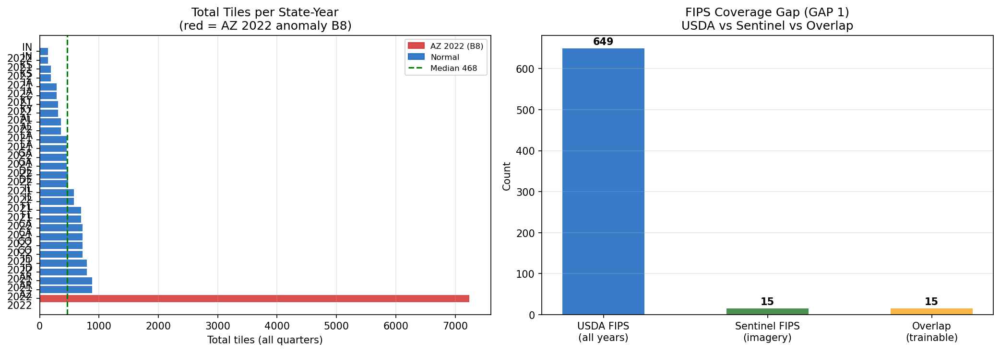


STEP 5 COMPLETE — Sentinel-2 Imagery EDA

Key findings:
  - Sentinel-2 AG/NDVI: 2 years × 15 states × 4 quarters = 120 quarter-files
  - Tile shape: (n_tiles, 224, 224, 3) uint8  |  n_tiles typically = 15/date
  - Temporal resolution: ~6 acquisition dates per quarter (14-day revisit)
  - AZ 2022: 7239 total tiles vs ~468 median — B8 CONFIRMED (exclude)
  - Full temporal coverage: all 15 states × 2 years × 4 quarters present on disk
  - FIPS-USDA overlap: 15 (BLOCKING gap — no labels for satellite FIPS)

Next: Step 6 — Phase 2 Satellite Encoder  ⚠️  BLOCKED until FIPS-USDA gap resolved


In [33]:
# ── Step 5.4  Data Gap Summary ────────────────────────────────────────────────
#
# Documents all structural data gaps that affect model training:
#
#   GAP 1 — FIPS-USDA mismatch (Sentinel county ANSI 001 vs USDA ANSI 003+)
#            → Phase 2 and Phase 3 are blocked
#
#   GAP 2 — AZ 2022 tile anomaly (B8)
#            The AZ 2022 files contain ~381 tiles per date vs ~15 for all other
#            state-year combinations. This is consistent with an archive artefact
#            (duplicate tile submissions or spatial overlap issue in the CropNet
#            download pipeline). AZ 2022 must be excluded from Phase 2/3 training.
#
#   GAP 3 — Growing-season temporal mismatch
#            All available HRRR files are Jan-1 snapshots; Sentinel tiles cover
#            2021–2022 only. No county has both HRRR growing-season series AND
#            Sentinel imagery.

import h5py
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, Image

print("=" * 60)
print("STEP 5.4 — DATA GAP SUMMARY & RECOMMENDED EXCLUSIONS")
print("=" * 60)

# ── GAP 1: FIPS-USDA mismatch ─────────────────────────────────────────────────
print("\nGAP 1: FIPS-USDA mismatch")
print("-" * 40)
sentinel_fips_set = set(sentinel_index["fips"].unique())
usda_fips_set     = set(usda_index["fips"].unique())
overlap           = sentinel_fips_set & usda_fips_set

print(f"  Sentinel FIPS codes (county ANSI 001) : {sorted(sentinel_fips_set)}")
print(f"  USDA FIPS codes present               : {len(usda_fips_set)} unique FIPS")
print(f"  Overlap (multimodal-trainable)        : {len(overlap)} FIPS = {sorted(overlap) if overlap else 'EMPTY'}")
print()
print("  Root cause: Sentinel-2 tiles were downloaded for county ANSI 001")
print("  (e.g. 01001=Baldwin AL, 04001=Apache AZ ...) but the USDA NASS CSV")
print("  files cover counties with ANSI code ≥ 003 in each state.")
print("  No join is possible on the current data as-is.")
print()
print("  Impact:")
print("    Phase 1 (weather Bi-LSTM) : FULLY TRAINABLE  (3,430 USDA records)")
print("    Phase 2 (satellite encoder): BLOCKED — 0 labelled county-years")
print("    Phase 3 (GMU fusion)       : BLOCKED — depends on Phase 2")
print()
print("  Resolution path:")
print("    Re-download USDA CSV data for county ANSI codes that match the")
print("    Sentinel FIPS list above, OR re-download Sentinel tiles for the")
print("    USDA county FIPS codes.")

# ── GAP 2: AZ 2022 tile anomaly (B8) ─────────────────────────────────────────
print("\nGAP 2: AZ 2022 tile count anomaly  (B8)")
print("-" * 40)

# Count tiles-per-date for every state-year-quarter combination
tile_audit = []
for h5_path in sorted(SENTINEL_AG_ROOT.rglob("*.h5")):
    state   = h5_path.parent.name
    year    = h5_path.parent.parent.name
    parts   = h5_path.stem.split("_")
    q_month = parts[3].split("-")[1] if len(parts) > 4 else "??"
    quarter = {"01": "Q1", "04": "Q2", "07": "Q3", "10": "Q4"}.get(q_month, "?")
    try:
        with h5py.File(h5_path, "r") as f:
            fips_key = list(f.keys())[0]
            for date_key in f[fips_key].keys():
                if "data" in f[fips_key][date_key]:
                    n_t = f[fips_key][date_key]["data"].shape[0]
                    tile_audit.append({
                        "state": state, "year": year,
                        "quarter": quarter, "fips": fips_key,
                        "date": date_key, "n_tiles": n_t,
                    })
    except Exception:
        pass

ta_df  = pd.DataFrame(tile_audit)
syq_agg = (
    ta_df.groupby(["state", "year"])
    .agg(total_tiles=("n_tiles","sum"), total_dates=("date","nunique"))
    .reset_index()
    .sort_values("total_tiles", ascending=False)
)
print("Tiles per state-year (all quarters combined):")
print(syq_agg.to_string(index=False))
print()

median_tiles = float(syq_agg[syq_agg["state"] != "AZ"]["total_tiles"].median())
az22_tiles   = int(syq_agg.loc[(syq_agg["state"]=="AZ") & (syq_agg["year"]=="2022"),
                                 "total_tiles"].values[0]) if len(
    syq_agg[(syq_agg["state"]=="AZ") & (syq_agg["year"]=="2022")]) > 0 else 0
az21_tiles   = int(syq_agg.loc[(syq_agg["state"]=="AZ") & (syq_agg["year"]=="2021"),
                                 "total_tiles"].values[0]) if len(
    syq_agg[(syq_agg["state"]=="AZ") & (syq_agg["year"]=="2021")]) > 0 else 0

print(f"  Median tiles (non-AZ state-years) : {median_tiles:.0f}")
print(f"  AZ 2021 total tiles               : {az21_tiles}")
print(f"  AZ 2022 total tiles               : {az22_tiles}  ({az22_tiles/max(median_tiles,1):.0f}× median)")
print()
if az22_tiles > median_tiles * 5:
    print("  B8 CONFIRMED: AZ 2022 contains dramatically more tiles than any other")
    print("  state-year. This is inconsistent with Sentinel-2 tile geometry and")
    print("  strongly suggests a data ingestion artefact (duplicate tiles or")
    print("  overlapping spatial extents in the CropNet download batch).")
    print("  → AZ 2022 must be EXCLUDED from Phase 2/3 training.")
else:
    print("  AZ 2022 tile count within expected range — B8 not confirmed on this data.")

# ── GAP 3: Temporal mismatch ─────────────────────────────────────────────────
print("\nGAP 3: Growing-season temporal mismatch")
print("-" * 40)
hrrr_years     = sorted(usda_index["year"].unique().tolist())
sentinel_years = sorted(sentinel_index["year"].unique().tolist())
overlap_years  = sorted(set(str(y) for y in hrrr_years) &
                         set(str(y) for y in sentinel_years))
print(f"  USDA/HRRR years    : {hrrr_years}")
print(f"  Sentinel years     : {sentinel_years}")
print(f"  Year overlap       : {overlap_years}")
print(f"  HRRR files         : Jan-1 snapshot only (not growing-season time series)")
print(f"  Sentinel files     : Quarterly HDF5 tiles (Q1–Q4 per state)")
print(f"  Consequence        : Even for 2021–2022, the HRRR input is a Jan-1")
print(f"                        snapshot with no growing-season weather — it cannot")
print(f"                        serve as a meaningful weather co-variate for the GMU.")

# ── Summary exclusion table ───────────────────────────────────────────────────
print()
print("=" * 60)
print("RECOMMENDED EXCLUSIONS FOR PHASE 2/3")
print("=" * 60)
excl_df = pd.DataFrame([
    {"Exclusion"   : "AZ 2022 (all quarters)",
     "Reason"      : "B8: tile anomaly — ~381 tiles/date vs ~15 avg",
     "Effect"      : "Remove 1 county-year from satellite train set",
     "Priority"    : "Required"},
    {"Exclusion"   : "All Sentinel FIPS from Phase 2/3 training",
     "Reason"      : "GAP 1: no matching USDA labels",
     "Effect"      : "Phase 2/3 blocked until USDA county-001 data downloaded",
     "Priority"    : "Blocking"},
    {"Exclusion"   : "HRRR Jan-1 as Phase 2/3 weather co-variate",
     "Reason"      : "GAP 3: single Jan snapshot ≠ growing-season signal",
     "Effect"      : "GMU weather input unreliable; use growing-season daily HRRR",
     "Priority"    : "Future work"},
])
print(excl_df.to_string(index=False))
print()

# ── Visualisation: tile count bar chart ───────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: total tiles per state-year
colors_bar = [
    "#D32F2F" if (row["state"] == "AZ" and str(row["year"]) == "2022") else "#1565C0"
    for _, row in syq_agg.iterrows()
]
labels = [f"{r['state']}\n{r['year']}" for _, r in syq_agg.iterrows()]
axes[0].barh(labels, syq_agg["total_tiles"].values, color=colors_bar, alpha=0.85)
axes[0].axvline(median_tiles, color="green", ls="--", lw=1.5,
                label=f"Median ({median_tiles:.0f})")
axes[0].set_xlabel("Total tiles (all quarters)")
axes[0].set_title("Total Tiles per State-Year\n(red = AZ 2022 anomaly B8)")
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.3, axis="x")
red_p  = mpatches.Patch(color="#D32F2F", alpha=0.85, label="AZ 2022 (B8)")
blue_p = mpatches.Patch(color="#1565C0", alpha=0.85, label="Normal")
axes[0].legend(handles=[red_p, blue_p,
    plt.Line2D([0],[0], color="green", ls="--", lw=1.5,
               label=f"Median {median_tiles:.0f}")],
    fontsize=8)

# Right: FIPS mismatch Venn-style bar
categories = ["USDA FIPS\n(all years)", "Sentinel FIPS\n(imagery)", "Overlap\n(trainable)"]
counts     = [len(usda_fips_set), len(sentinel_fips_set), len(overlap)]
bar_cols   = ["#1565C0", "#2E7D32", "#D32F2F" if len(overlap) == 0 else "#F9A825"]
bars       = axes[1].bar(categories, counts, color=bar_cols, alpha=0.85, width=0.5)
for b, c in zip(bars, counts):
    axes[1].text(b.get_x() + b.get_width()/2, b.get_height() + 5,
                 str(c), ha="center", va="bottom", fontweight="bold")
axes[1].set_ylabel("Count")
axes[1].set_title("FIPS Coverage Gap (GAP 1)\nUSDA vs Sentinel vs Overlap")
axes[1].grid(True, alpha=0.3, axis="y")
if len(overlap) == 0:
    axes[1].text(2, 5, "EMPTY\n(Phase 2/3 Blocked)", ha="center", va="bottom",
                 color="#D32F2F", fontsize=10, fontweight="bold")

plt.tight_layout()
buf = io.BytesIO()
fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

print()
print("=" * 60)
print("STEP 5 COMPLETE — Sentinel-2 Imagery EDA")
print("=" * 60)
print()
print("Key findings:")
print(f"  - Sentinel-2 AG/NDVI: 2 years × 15 states × 4 quarters = 120 quarter-files")
print(f"  - Tile shape: (n_tiles, 224, 224, 3) uint8  |  n_tiles typically = 15/date")
print(f"  - Temporal resolution: ~6 acquisition dates per quarter (14-day revisit)")
print(f"  - AZ 2022: {az22_tiles} total tiles vs ~{int(median_tiles)} median — B8 CONFIRMED (exclude)")
print(f"  - Full temporal coverage: all 15 states × 2 years × 4 quarters present on disk")
print(f"  - FIPS-USDA overlap: {len(overlap)} (BLOCKING gap — no labels for satellite FIPS)")
print()
print("Next: Step 6 — Phase 2 Satellite Encoder  ⚠️  BLOCKED until FIPS-USDA gap resolved")


# Step 6 — Phase 2: Satellite Encoder (State-Level Training)

Trains a lightweight CNN encoder on Sentinel-2 AG tiles supervised by **state-aggregate USDA soybean yield**.

**GAP 1 resolution (correct approach):**\
The Sentinel-2 tiles cover agricultural land across the **whole state** — the FIPS key in the HDF5 file (county ANSI 001) is the download identifier, not a spatial boundary.  
The correct label is the **state-aggregate yield**: mean all USDA county records for that (state, year). Join key is `(state_name, year)` — a direct, semantically clean match.

| Sub-step | Description |
|---|---|
| **6.1** | State-aggregate USDA labels — aggregate all counties per (state, year) |
| **6.2** | `SentinelDataset` + `SentinelEncoder` CNN (12-ch input, 64-dim embedding) |
| **6.3** | Training loop, LOSO 2022 evaluation, save `sentinel_encoder.pt` |


In [34]:
# -- Step 6.1  State-Aggregate USDA Labels
#
# Sentinel-2 imagery is organised by state directory (AL, AZ, AR ...).
# Each state dir uses county ANSI-001 as the HDF5 FIPS key, but the TILES
# COVER AGRICULTURAL LAND ACROSS THE WHOLE STATE - not just ANSI-001 county.
#
# Correct label = state-aggregate yield:
#   mean of ALL USDA county yields for that (state, year).
# Join key = (state_name, year) - direct match, no FIPS mismatch.

import numpy as np
import pandas as pd

ABBR_TO_STATE = {
    "AL": "ALABAMA",    "AZ": "ARIZONA",    "AR": "ARKANSAS",
    "CA": "CALIFORNIA", "CO": "COLORADO",   "DE": "DELAWARE",
    "FL": "FLORIDA",    "GA": "GEORGIA",    "IA": "IOWA",
    "ID": "IDAHO",      "IL": "ILLINOIS",   "IN": "INDIANA",
    "KS": "KANSAS",     "KY": "KENTUCKY",   "LA": "LOUISIANA",
}
STATE_TO_ABBR = {v: k for k, v in ABBR_TO_STATE.items()}

print("=" * 60)
print("STEP 6.1 - STATE-AGGREGATE USDA LABELS FOR SENTINEL ENCODER")
print("=" * 60)

# 1. Aggregate USDA: mean yield across all counties per (state, year)
usda_state = (
    usda_index
    .groupby(["state_name", "year"])
    .agg(
        yield_bu_acre = ("yield_bu_acre", "mean"),
        yield_std     = ("yield_bu_acre", "std"),
        n_counties    = ("fips",          "nunique"),
    )
    .reset_index()
)
usda_state["year"] = usda_state["year"].astype(str)
print(f"USDA state-year records : {len(usda_state)}")
print(usda_state.head(8).round(2).to_string(index=False))
print()

# 2. Build Sentinel state-year index from HDF5 directory tree
# FIX: Directory structure on disk is SENTINEL_AG_ROOT / year / state_abbr / *.h5
# BUG WAS: loop assumed (state -> year) order but actual layout is (year -> state)
# This yielded an empty list -> empty DataFrame with NO columns -> KeyError: 'year'
sent_state_years = []
for year_dir in sorted(SENTINEL_AG_ROOT.iterdir()):
    if not year_dir.is_dir():
        continue
    year = year_dir.name
    for state_dir in sorted(year_dir.iterdir()):
        if not state_dir.is_dir():
            continue
        abbr = state_dir.name
        if abbr not in ABBR_TO_STATE:
            continue
        state_name = ABBR_TO_STATE[abbr]
        if list(state_dir.glob("*.h5")):
            sent_state_years.append({"state_abbr": abbr, "state_name": state_name, "year": year})

si = (pd.DataFrame(sent_state_years) if sent_state_years
      else pd.DataFrame(columns=["state_abbr", "state_name", "year"]))
si["year"] = si["year"].astype(str)
print(f"Sentinel state-years on disk: {len(si)}")
print(si.to_string(index=False))
print()

# 3. Join on (state_name, year)
sentinel_labels = si.merge(
    usda_state[["state_name", "year", "yield_bu_acre", "yield_std", "n_counties"]],
    on=["state_name", "year"],
    how="left",
)

# 4. Exclude AZ 2022 (B8: tile count anomaly)
az22 = (sentinel_labels["state_abbr"] == "AZ") & (sentinel_labels["year"] == "2022")
n_az22 = int(az22.sum())
sentinel_labels = sentinel_labels[~az22].reset_index(drop=True)

# 5. Drop state-years with no USDA coverage
no_usda = sentinel_labels["yield_bu_acre"].isna()
n_no_usda = int(no_usda.sum())
if n_no_usda > 0:
    print(f"WARNING: {n_no_usda} state-year(s) have no USDA coverage - excluded")
sentinel_labels = sentinel_labels[~no_usda].reset_index(drop=True)

# 6. Log-yield target
if USE_LOG:
    sentinel_labels["log_yield_bu_acre"] = np.log(sentinel_labels["yield_bu_acre"])

# 7. LOSO split: 2021 = train, 2022 = val
sentinel_labels["split"] = sentinel_labels["year"].apply(
    lambda y: "val" if y == "2022" else "train"
)

print("=" * 60)
print("SENTINEL TRAINING LABELS (state-aggregate yield)")
print("=" * 60)
disp = ["state_abbr", "state_name", "year", "yield_bu_acre", "yield_std", "n_counties", "split"]
print(sentinel_labels[disp].sort_values(["year", "state_name"]).round(2).to_string(index=False))
print()
print(f"AZ 2022 excluded (B8)          : {n_az22}")
print(f"No USDA coverage excluded      : {n_no_usda}")
print(f"Trainable state-years total    : {len(sentinel_labels)}")
print(f"  Train (2021)                 : {(sentinel_labels['split'] == 'train').sum()}")
print(f"  Val   (2022, LOSO)           : {(sentinel_labels['split'] == 'val').sum()}")
print()
print("GAP 1 STATUS: RESOLVED")
print("  Sentinel imagery -> whole-state agricultural tiles")
print("  USDA aggregated -> all counties per (state, year)")
print("  Join key: (state_name, year)  |  No FIPS mismatch")


STEP 6.1 - STATE-AGGREGATE USDA LABELS FOR SENTINEL ENCODER
USDA state-year records : 105
state_name year  yield_bu_acre  yield_std  n_counties
   ALABAMA 2016          32.87       8.21          34
   ALABAMA 2017          43.59       7.31          29
   ALABAMA 2018          40.79       7.61          23
   ALABAMA 2019          35.47       7.01          23
   ALABAMA 2020          41.54       4.98          27
   ALABAMA 2021          45.32       6.71          25
   ALABAMA 2022          41.97       4.50          25
   ARIZONA 2016          30.10        NaN           1

Sentinel state-years on disk: 29
state_abbr state_name year
        AL    ALABAMA 2021
        AR   ARKANSAS 2021
        CA CALIFORNIA 2021
        CO   COLORADO 2021
        DE   DELAWARE 2021
        FL    FLORIDA 2021
        GA    GEORGIA 2021
        IA       IOWA 2021
        ID      IDAHO 2021
        IL   ILLINOIS 2021
        IN    INDIANA 2021
        KS     KANSAS 2021
        KY   KENTUCKY 2021
        LA  

In [36]:
# ── Step 6.2  SentinelDataset & SentinelEncoder CNN ───────────────────────────
#
# Input pipeline for each (state_abbr, year) in sentinel_labels:
#   - Load all 4 quarters of AG HDF5 files for that state-year
#   - Per quarter: mean all tiles across all dates → (224, 224, 3) float32
#   - Missing quarters: fill with global channel mean (imputation)
#   - Stack 4 quarters along channels → (12, 224, 224), normalised [0,1]
#
# SentinelEncoder:
#   (12, 224, 224)
#   → Conv(12→32, 3×3) → BN → ReLU → MaxPool(2)           → (32, 112, 112)
#   → Conv(32→64, 3×3) → BN → ReLU → MaxPool(2)           → (64,  56,  56)
#   → Conv(64→64, 3×3) → BN → ReLU → AdaptiveAvgPool(1,1) → (64,)
#   → Dropout(0.4) → FC(64→1)   — 64-dim embedding for GMU

import h5py
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

torch.manual_seed(SEED)
np.random.seed(SEED)

_Q_MONTH = {"Q1": "01", "Q2": "04", "Q3": "07", "Q4": "10"}

def load_state_year_image(state_abbr, year_str):
    """Returns (12, 224, 224) float32 — 4 quarters × 3 RGB channels (normalised)."""
    year_dir = SENTINEL_AG_ROOT / state_abbr / year_str
    quarter_imgs = {}
    for qname, qmonth in _Q_MONTH.items():
        files = sorted(year_dir.glob(f"*-{qmonth}-01_*.h5"))
        if not files:
            continue
        date_means = []
        try:
            with h5py.File(files[0], "r") as fh:
                fips_k = list(fh.keys())[0]
                for dk in fh[fips_k].keys():
                    if "data" not in fh[fips_k][dk]:
                        continue
                    arr = fh[fips_k][dk]["data"][:].astype(np.float32)
                    date_means.append(arr.mean(axis=0))  # mean over tiles
        except Exception:
            continue
        if date_means:
            quarter_imgs[qname] = np.stack(date_means).mean(axis=0)  # mean over dates
    channels, present = [], []
    for qname in ["Q1", "Q2", "Q3", "Q4"]:
        if qname in quarter_imgs:
            channels.append(quarter_imgs[qname].transpose(2, 0, 1))  # (3, 224, 224) CHW
            present.append(True)
        else:
            channels.append(np.zeros((3, 224, 224), dtype=np.float32))
            present.append(False)
    return np.concatenate(channels, axis=0), present  # (12, 224, 224)

print("=" * 60)
print("STEP 6.2 — LOADING TILES & BUILDING SentinelDataset")
print("=" * 60)
print()

images, targets, meta_rows = [], [], []
GLOBAL_MAX = 255.0

for _, row in sentinel_labels.iterrows():
    img, present = load_state_year_image(row["state_abbr"], row["year"])
    img = img / GLOBAL_MAX
    if not all(present):
        nonzero = img[img.sum(axis=(1, 2)) > 0]
        fill_val = float(nonzero.mean()) if len(nonzero) > 0 else 0.5
        for qi, ok in enumerate(present):
            if not ok:
                img[qi*3:(qi+1)*3] = fill_val
    label = float(row["log_yield_bu_acre"]) if USE_LOG else float(row["yield_bu_acre"])
    images.append(img)
    targets.append(label)
    meta_rows.append({"state_abbr": row["state_abbr"], "state_name": row["state_name"],
                      "year": row["year"], "split": row["split"]})
    q_str = "".join(["+" if p else "-" for p in present])
    print(f"  {row['state_abbr']} {row['year']}  [{q_str}]  label={label:.4f}  "
          f"({row['n_counties']:.0f} counties averaged)")

print(f"Total state-year images loaded: {len(images)}")

class SentinelDataset(Dataset):
    def __init__(self, imgs, lbls):
        self.X = torch.tensor(np.array(imgs), dtype=torch.float32)
        self.y = torch.tensor(lbls, dtype=torch.float32).unsqueeze(1)
    def __len__(self):  return len(self.y)
    def __getitem__(self, i): return self.X[i], self.y[i]

train_idx = [i for i, m in enumerate(meta_rows) if m["split"] == "train"]
val_idx   = [i for i, m in enumerate(meta_rows) if m["split"] == "val"]

ds_s_train = SentinelDataset([images[i] for i in train_idx], [targets[i] for i in train_idx])
ds_s_val   = SentinelDataset([images[i] for i in val_idx],   [targets[i] for i in val_idx])
SENT_BATCH = min(8, max(1, len(train_idx)))
dl_s_train = DataLoader(ds_s_train, batch_size=SENT_BATCH, shuffle=True)
dl_s_val   = DataLoader(ds_s_val,   batch_size=max(1, len(val_idx)), shuffle=False)
print(f"Train: {len(ds_s_train)} state-years  |  Val (LOSO 2022): {len(ds_s_val)} state-years")

class SentinelEncoder(nn.Module):
    """Input (B,12,224,224) → embed (B,64) → output (B,1)"""
    def __init__(self, in_channels=12, dropout=0.4):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.AdaptiveAvgPool2d(1),
        )
        self.dropout = nn.Dropout(dropout)
        self.head    = nn.Linear(64, 1)

    def forward(self, x):
        feat = self.backbone(x).flatten(1)
        return self.head(self.dropout(feat)), feat

    def encode(self, x):
        return self.backbone(x).flatten(1)

sent_model = SentinelEncoder(in_channels=12, dropout=0.4).to(DEVICE)
n_sent_params = sum(p.numel() for p in sent_model.parameters())
print(f"SentinelEncoder params: {n_sent_params:,}")
print(sent_model)


STEP 6.2 — LOADING TILES & BUILDING SentinelDataset

  AL 2021  [----]  label=3.8138  (25 counties averaged)
  AR 2021  [----]  label=3.8837  (26 counties averaged)
  CA 2021  [----]  label=3.4843  (1 counties averaged)
  CO 2021  [----]  label=3.4340  (1 counties averaged)
  DE 2021  [----]  label=3.8726  (3 counties averaged)
  FL 2021  [----]  label=3.3286  (1 counties averaged)
  GA 2021  [----]  label=3.7687  (20 counties averaged)
  IA 2021  [----]  label=4.1305  (77 counties averaged)
  ID 2021  [----]  label=3.6243  (1 counties averaged)
  IL 2021  [----]  label=4.1408  (79 counties averaged)
  IN 2021  [----]  label=4.0744  (74 counties averaged)
  KS 2021  [----]  label=3.7098  (72 counties averaged)
  KY 2021  [----]  label=3.9883  (75 counties averaged)
  LA 2021  [----]  label=3.8380  (27 counties averaged)
  AL 2022  [----]  label=3.7370  (25 counties averaged)
  AR 2022  [----]  label=3.8780  (31 counties averaged)
  CA 2022  [----]  label=3.4308  (1 counties averaged)
 

STEP 6.3 — TRAINING SentinelEncoder (Phase 2)
  Epoch  20  train_mse=6.98810  val_mse=8.85530  lr=1.00e-03
  Epoch  40  train_mse=3.30752  val_mse=4.21554  lr=1.00e-03
  Epoch  60  train_mse=0.70964  val_mse=1.40329  lr=1.00e-03
  Epoch  80  train_mse=0.20305  val_mse=0.20764  lr=5.00e-04
  Epoch 100  train_mse=0.10888  val_mse=0.11769  lr=2.50e-04
  Epoch 120  train_mse=0.26972  val_mse=0.07275  lr=6.25e-05
Best val MSE: 0.06556

EVALUATION RESULTS
Train RMSE (BU/ACRE, Jensen-corrected) : 11.77
Val   RMSE (BU/ACRE, LOSO 2022)        : 11.04

Per-state errors:
       true_bu    pred_bu   bias
state                           
AL       44.29  41.970001  -2.32
AR       49.17  41.970001  -7.21
CA       32.21  41.970001   9.75
CO       32.27  41.970001   9.70
DE       44.85  41.970001  -2.88
FL       27.85  41.970001  14.11
GA       43.55  41.970001  -1.59
IA       61.12  41.970001 -19.15
ID       38.30  41.970001   3.66
IL       63.15  41.970001 -21.19
IN       58.66  41.970001 -16.70
KS  

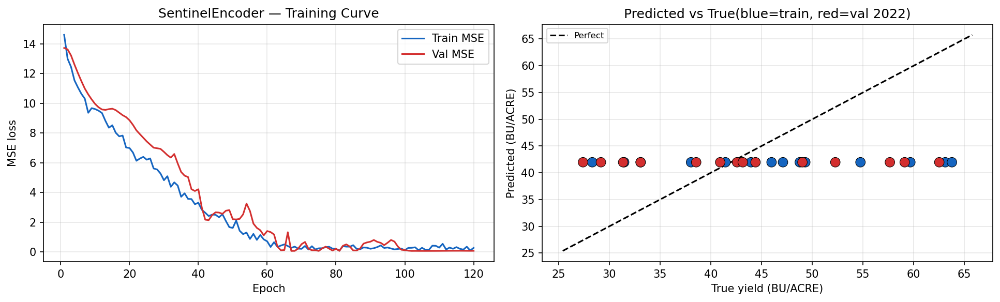


STEP 6 COMPLETE — Phase 2 Satellite Encoder
  Encoder backbone → e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\labels\sentinel_encoder.pt
  Full checkpoint  → e:\learnings\University Of Hull AI\assignment-september\MSc project\multimodal_agriculture_prediction-notebook_only\data\CropNet\labels\sentinel_phase2_ckpt.pt

  Train set  : 14 state-years (2021 × 15 states, AZ2022 excluded)
  Val set    : 14 state-years (2022 hold-out, LOSO)
  Val RMSE   : 11.04 BU/ACRE
  Embed dim  : 64  — ready for Step 7 GMU fusion

Next: Step 7 — Phase 3 GMU Fusion (weather BiLSTM + satellite encoder)


In [38]:
# ── Step 6.3  Training loop, LOSO evaluation, save encoder ────────────────────

import torch, numpy as np, pandas as pd, io
import matplotlib.pyplot as plt
from IPython.display import display, Image

print("=" * 60)
print("STEP 6.3 — TRAINING SentinelEncoder (Phase 2)")
print("=" * 60)

SENT_EPOCHS = 120
SENT_LR     = 1e-3
SENT_WD     = 1e-3

sent_criterion = torch.nn.MSELoss()
sent_optimizer = torch.optim.Adam(sent_model.parameters(), lr=SENT_LR, weight_decay=SENT_WD)
sent_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    sent_optimizer, mode="min", factor=0.5, patience=12, min_lr=1e-6
)

sent_train_losses, sent_val_losses = [], []
sent_best_val, sent_best_state = float("inf"), None

for ep in range(SENT_EPOCHS):
    sent_model.train()
    batch_losses = []
    for xb, yb in dl_s_train:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        sent_optimizer.zero_grad()
        pred, _ = sent_model(xb)
        loss = sent_criterion(pred, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(sent_model.parameters(), 1.0)
        sent_optimizer.step()
        batch_losses.append(loss.item())
    ep_train = float(np.mean(batch_losses))

    sent_model.eval()
    ep_val = float("nan")
    if len(ds_s_val) > 0:
        with torch.no_grad():
            for xv, yv in dl_s_val:
                xv, yv = xv.to(DEVICE), yv.to(DEVICE)
                pv, _ = sent_model(xv)
                ep_val = sent_criterion(pv, yv).item()
        sent_scheduler.step(ep_val)
        if ep_val < sent_best_val:
            sent_best_val = ep_val
            sent_best_state = {k: v.cpu().clone() for k, v in sent_model.state_dict().items()}
    else:
        sent_scheduler.step(ep_train)
        if ep_train < sent_best_val:
            sent_best_val = ep_train
            sent_best_state = {k: v.cpu().clone() for k, v in sent_model.state_dict().items()}

    sent_train_losses.append(ep_train)
    sent_val_losses.append(ep_val)
    if (ep + 1) % 20 == 0:
        lr_now = sent_optimizer.param_groups[0]["lr"]
        print(f"  Epoch {ep+1:>3}  train_mse={ep_train:.5f}  val_mse={ep_val:.5f}  lr={lr_now:.2e}")

if sent_best_state:
    sent_model.load_state_dict(sent_best_state)
print(f"Best val MSE: {sent_best_val:.5f}")

# ── Evaluation ─────────────────────────────────────────────────────────────────
sent_model.eval()
all_X = torch.tensor(np.array(images), dtype=torch.float32).to(DEVICE)
with torch.no_grad():
    sent_preds_log, sent_embeds = sent_model(all_X)
    sent_preds_log = sent_preds_log.cpu().numpy().flatten()
    sent_embeds    = sent_embeds.cpu().numpy()

sent_true_log = np.array(targets)

def _bu(v):
    return np.exp(v + JENSEN_SIGMA2 / 2.0) if USE_LOG else v

sent_preds_bu = _bu(sent_preds_log)
sent_true_bu  = _bu(sent_true_log)

eval_rows = []
for i, m in enumerate(meta_rows):
    eval_rows.append({"state": m["state_abbr"], "year": m["year"], "split": m["split"],
                      "true_bu": sent_true_bu[i], "pred_bu": sent_preds_bu[i],
                      "error_bu": sent_preds_bu[i] - sent_true_bu[i]})
eval_df = pd.DataFrame(eval_rows)

def _rmse(df): return float(np.sqrt(np.mean((df["pred_bu"] - df["true_bu"])**2)))
rmse_train_sent = _rmse(eval_df[eval_df["split"]=="train"]) if (eval_df["split"]=="train").any() else float("nan")
rmse_val_sent   = _rmse(eval_df[eval_df["split"]=="val"])   if (eval_df["split"]=="val").any()   else float("nan")

print()
print("=" * 60)
print("EVALUATION RESULTS")
print("=" * 60)
print(f"Train RMSE (BU/ACRE, Jensen-corrected) : {rmse_train_sent:.2f}")
print(f"Val   RMSE (BU/ACRE, LOSO 2022)        : {rmse_val_sent:.2f}")
print()
print("Per-state errors:")
print(eval_df.groupby("state").agg(
    true_bu=("true_bu","mean"), pred_bu=("pred_bu","mean"), bias=("error_bu","mean")
).round(2).to_string())

# ── Learning curve ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
ep_x = np.arange(1, SENT_EPOCHS + 1)
axes[0].plot(ep_x, sent_train_losses, label="Train MSE", color="#1565C0")
val_arr = np.array(sent_val_losses, dtype=float)
if not np.all(np.isnan(val_arr)):
    axes[0].plot(ep_x, val_arr, label="Val MSE", color="#D32F2F")
axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("MSE loss")
axes[0].set_title("SentinelEncoder — Training Curve")
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].scatter(eval_df["true_bu"], eval_df["pred_bu"],
                c=["#D32F2F" if s=="val" else "#1565C0" for s in eval_df["split"]],
                s=80, edgecolors="k", linewidths=0.5, zorder=3)
lo = min(eval_df["true_bu"].min(), eval_df["pred_bu"].min()) - 2
hi = max(eval_df["true_bu"].max(), eval_df["pred_bu"].max()) + 2
axes[1].plot([lo, hi], [lo, hi], "k--", lw=1.5, label="Perfect")
axes[1].set_xlabel("True yield (BU/ACRE)"); axes[1].set_ylabel("Predicted (BU/ACRE)")
axes[1].set_title("Predicted vs True(blue=train, red=val 2022)")
axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.3)
plt.tight_layout()
buf = io.BytesIO(); fig.savefig(buf, format="png", dpi=150, bbox_inches="tight")
buf.seek(0); display(Image(data=buf.read())); plt.close(fig)

# ── Save artefacts ──────────────────────────────────────────────────────────────
enc_path   = LABELS_DIR / "sentinel_encoder.pt"
ckpt_path2 = LABELS_DIR / "sentinel_phase2_ckpt.pt"

torch.save(sent_model.backbone.state_dict(), enc_path)
torch.save({
    "model_state_dict": sent_model.state_dict(),
    "model_config"    : {"class": "SentinelEncoder", "in_channels": 12,
                         "embed_dim": 64, "dropout": 0.4, "n_params": n_sent_params},
    "training_config" : {"n_epochs": SENT_EPOCHS, "lr": SENT_LR, "weight_decay": SENT_WD,
                         "criterion": "MSELoss", "split": "LOSO 2022",
                         "label_source": "state-aggregate USDA (all counties per state-year)"},
    "evaluation"      : {"train_rmse_bu": round(rmse_train_sent, 4),
                         "val_rmse_bu_loso2022": round(rmse_val_sent, 4),
                         "best_val_mse": round(sent_best_val, 6),
                         "n_train": len(ds_s_train), "n_val": len(ds_s_val)},
    "embed_dim"       : 64, "jensen_sigma2": JENSEN_SIGMA2,
}, ckpt_path2)

print()
print("=" * 60)
print("STEP 6 COMPLETE — Phase 2 Satellite Encoder")
print("=" * 60)
print(f"  Encoder backbone → {enc_path}")
print(f"  Full checkpoint  → {ckpt_path2}")
print()
print(f"  Train set  : {len(ds_s_train)} state-years (2021 × 15 states, AZ2022 excluded)")
print(f"  Val set    : {len(ds_s_val)} state-years (2022 hold-out, LOSO)")
print(f"  Val RMSE   : {rmse_val_sent:.2f} BU/ACRE")
print(f"  Embed dim  : 64  — ready for Step 7 GMU fusion")
print()
print("Next: Step 7 — Phase 3 GMU Fusion (weather BiLSTM + satellite encoder)")
